# Set Parameters Here

In [1]:
window_size = 31 # Rolling window size
selected_month = 9 # which month you want to examine
window_mean = 5 # e.g., 7-day low flow
temp_window_size = 31 # example: 3-day rolling window
min_temp_window_size = 31  # example: 3-day rolling window
lag = 1 # to lag data for prediction
import os 
rcp_85 = "off" # Which climate scenario for future data
low_flow = "On" # adjust for drought or peaks

In [2]:
# In[3]:

import os
current_directory = os.getcwd()
print("Current working directory:", current_directory)

Current working directory: C:\Users\Local Admin\OneDrive - Lower Kootenay Band\Documents\workspace_python


In [3]:
import pandas as pd
import numpy as np
import calendar

# These are legacy parameters from model testing 
fixed_params = "off"
fixed_one = "off"
p_value_pass = 0.70
threshold = 2.7 # Set your threshold value here
update_threshold = threshold
rolling_window_size = 1 # model smoother
mean_smooething = 1
# September Parameter set
#percent_sample = 0.6
nat_def = 0.0 
#total_useage = 5861313/((3*30)*86400) + 6158500/((365*86400)) + 33809/((365*86400)) + nat_def # Agriculture, Municipal, Water Bottling 
total_usage = nat_def
total_useage = nat_def
size = 1
detrend_a = "off"
print(total_useage)
precip_only = "On" 
precip_and_min = "off"
#total_useage = 5861313/((3*30)*86400) + 6158500/((365*86400)) + 33809/((365*86400)) + nat_def # Agriculture, Municipal, Water Bottling 

# Load the data from the CSV file
file_path = 'daily_20231214T2129.csv'  # Replace with your actual file path
data = pd.read_csv(file_path)

# Data cleaning and preparation
data = data.drop(index=0)  # assuming the first row needs to be dropped based on your provided script
data.columns = ['Station ID', 'Parameter', 'Type', 'Year', 'Day', 'Jan', 'Jan_SYM', 'Feb', 'Feb_SYM', 'Mar', 'Mar_SYM', 'Apr', 'Apr_SYM', 'May', 'May_SYM', 'Jun', 'Jun_SYM', 'Jul', 'Jul_SYM', 'Aug', 'Aug_SYM', 'Sep', 'Sep_SYM', 'Oct', 'Oct_SYM', 'Nov', 'Nov_SYM', 'Dec', 'Dec_SYM']
data['Year'] = pd.to_numeric(data['Year'], errors='coerce')
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
for month in months:
    data[month] = pd.to_numeric(data[month], errors='coerce')
data = data.drop(columns=['Station ID', 'Parameter', 'Type'] + [f'{month}_SYM' for month in months])

# Define window_mean for rolling window and select the month you are interested in

month_name = months[selected_month - 1]

results_list = []
for year in data['Year'].unique():
    # Extract monthly data for the year
    monthly_data = data[data['Year'] == year][month_name].dropna()

    # Check if the data is sufficient for rolling calculation
    if len(monthly_data) >= window_mean:
        # Calculate rolling mean
        rolling_mean = monthly_data.rolling(window=window_mean, min_periods=window_mean).mean()

        # Find the lowest 7-day average flow in the month
        if low_flow == "On":
            lowest_average_flow = rolling_mean.min()
        else:
            lowest_average_flow = rolling_mean.max()

        # Append results
        results_list.append({'Year': year, 'Month': month_name, '7-Day Average Low Flow': lowest_average_flow})

# Convert the list of dictionaries to a DataFrame
results = pd.DataFrame(results_list)

# Display or save the results
print(results)
# Save the results to an Excel file (optional)
output_file_path = '7_day_average_low_flow.xlsx'  # Replace with your desired file path
results.to_excel(output_file_path, index=False)

0.0
    Year Month  7-Day Average Low Flow
0   1914   Sep                   5.800
1   1915   Sep                   6.808
2   1917   Sep                   2.916
3   1918   Sep                   4.670
4   1919   Sep                   2.674
..   ...   ...                     ...
67  1990   Sep                   4.726
68  1991   Sep                   5.366
69  1992   Sep                   4.244
70  1993   Sep                   6.734
71  1994   Sep                   3.608

[72 rows x 3 columns]


   Year  Discharge
0  1914      5.800
1  1915      6.808
2  1917      2.916
3  1918      4.670
4  1919      2.674


Text(0, 0.5, 'Discharge (CUMEC)')

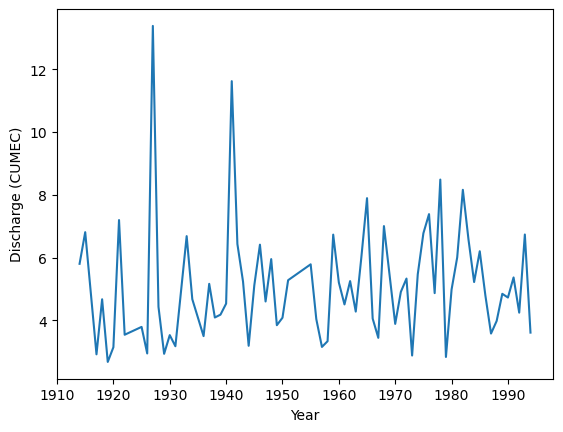

In [4]:
# In[6]:


import numpy as np
import matplotlib.pyplot as plt
# Path to the Excel file
excel_file_path = '7_day_average_low_flow.xlsx'   # Replace with the path to your Excel file

# Load the data from the Excel file
excel_data = pd.read_excel(excel_file_path)

# Select month for analysis (e.g., 8 for August, 9 for September)
month_name = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'][selected_month - 1]

# Filter the data to get only the selected month's low flows
selected_month_data = excel_data[excel_data['Month'] == month_name]

# Select the 'Year' and '7-Day Average Low Flow' columns
# Rename '7-Day Average Low Flow' to 'Discharge'
selected_month_time_series = selected_month_data[['Year', '7-Day Average Low Flow']].rename(columns={'7-Day Average Low Flow': 'Discharge'})

# Display the first few entries of the time series
print(selected_month_time_series.head())

plt.plot(selected_month_time_series['Year'], selected_month_time_series['Discharge'])
plt.xlabel('Year')
plt.ylabel('Discharge (CUMEC)')

## Extraction Algorithm for Climate Time Series 

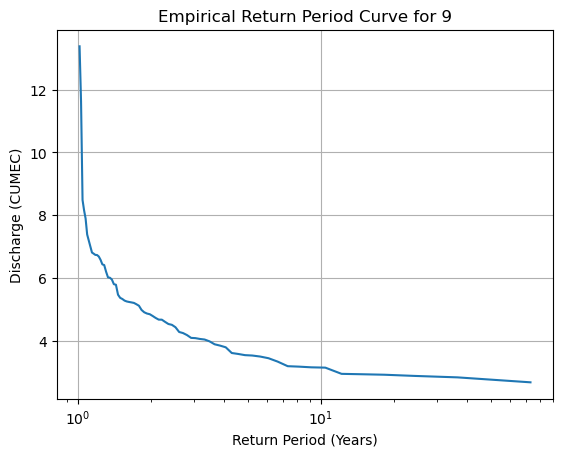

      Year  Month  Max_Temperature
5     1912      6             35.0
6     1912      7             29.4
7     1912      8             30.6
8     1912      9             23.9
9     1912     10             20.0
...    ...    ...              ...
1267  2017      8             35.0
1268  2017      9             33.0
1269  2017     10             19.5
1270  2017     11             14.0
1271  2017     12              5.5

[1258 rows x 3 columns]


Text(0, 0.5, 'Temperature Degrees C')

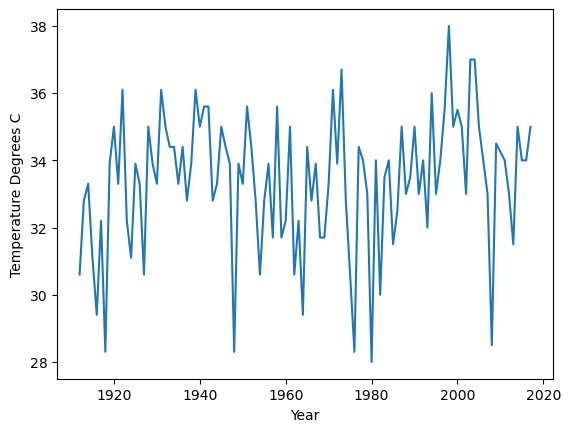

In [5]:
# In[7]:

# Data source https://climate.weather.gc.ca/climate_data/daily_data_e.html?hlyRange=%7C&dlyRange=1912-06-01%7C2017-12-31&mlyRange=1912-01-01%7C2007-02-01&StationID=1111&Prov=BC&urlExtension=_e.html&searchType=stnName&optLimit=yearRange&StartYear=1840&EndYear=2024&selRowPerPage=25&Line=0&searchMethod=contains&Month=12&Day=2&txtStationName=Creston&timeframe=2&Year=2017

if low_flow == "On":
    sorted_discharge = selected_month_time_series["Discharge"].sort_values(ascending=True)
else: 
    sorted_discharge = selected_month_time_series['Discharge'].sort_values(ascending=False)

# Calculate the rank for each discharge value
rank = np.arange(1, len(sorted_discharge) + 1)

# Calculate the empirical probability (EP)
N = len(sorted_discharge)
empirical_probability = rank / (N + 1)

# Calculate the return period (RP)
return_period = 1 / empirical_probability

# Plotting the return period curve
plt.plot(return_period, sorted_discharge)
plt.xscale('log')  # Optional: Log scale can sometimes provide better visualization
plt.ylabel('Discharge (CUMEC)')
plt.xlabel('Return Period (Years)')
plt.title(f'Empirical Return Period Curve for {selected_month}')
plt.grid(True)
plt.show()

csv_file_path = "filtered_CRESTON_climate_data.csv"

# Read the CSV file into a DataFrame
df = pd.read_csv(csv_file_path, low_memory=False)

# Convert 'Date/Time' to a datetime object
df['Date/Time'] = pd.to_datetime(df['Date/Time'])

# Create new columns for the year and month
df['Year'] = df['Date/Time'].dt.year
df['Month'] = df['Date/Time'].dt.month

# Group by 'Year' and 'Month' and find the maximum temperature for each year for each month
max_temp_by_year_month = df.groupby(['Year', 'Month'])['max_temp'].max().reset_index(name='Max_Temperature').dropna()

# Display the result
print(max_temp_by_year_month)

# Filter the DataFrame to include only the rows with the maximum temperature for the selected month
selected_month_max_temp = max_temp_by_year_month[max_temp_by_year_month['Month'] == selected_month - lag]

# Display the result
temp = selected_month_max_temp['Max_Temperature']

import matplotlib.pyplot as plt  # Importing necessary libraries

plt.plot(selected_month_max_temp['Year'], temp)
plt.xlabel('Year')
plt.ylabel('Temperature Degrees C')

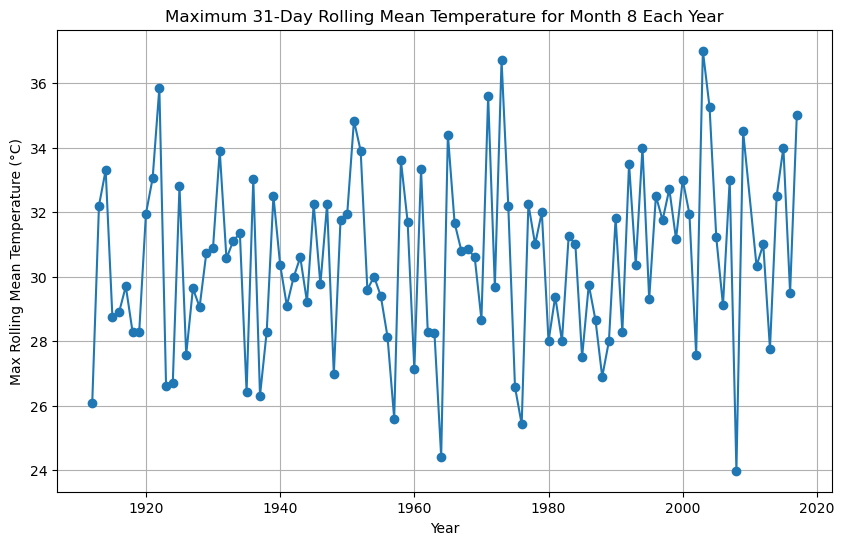

      Year  Month  Min_Temperature
5     1912      6              2.2
6     1912      7              4.4
7     1912      8              2.8
8     1912      9             -1.7
9     1912     10             -6.1
...    ...    ...              ...
1267  2017      8              9.0
1268  2017      9              3.0
1269  2017     10             -3.0
1270  2017     11             -5.0
1271  2017     12            -13.0

[1258 rows x 3 columns]


Text(0, 0.5, 'Temperature Degrees C')

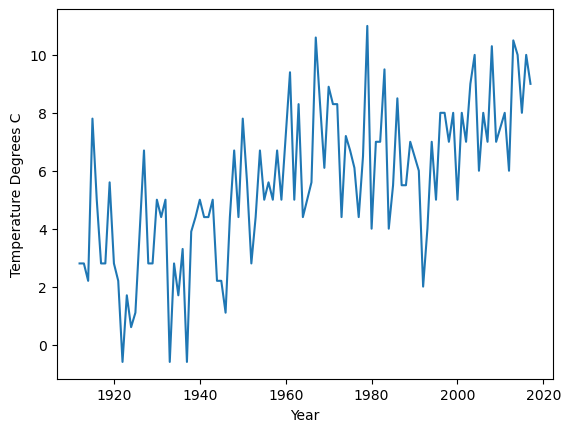

In [6]:
# In[8]:


import pandas as pd
import matplotlib.pyplot as plt

csv_file_path = "filtered_CRESTON_climate_data.csv"  # CSV file path

# Read the CSV file into a DataFrame
df = pd.read_csv(csv_file_path, low_memory=False)

# Convert 'Date/Time' to a datetime object
df['Date/Time'] = pd.to_datetime(df['Date/Time'])

# Create new columns for the year and month
df['Year'] = df['Date/Time'].dt.year
df['Month'] = df['Date/Time'].dt.month

# Assume 'max_temp' is the column for temperature
# Set the selected month, lag, and window size for rolling mean

# Filter the DataFrame to include only the rows for the selected month
df_selected_month = df[df['Month'] == (selected_month - lag)]

# Apply rolling mean on the temperature column within each month and year
rolling_means = df_selected_month.groupby(['Year', 'Month'])['max_temp'].rolling(window=temp_window_size, min_periods=1).mean()
rolling_means = rolling_means.reset_index(level=['Year', 'Month'])  # Resetting the index

# Merge the rolling means back into the original DataFrame
df_selected_month = df_selected_month.merge(rolling_means, on=['Year', 'Month', df_selected_month.index], suffixes=('', '_Rolling'))

# Find the maximum rolling mean temperature for each year
max_temp_by_year = df_selected_month.groupby('Year')['max_temp_Rolling'].max().reset_index(name='Max_Temperature').dropna()

selected_month_max_temp = max_temp_by_year

temp = selected_month_max_temp

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(max_temp_by_year['Year'], max_temp_by_year['Max_Temperature'], marker='o', linestyle='-')
plt.xlabel('Year')
plt.ylabel('Max Rolling Mean Temperature (°C)')
plt.title(f'Maximum {temp_window_size}-Day Rolling Mean Temperature for Month {selected_month - lag} Each Year')
plt.grid(True)
plt.show()

import pandas as pd  # Importing necessary libraries

csv_file_path = "filtered_CRESTON_climate_data.csv"

# Read the CSV file into a DataFrame
df = pd.read_csv(csv_file_path, low_memory=False)

# Convert 'Date/Time' to a datetime object
df['Date/Time'] = pd.to_datetime(df['Date/Time'])

# Create new columns for the year and month
df['Year'] = df['Date/Time'].dt.year
df['Month'] = df['Date/Time'].dt.month

# Group by 'Year' and 'Month' and find the maximum temperature for each year for each month
min_temp_by_year_month = df.groupby(['Year', 'Month'])['min_temp'].min().reset_index(name='Min_Temperature').dropna()

# Display the result
print(min_temp_by_year_month)

# Filter the DataFrame to include only the rows with the maximum temperature for the selected month
selected_month_min_temp = min_temp_by_year_month[min_temp_by_year_month['Month'] == selected_month - lag]

# Display the result
temp_min = selected_month_min_temp['Min_Temperature']

import matplotlib.pyplot as plt  # Importing necessary libraries

plt.plot(selected_month_min_temp['Year'], temp_min)
plt.xlabel('Year')
plt.ylabel('Temperature Degrees C')

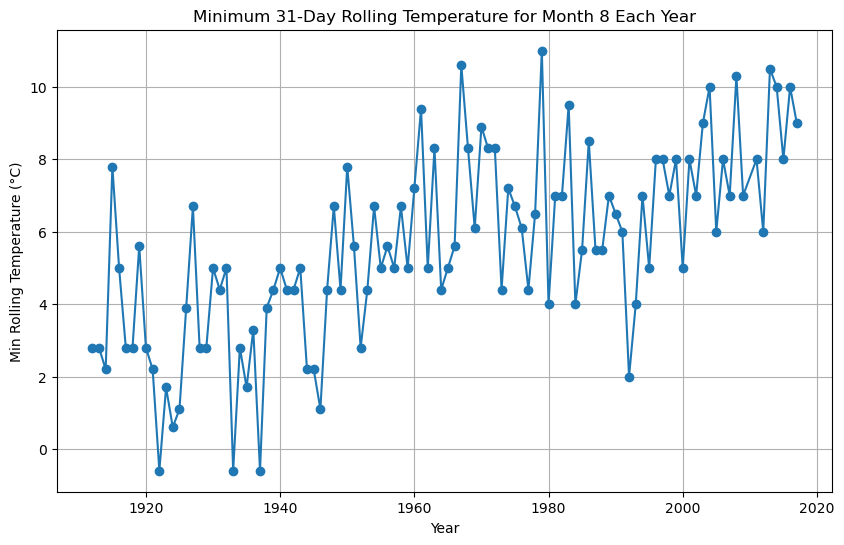

In [7]:
# In[9]:


import pandas as pd
import matplotlib.pyplot as plt

csv_file_path = "filtered_CRESTON_climate_data.csv"  # CSV file path

# Read the CSV file into a DataFrame
df = pd.read_csv(csv_file_path, low_memory=False)

# Convert 'Date/Time' to a datetime object
df['Date/Time'] = pd.to_datetime(df['Date/Time'])

# Create new columns for the year and month
df['Year'] = df['Date/Time'].dt.year
df['Month'] = df['Date/Time'].dt.month

# Filter the DataFrame to include only the rows for the selected month
df_selected_month = df[df['Month'] == (selected_month - lag)].copy()

# Apply rolling minimum on the temperature column within each month and year
df_selected_month['min_temp_Rolling'] = df_selected_month.groupby(['Year', 'Month'])['min_temp'].transform(lambda x: x.rolling(window=min_temp_window_size, min_periods=1).min())

# Find the minimum rolling mean temperature for each year
min_temp_by_year = df_selected_month.groupby('Year')['min_temp_Rolling'].min().reset_index(name='Min_Temperature').dropna()

selected_month_min_temp = min_temp_by_year

temp_min = selected_month_min_temp

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(min_temp_by_year['Year'], min_temp_by_year['Min_Temperature'], marker='o', linestyle='-')
plt.xlabel('Year')
plt.ylabel('Min Rolling Temperature (°C)')
plt.title(f'Minimum {temp_window_size}-Day Rolling Temperature for Month {selected_month - lag} Each Year')
plt.grid(True)
plt.show()

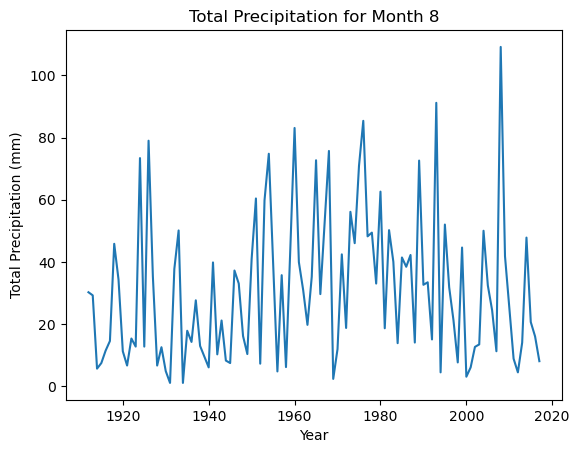

In [8]:
# In[10]:


import pandas as pd
import matplotlib.pyplot as plt

# Assuming csv_file_path is correctly defined
csv_file_path = "filtered_CRESTON_climate_data.csv"

# Read the CSV file into a DataFrame
df = pd.read_csv(csv_file_path, low_memory=False)

# Convert 'Date/Time' to a datetime object
df['Date/Time'] = pd.to_datetime(df['Date/Time'])

# Create new columns for the year and month
df['Year'] = df['Date/Time'].dt.year
df['Month'] = df['Date/Time'].dt.month

# Group by 'Year' and 'Month' and sum the total precipitation
total_precip_by_year_month = df.groupby(['Year', 'Month'])['Total Precip (mm)'].sum().reset_index(name='total_precip').dropna()

# Filter for the selected month and remove rows with zero precipitation
selected_month_total_precip = total_precip_by_year_month[(total_precip_by_year_month['Month'] == selected_month - lag) & (total_precip_by_year_month['total_precip'] > 0)].dropna()
precip = selected_month_total_precip['total_precip']
# Plot the total precipitation by year for the selected month
plt.plot(selected_month_total_precip['Year'], selected_month_total_precip['total_precip'])
plt.xlabel('Year')
plt.ylabel('Total Precipitation (mm)')
plt.title(f'Total Precipitation for Month {selected_month - lag}')
plt.show()

In [9]:
# In[11]:
# https://xiaoganghe.github.io/python-climate-visuals/chapters/data-analytics/scipy-basic.html

from scipy.stats import genextreme as gev

import numpy as np

from scipy.signal import detrend

# Calculate samples L-moments

def samlmom3(sample):
    """
    samlmom3 returns the first three L-moments of samples
    sample is the 1-d array
    n is the total number of the samples, j is the j_th sample
    """
    n = len(sample)
    sample = np.sort(sample.reshape(n))[::-1]
    b0 = np.mean(sample)
    b1 = np.array([(n - j - 1) * sample[j] / n / (n - 1)
                   for j in range(n)]).sum()
    b2 = np.array([(n - j - 1) * (n - j - 2) * sample[j] / n / (n - 1) / (n - 2)
                   for j in range(n - 1)]).sum()
    lmom1 = b0
    lmom2 = 2 * b1 - b0
    lmom3 = 6 * (b2 - b1) + b0

    return lmom1, lmom2, lmom3

In [10]:
from scipy import special
import math

def pargev(lmom):
    """
    pargev returns the parameters of the Generalized Extreme Value 
    distribution given the L-moments of samples
    """
    lmom_ratios = [lmom[0], lmom[1], lmom[2]/lmom[1]]
    
    SMALL = 1e-5
    eps = 1e-6
    maxit = 20
    
    # EU IS EULER'S CONSTANT
    EU = 0.57721566
    DL2 = math.log(2)
    DL3 = math.log(3)

    # COEFFICIENTS OF RATIONAL-FUNCTION APPROXIMATIONS FOR XI
    A0 = 0.28377530
    A1 = -1.21096399
    A2 = -2.50728214
    A3 = -1.13455566
    A4 = -0.07138022
    B1 = 2.06189696
    B2 = 1.31912239
    B3 = 0.25077104
    C1 = 1.59921491
    C2 = -0.48832213
    C3 = 0.01573152
    D1 = -0.64363929
    D2 = 0.08985247
    
    T3 = lmom_ratios[2]
    if lmom_ratios[1] <= 0 or abs(T3) >= 1:
        raise ValueError("Invalid L-Moments")
    
    if T3 <= 0:
        G = (A0 + T3 * (A1 + T3 * (A2 + T3 * (A3 + T3 * A4)))) / (1 + T3 * (B1 + T3 * (B2 + T3 * B3)))

        if T3 >= -0.8:
            para3 = G
            GAM = math.exp(special.gammaln(1 + G))
            para2 = lmom_ratios[1] * G / (GAM * (1 - 2**-G))
            para1 = lmom_ratios[0] - para2 * (1 - GAM) / G
            return para1, para2, para3
        elif T3 <= -0.97:
            G = 1 - math.log(1 + T3) / DL2

        T0 = (T3 + 3) * 0.5
        for IT in range(1, maxit):
            X2 = 2 ** -G
            X3 = 3 ** -G
            XX2 = 1 - X2
            XX3 = 1 - X3
            T = XX3 / XX2
            DERIV = (XX2 * X3 * DL3 - XX3 * X2 * DL2) / (XX2**2)
            GOLD = G
            G -= (T - T0) / DERIV

            if abs(G - GOLD) <= eps * G:
                para3 = G
                GAM = math.exp(special.gammaln(1 + G))
                para2 = lmom_ratios[1] * G / (GAM * (1 - 2**-G))
                para1 = lmom_ratios[0] - para2 * (1 - GAM) / G
                return para1, para2, para3
        raise Exception("Iteration has not converged")
    else:
        Z = 1 - T3
        G = (-1 + Z * (C1 + Z * (C2 + Z * C3))) / (1 + Z * (D1 + Z * D2))
        if abs(G) < SMALL:
            para2 = lmom_ratios[1] / DL2
            para1 = lmom_ratios[0] - EU * para2
            para3 = 0
        else:
            para3 = G
            GAM = math.exp(special.gammaln(1 + G))
            para2 = lmom_ratios[1] * G / (GAM * (1 - 2**-G))
            para1 = lmom_ratios[0] - para2 * (1 - GAM) / G
        return para1, para2, para3

In [11]:
# In[12]:

import numpy as np
from scipy.stats import genextreme as gev
from scipy.signal import detrend


def fit_gev(detrended_signal):
    LMM = samlmom3(detrended_signal)
    loc1, scale1, c1 = pargev(LMM)
    return loc1, scale1, c1

In [12]:
# In[13]:


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def find_overlapping_years(dataset1, dataset2, dataset3, dataset4):
    """
    Find the first occurrence of overlapping years among four datasets and their indices.
    """
    # Find overlapping years among all datasets
    overlap_years = set(dataset1).intersection(dataset2, dataset3, dataset4)

    # Sort the overlapping years to ensure indices are in order
    sorted_overlap_years = sorted(overlap_years)

    # Function to find first occurrence indices for overlapping years in a dataset
    def find_indices(dataset, sorted_overlap_years):
        indices = []
        for year in sorted_overlap_years:
            try:
                index = dataset.index(year)
                indices.append(index)
            except ValueError:
                pass  # Year not found in dataset
        return indices

    # Get indices of the first occurrence of overlapping years in each dataset
    indices_dataset1 = find_indices(dataset1, sorted_overlap_years)
    indices_dataset2 = find_indices(dataset2, sorted_overlap_years)
    indices_dataset3 = find_indices(dataset3, sorted_overlap_years)
    indices_dataset4 = find_indices(dataset4, sorted_overlap_years)

    return np.array(sorted_overlap_years), indices_dataset1, indices_dataset2, indices_dataset3, indices_dataset4

# Example usage
# Replace these with your actual datasets
overlap_years, indices_1, indices_2, indices_3, indices_4 = find_overlapping_years(
    selected_month_time_series['Year'].tolist(),
    selected_month_total_precip['Year'].tolist(),
    selected_month_min_temp['Year'].tolist(),
    selected_month_max_temp['Year'].tolist(),
)

# Print results
print("Overlapping Years:", overlap_years)
print("Indices in Seven_Day_Flow_Goat:", indices_1)
print("Indices in selected_month_total_precip:", indices_2)
print("Indices in selected_month_min_temp:", indices_3)
print("Indices in selected_month_max_temp:", indices_4)

Overlapping Years: [1914 1915 1917 1918 1919 1920 1921 1922 1925 1926 1927 1928 1929 1930
 1931 1933 1934 1936 1937 1938 1940 1941 1942 1943 1944 1945 1946 1947
 1948 1949 1950 1951 1956 1957 1958 1959 1960 1961 1962 1963 1964 1965
 1966 1968 1970 1971 1972 1973 1974 1975 1976 1977 1978 1979 1980 1981
 1982 1983 1984 1985 1986 1987 1988 1989 1990 1991 1992 1993 1994]
Indices in Seven_Day_Flow_Goat: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]
Indices in selected_month_total_precip: [2, 3, 5, 6, 7, 8, 9, 10, 13, 14, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
Indices in selected_m

In [13]:
# In[14]:


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def find_overlapping_years_since_1995(*datasets):
    """
    Find the overlapping years among given datasets and their indices, considering only years >= 1995.
    """
    if len(datasets) < 2:
        raise ValueError("At least two datasets are required for comparison.")

    # Filter each dataset to only include years >= 1995
    filtered_datasets = [set(filter(lambda x: x >= 1995, dataset)) for dataset in datasets]

    # Find overlapping years
    overlap_years = set.intersection(*filtered_datasets)
    sorted_overlap_years = sorted(overlap_years)

    # Function to find indices for overlapping years in a dataset
    def find_indices(dataset, sorted_overlap_years):
        return [dataset.index(year) for year in sorted_overlap_years if year in dataset]

    # Get indices of the overlapping years in each dataset
    indices_for_datasets = [find_indices(dataset, sorted_overlap_years) for dataset in datasets]

    return np.array(sorted_overlap_years), indices_for_datasets

# Example usage
overlap_years, indices_for_datasets = find_overlapping_years_since_1995(
    selected_month_total_precip['Year'].tolist(),
    selected_month_min_temp['Year'].tolist(),
    selected_month_max_temp['Year'].tolist(),
)

# Print results
print("Overlapping Years:", overlap_years)
for i, indices in enumerate(indices_for_datasets):
    print(f"Indices in dataset {i+1}:", indices)


precip_indices = np.array(indices_for_datasets[0])
min_temp_indices = np.array(indices_for_datasets[1])
max_temp_indices = np.array(indices_for_datasets[2])

total_precip_indices = np.concatenate((indices_2, precip_indices))
total_min_temp_indices = np.concatenate((indices_3, min_temp_indices))
total_max_temp_indices = np.concatenate((indices_4, max_temp_indices))

Overlapping Years: [1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008
 2009 2011 2012 2013 2014 2015 2016 2017]
Indices in dataset 1: [80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101]
Indices in dataset 2: [83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104]
Indices in dataset 3: [83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104]


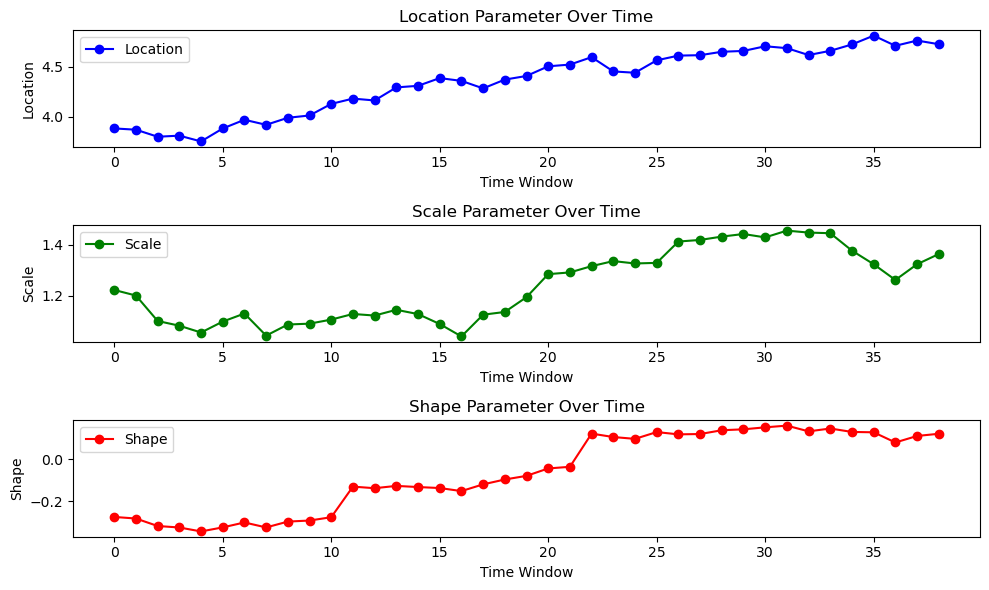

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import genextreme as gev
from scipy.signal import detrend

# Assuming 'temperature_residual' is your original dataset
original_signal = np.array(selected_month_time_series['Discharge'])[indices_1]

# Define the window size and initialize the list to store GEV parameters
gev_parameters_list = []

# Iterate through moving time windows
for i in range(len(original_signal) - window_size + 1):  # Corrected to include the last window
    # Extract a window of the original signal
    window_data = original_signal[i: i + window_size]

    # Detrend the windowed signal
    detrended_signal = np.array(window_data) # Make sure to actually detrend

    # Fit a GEV distribution to the detrended windowed signal
    loc, scale, shape = fit_gev(detrended_signal)  # Fit function returns shape, loc, scale

    # Append the GEV parameters to the list
    gev_parameters_list.append((loc, scale, shape))

# Extract individual parameter arrays for plotting
loc_array, scale_array, shape_array = zip(*gev_parameters_list)

# Calculate min and max of scale and shape parameters
min_scale = min(scale_array)
max_scale = max(scale_array)
min_shape = min(shape_array)
max_shape = max(shape_array)

# Store min and max as variables
min_scale_value = min_scale
max_scale_value = max_scale
min_shape_value = min_shape
max_shape_value = max_shape

# Assuming the time axis is the index of your array
time_axis = np.arange(len(gev_parameters_list))

# Plot GEV parameters over time
plt.figure(figsize=(10, 6))

plt.subplot(3, 1, 1)
plt.plot(time_axis, loc_array, marker='o', linestyle='-', color='blue', label='Location')
plt.title('Location Parameter Over Time')
plt.xlabel('Time Window')
plt.ylabel('Location')
plt.legend()

plt.subplot(3, 1, 2)
plt.plot(time_axis, scale_array, marker='o', linestyle='-', color='green', label='Scale')
plt.title('Scale Parameter Over Time')
plt.xlabel('Time Window')
plt.ylabel('Scale')
plt.legend()

plt.subplot(3, 1, 3)
plt.plot(time_axis, shape_array, marker='o', linestyle='-', color='red', label='Shape')
plt.title('Shape Parameter Over Time')
plt.xlabel('Time Window')
plt.ylabel('Shape')
plt.legend()

plt.tight_layout()
plt.show()


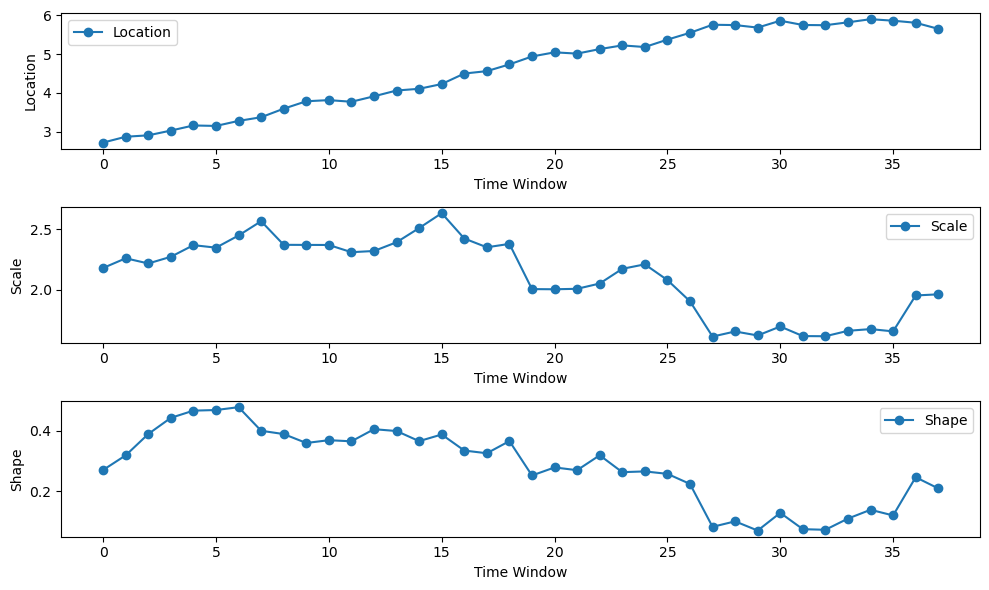

In [15]:
# In[18]:


import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import genextreme as gev
from scipy.signal import detrend

# Assuming 'temperature_residual' is your original dataset
original_signal = np.array(selected_month_min_temp['Min_Temperature'])[indices_3]

# Define the window size and initialize the array to store GEV parameters
gev_parameters_array = []

# Iterate through moving time windows
for i in range(len(original_signal) - window_size):
    # Extract a window of the original signal
    window_data = original_signal[i : i + window_size]

    # Detrend the windowed signal
    detrended_signal = np.array(window_data)

    # Fit a GEV distribution to the detrended windowed signal
    loc1, scale1, c1 = fit_gev(detrended_signal)

    # Append the GEV parameters to the array
    gev_parameters_array.append((loc1, scale1, c1))

    # Your additional code for L-moment ratio diagrams would go here
    # ...

# Now you have an array of GEV parameters for each moving window
# You can use these parameters for further analysis, such as L-moment ratio diagrams

import numpy as np
import matplotlib.pyplot as plt

# Extract individual parameter arrays for plotting
loc_array, scale_array, shape_array = zip(*gev_parameters_array)

# Assuming the time axis is the index of your array
time_axis = np.arange(len(gev_parameters_array))

# Plot GEV parameters over time
plt.figure(figsize=(10, 6))

plt.subplot(3, 1, 1)
plt.plot(time_axis, loc_array, marker='o', label='Location')
plt.xlabel('Time Window')
plt.ylabel('Location')
plt.legend()

plt.subplot(3, 1, 2)
plt.plot(time_axis, scale_array, marker='o', label='Scale')
plt.xlabel('Time Window')
plt.ylabel('Scale')
plt.legend()

plt.subplot(3, 1, 3)
plt.plot(time_axis, shape_array, marker='o', label='Shape')
plt.xlabel('Time Window')
plt.ylabel('Shape')
plt.legend()

plt.tight_layout()
plt.show()

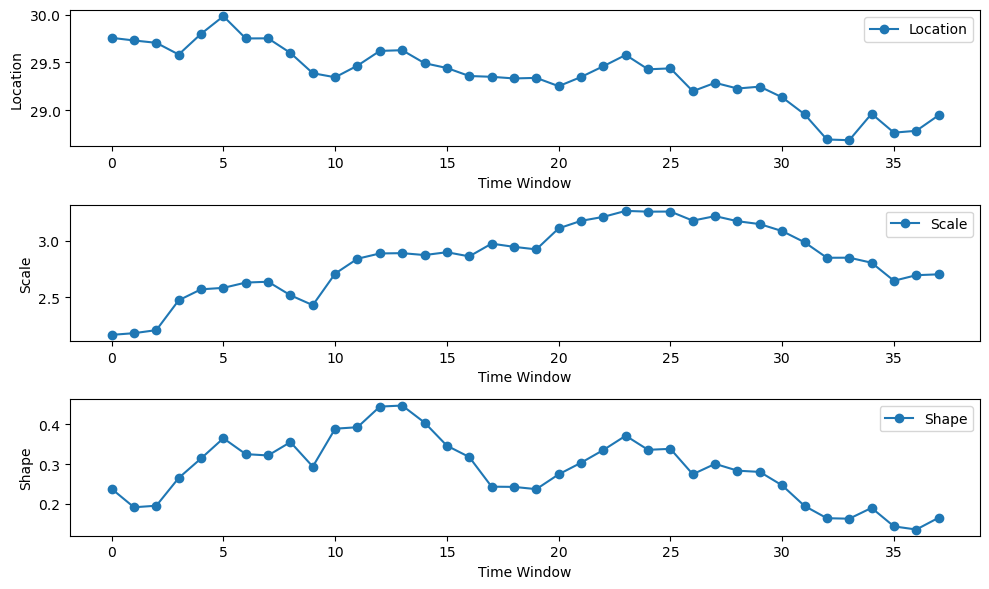

In [16]:
# In[19]:


import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import genextreme as gev
from scipy.signal import detrend

# Assuming 'temperature_residual' is your original dataset
original_signal = np.array(selected_month_max_temp['Max_Temperature'])[indices_4]

# Define the window size and initialize the array to store GEV parameters
gev_parameters_array = []

# Iterate through moving time windows
for i in range(len(original_signal) - window_size):
    # Extract a window of the original signal
    window_data = original_signal[i : i + window_size]

    # Detrend the windowed signal
    detrended_signal = np.array(window_data)

    # Fit a GEV distribution to the detrended windowed signal
    loc1, scale1, c1 = fit_gev(detrended_signal)

    # Append the GEV parameters to the array
    gev_parameters_array.append((loc1, scale1, c1))

    # Your additional code for L-moment ratio diagrams would go here
    # ...

# Now you have an array of GEV parameters for each moving window
# You can use these parameters for further analysis, such as L-moment ratio diagrams

import numpy as np
import matplotlib.pyplot as plt

# Extract individual parameter arrays for plotting
loc_array, scale_array, shape_array = zip(*gev_parameters_array)

# Assuming the time axis is the index of your array
time_axis = np.arange(len(gev_parameters_array))

# Plot GEV parameters over time
plt.figure(figsize=(10, 6))

plt.subplot(3, 1, 1)
plt.plot(time_axis, loc_array, marker='o', label='Location')
plt.xlabel('Time Window')
plt.ylabel('Location')
plt.legend()

plt.subplot(3, 1, 2)
plt.plot(time_axis, scale_array, marker='o', label='Scale')
plt.xlabel('Time Window')
plt.ylabel('Scale')
plt.legend()

plt.subplot(3, 1, 3)
plt.plot(time_axis, shape_array, marker='o', label='Shape')
plt.xlabel('Time Window')
plt.ylabel('Shape')
plt.legend()

plt.tight_layout()
plt.show()

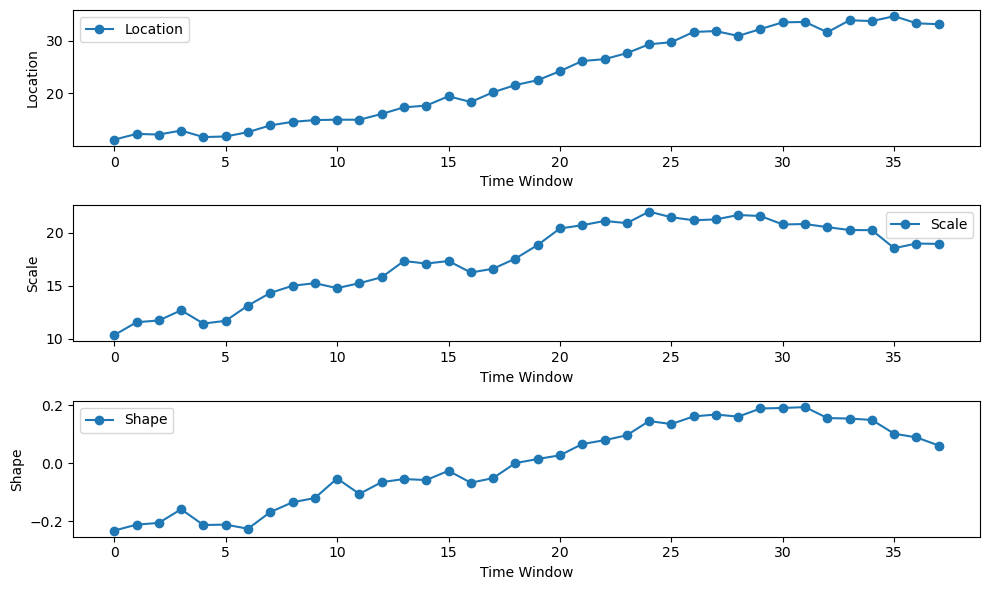

In [17]:
# In[20]:


# Assuming 'temperature_residual' is your original dataset
original_signal = np.array(selected_month_total_precip['total_precip'])[indices_2]

# Define the window size and initialize the array to store GEV parameters
gev_parameters_array = []

# Iterate through moving time windows
for i in range(len(original_signal) - window_size):
    # Extract a window of the original signal
    window_data = original_signal[i : i + window_size]

    # Detrend the windowed signal
    detrended_signal = np.array(window_data)

    # Fit a GEV distribution to the detrended windowed signal
    loc1, scale1, c1 = fit_gev(detrended_signal)

    # Append the GEV parameters to the array
    gev_parameters_array.append((loc1, scale1, c1))

    # Your additional code for L-moment ratio diagrams would go here
    # ...

# Now you have an array of GEV parameters for each moving window
# You can use these parameters for further analysis, such as L-moment ratio diagrams

# Extract individual parameter arrays for plotting
loc_array, scale_array, shape_array = zip(*gev_parameters_array)

# Assuming the time axis is the index of your array
time_axis = np.arange(len(gev_parameters_array))

# Plot GEV parameters over time
plt.figure(figsize=(10, 6))

plt.subplot(3, 1, 1)
plt.plot(time_axis, loc_array, marker='o', label='Location')
plt.xlabel('Time Window')
plt.ylabel('Location')
plt.legend()

plt.subplot(3, 1, 2)
plt.plot(time_axis, scale_array, marker='o', label='Scale')
plt.xlabel('Time Window')
plt.ylabel('Scale')
plt.legend()

plt.subplot(3, 1, 3)
plt.plot(time_axis, shape_array, marker='o', label='Shape')
plt.xlabel('Time Window')
plt.ylabel('Shape')
plt.legend()

plt.tight_layout()
plt.show()

Percentage of passing windows for Kolmogorov-Smirnov (KS): 100.00% assuming p-value of 0.7


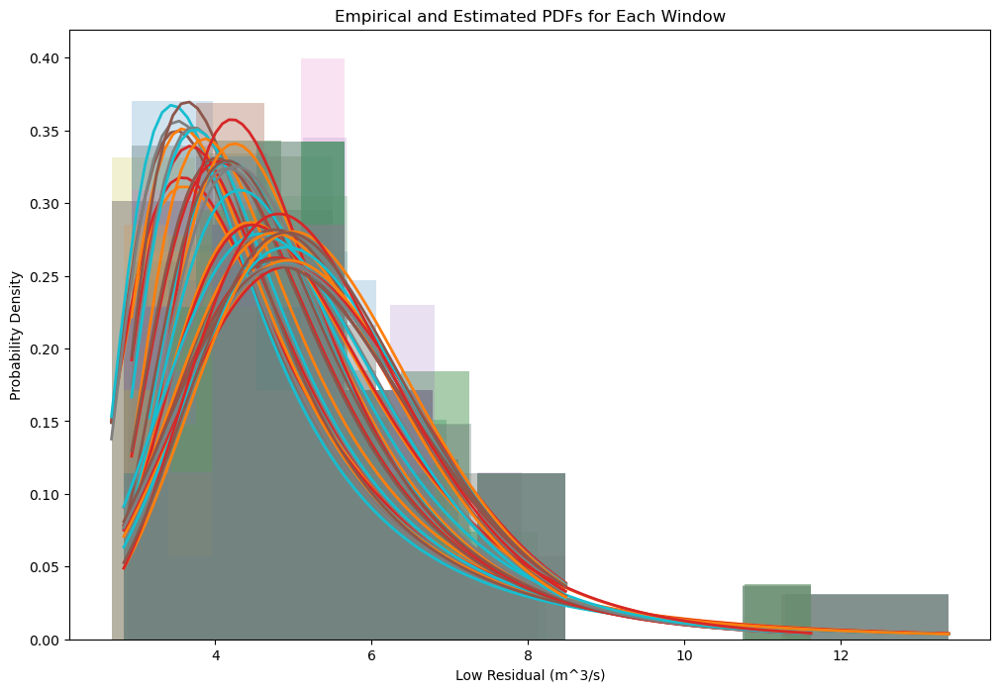

In [18]:
# In[21]:


import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import genextreme as gev
from scipy.stats import kstest
from scipy.signal import detrend

# Assuming 'temperature_residual' is your original dataset
original_signal = np.array(selected_month_time_series['Discharge'])[indices_1]


# Define the window size and initialize the array to store GEV parameters
gev_parameters_array = []

# Set up the figure
plt.figure(figsize=(12, 8))

# Counter for passing windows
pass_count = 0

# Iterate through moving time windows
for i in range(len(original_signal) - window_size):
    # Extract a window of the original signal
    window_data = original_signal[i : i + window_size]

    # Detrend the windowed signal
    detrended_signal = np.array(window_data)

    # Fit a GEV distribution to the detrended windowed signal
    loc1, scale1, c1 = fit_gev(detrended_signal)
    gev_parameters_array.append((loc1, scale1, c1))

    # Fit GEV distribution to the detrended windowed signal
    gev_dist = gev(c1, loc=loc1, scale=scale1)

    # Perform KS test
    ks_statistic, ks_pvalue = kstest(detrended_signal, gev_dist.cdf)

    # Plot empirical PDF for each window
    plt.hist(detrended_signal, density=True, histtype='stepfilled',
             alpha=0.2)

    # Plot estimated PDF based on the method of L-moments
    bins = np.linspace(detrended_signal.min(), detrended_signal.max(), 100)
    plt.plot(bins, gev_dist.pdf(bins), lw=2)

    # Check if the window passes the KS test (you can adjust this threshold)
    if ks_pvalue > p_value_pass:
        pass_count += 1

# Calculate the percentage of passing windows
pass_percentage = (pass_count / (len(original_signal) - window_size)) * 100

# Add labels
plt.xlabel("Low Residual (m^3/s)")
plt.ylabel('Probability Density')
plt.title('Empirical and Estimated PDFs for Each Window')

# Print the percentage of passing windows
print(f'Percentage of passing windows for Kolmogorov-Smirnov (KS): {pass_percentage:.2f}% assuming p-value of {p_value_pass}')

plt.show()

Percentage of passing windows for Kolmogorov-Smirnov (KS): 52.63% assuming p-value of 0.7


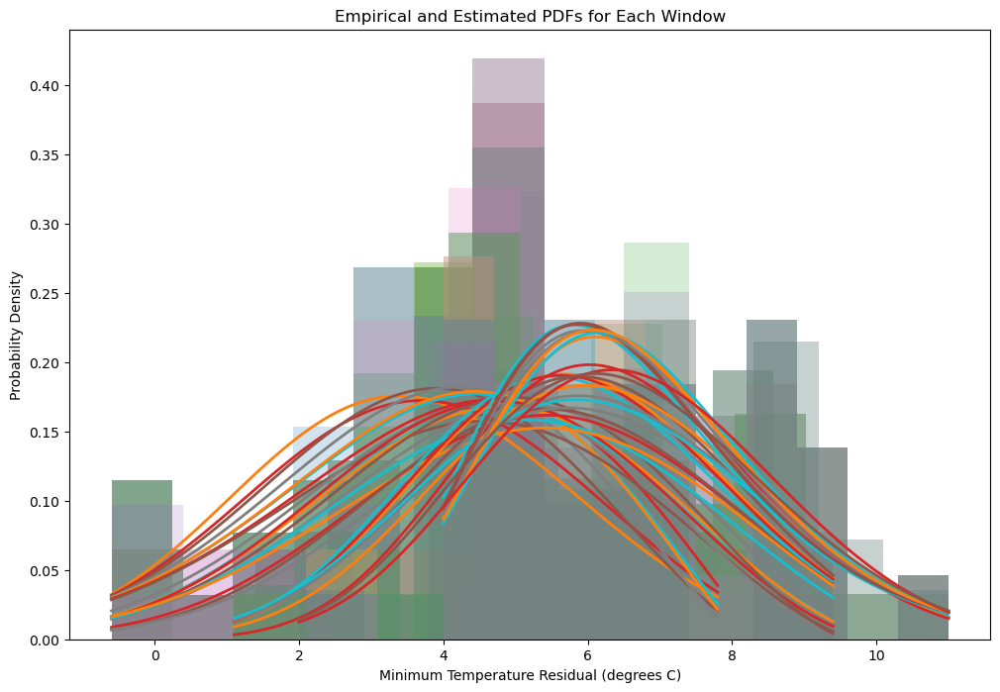

In [19]:
# In[22]:


import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import genextreme as gev
from scipy.stats import kstest
from scipy.signal import detrend

# Assuming 'temperature_residual' is your original dataset
original_signal = np.array(selected_month_min_temp['Min_Temperature'])[indices_3]

# Define the window size and initialize the array to store GEV parameters
gev_parameters_array = []

# Set up the figure
plt.figure(figsize=(12, 8))

# Counter for passing windows
pass_count = 0

# Iterate through moving time windows
for i in range(len(original_signal) - window_size):
    # Extract a window of the original signal
    window_data = original_signal[i : i + window_size]

    # Detrend the windowed signal
    detrended_signal = np.array(window_data)

    # Fit a GEV distribution to the detrended windowed signal
    loc1, scale1, c1 = fit_gev(detrended_signal)
    gev_parameters_array.append((loc1, scale1, c1))

    # Fit GEV distribution to the detrended windowed signal
    gev_dist = gev(c1, loc=loc1, scale=scale1)

    # Perform KS test
    ks_statistic, ks_pvalue = kstest(detrended_signal, gev_dist.cdf)

    # Plot empirical PDF for each window
    plt.hist(detrended_signal, density=True, histtype='stepfilled',
             alpha=0.2)

    # Plot estimated PDF based on the method of L-moments
    bins = np.linspace(detrended_signal.min(), detrended_signal.max(), 100)
    plt.plot(bins, gev_dist.pdf(bins), lw=2)

    # Check if the window passes the KS test (you can adjust this threshold)
    if ks_pvalue > p_value_pass:
        pass_count += 1

# Calculate the percentage of passing windows
pass_percentage = (pass_count / (len(original_signal) - window_size)) * 100

# Add labels
plt.xlabel("Minimum Temperature Residual (degrees C)")
plt.ylabel('Probability Density')
plt.title('Empirical and Estimated PDFs for Each Window')

# Print the percentage of passing windows
print(f'Percentage of passing windows for Kolmogorov-Smirnov (KS): {pass_percentage:.2f}% assuming p-value of {p_value_pass}')

plt.show()

Percentage of passing windows for Kolmogorov-Smirnov (KS): 100.00% assuming p-value of 0.7


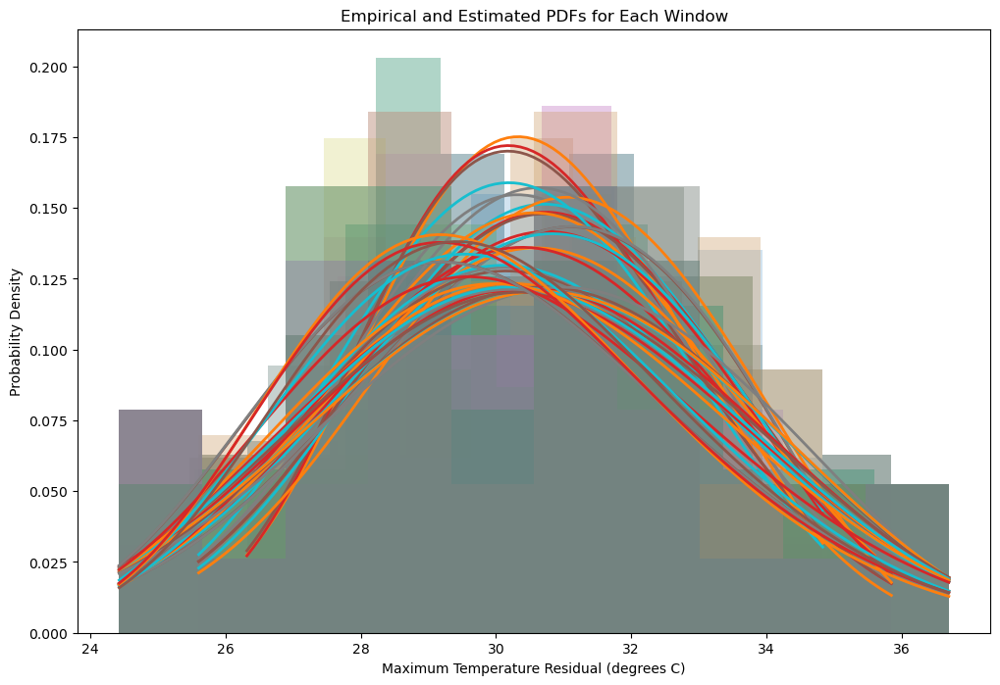

In [20]:
# In[23]:


import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import genextreme as gev
from scipy.stats import kstest
from scipy.signal import detrend

# Assuming 'temperature_residual' is your original dataset
original_signal = np.array(selected_month_max_temp['Max_Temperature'])[indices_4]

# Define the window size and initialize the array to store GEV parameters
gev_parameters_array = []

# Set up the figure
plt.figure(figsize=(12, 8))

# Counter for passing windows
pass_count = 0

# Iterate through moving time windows
for i in range(len(original_signal) - window_size):
    # Extract a window of the original signal
    window_data = original_signal[i : i + window_size]

    # Detrend the windowed signal
    detrended_signal = np.array(window_data)

    # Fit a GEV distribution to the detrended windowed signal
    loc1, scale1, c1 = fit_gev(detrended_signal)
    gev_parameters_array.append((loc1, scale1, c1))

    # Fit GEV distribution to the detrended windowed signal
    gev_dist = gev(c1, loc=loc1, scale=scale1)

    # Perform KS test
    ks_statistic, ks_pvalue = kstest(detrended_signal, gev_dist.cdf)

    # Plot empirical PDF for each window
    plt.hist(detrended_signal, density=True, histtype='stepfilled',
             alpha=0.2)

    # Plot estimated PDF based on the method of L-moments
    bins = np.linspace(detrended_signal.min(), detrended_signal.max(), 100)
    plt.plot(bins, gev_dist.pdf(bins), lw=2)

    # Check if the window passes the KS test (you can adjust this threshold)
    if ks_pvalue > p_value_pass:
        pass_count += 1

# Calculate the percentage of passing windows
pass_percentage = (pass_count / (len(original_signal) - window_size)) * 100

# Add labels
plt.xlabel("Maximum Temperature Residual (degrees C)")
plt.ylabel('Probability Density')
plt.title('Empirical and Estimated PDFs for Each Window')

# Print the percentage of passing windows
print(f'Percentage of passing windows for Kolmogorov-Smirnov (KS): {pass_percentage:.2f}% assuming p-value of {p_value_pass}')

plt.show()

Percentage of passing windows for Kolmogorov-Smirnov (KS): 76.32% assuming p-value of 0.7


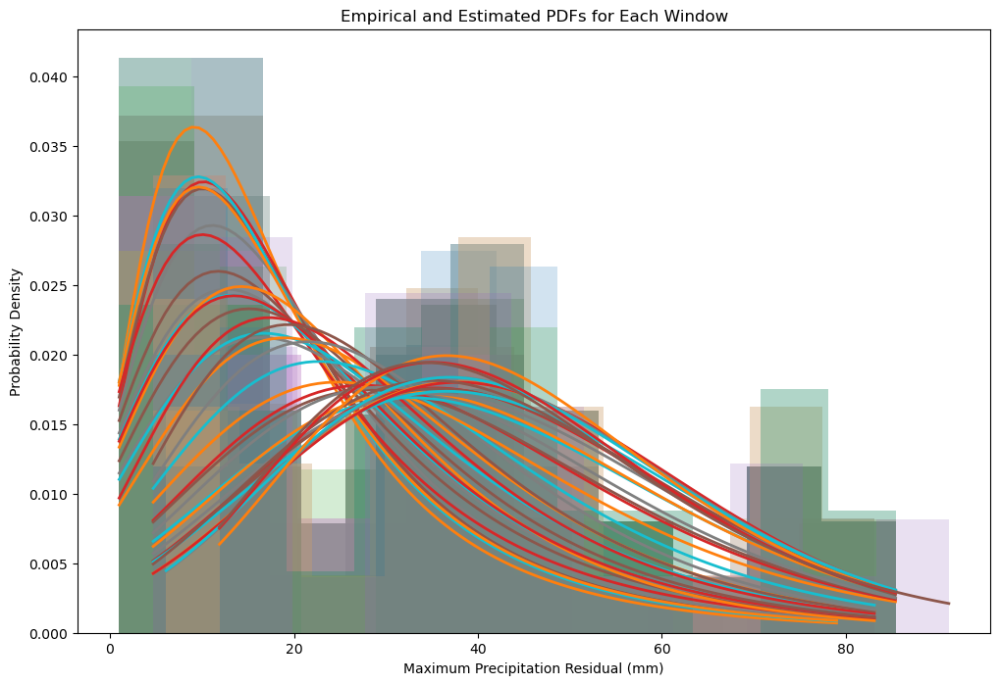

In [21]:
# In[24]:


import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import genextreme as gev
from scipy.stats import kstest
from scipy.signal import detrend

# Assuming 'temperature_residual' is your original dataset
original_signal = np.array(selected_month_total_precip['total_precip'])[indices_2]

# Define the window size and initialize the array to store GEV parameters
gev_parameters_array = []

# Set up the figure
plt.figure(figsize=(12, 8))

# Counter for passing windows
pass_count = 0

# Iterate through moving time windows
for i in range(len(original_signal) - window_size):
    # Extract a window of the original signal
    window_data = original_signal[i : i + window_size]

    # Detrend the windowed signal
    detrended_signal = np.array(window_data)

    # Fit a GEV distribution to the detrended windowed signal
    loc1, scale1, c1 = fit_gev(detrended_signal)
    gev_parameters_array.append((loc1, scale1, c1))

    # Fit GEV distribution to the detrended windowed signal
    gev_dist = gev(c1, loc=loc1, scale=scale1)

    # Perform KS test
    ks_statistic, ks_pvalue = kstest(detrended_signal, gev_dist.cdf)

    # Plot empirical PDF for each window
    plt.hist(detrended_signal, density=True, histtype='stepfilled',
             alpha=0.2)

    # Plot estimated PDF based on the method of L-moments
    bins = np.linspace(detrended_signal.min(), detrended_signal.max(), 100)
    plt.plot(bins, gev_dist.pdf(bins), lw=2)

    # Check if the window passes the KS test (you can adjust this threshold)
    if ks_pvalue > p_value_pass:
        pass_count += 1

# Calculate the percentage of passing windows
pass_percentage = (pass_count / (len(original_signal) - window_size)) * 100

# Add labels
plt.xlabel("Maximum Precipitation Residual (mm)")
plt.ylabel('Probability Density')
plt.title('Empirical and Estimated PDFs for Each Window')

# Print the percentage of passing windows
print(f'Percentage of passing windows for Kolmogorov-Smirnov (KS): {pass_percentage:.2f}% assuming p-value of {p_value_pass}')

plt.show()

In [22]:
# In[25]:


# idea from https://doi.org/10.1038/s41598-019-44603-7

import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import detrend
import pandas as pd



# Define the window size

def calculate_lmom(sample):
    n = len(sample)
    sample = np.sort(sample)[::-1]
    
    b0 = np.mean(sample)
    b1 = np.array([(n - j - 1) * sample[j] / n / (n - 1) for j in range(n)]).sum()
    b2 = np.array([(n - j - 1) * (n - j - 2) * sample[j] / n / (n - 1) / (n - 2) for j in range(n - 1)]).sum()
    b3 = np.array([(n - j - 1) * (n - j - 2) * (n - j - 3) * sample[j] / n / (n - 1) / (n - 2) / (n - 3) for j in range(n - 2)]).sum()
    
    lmom1 = b0
    lmom2 = 2 * b1 - b0
    lmom3 = 6 * (b2 - b1) + b0
    lmom4 = 20*b3 - 30*b2 + 12*b1 - b0
    
    tau2 = lmom2 / lmom1
    tau3 = lmom3 / lmom2
    tau4 = lmom4 / lmom2

    return tau2, tau3, tau4

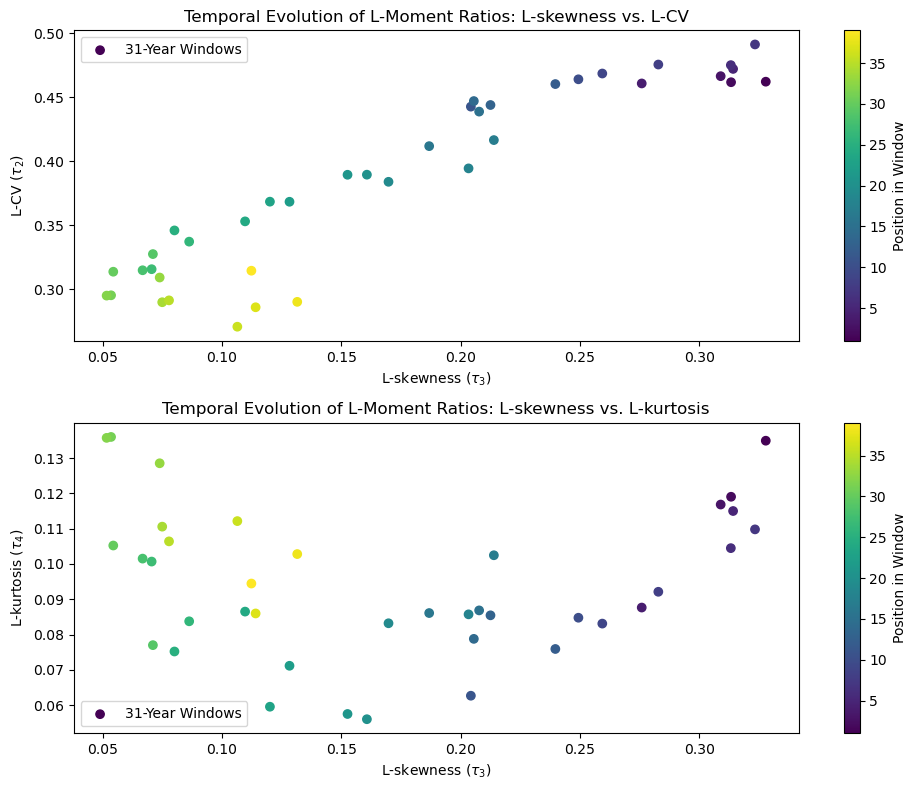

In [23]:
# In[26]:


original_signal = np.array(selected_month_total_precip['total_precip'])[indices_2]

# Lists to store L-moment ratios for each window
lmom_ratios_list = []

# Iterate through moving time windows
for i in range(len(original_signal) - window_size + 1):
    # Extract a window of the original signal
    window_data = original_signal[i : i + window_size]

    # Detrend the windowed signal
    detrended_signal = np.array(window_data)

    # Compute L-moment ratios
    lmom_ratios = calculate_lmom(detrended_signal)
    lmom_ratios_list.append(lmom_ratios)

# Convert the list of L-moment ratios to a DataFrame
lmom_df = pd.DataFrame(lmom_ratios_list, columns=['tau2', 'tau3', 'tau4'])
lmom_df['Position'] = np.arange(1, len(lmom_ratios_list) + 1)

# Plot L-moment ratios with temporal evolution, color-coded by position
plt.figure(figsize=(10, 8))

# Plot L-skewness vs. L-CV
plt.subplot(2, 1, 1)
scatter1 = plt.scatter(lmom_df['tau3'], lmom_df['tau2'], c=lmom_df['Position'], cmap='viridis', label=f'{window_size}-Year Windows')
plt.colorbar(scatter1, label='Position in Window')
plt.xlabel('L-skewness ($\\tau_3$)')
plt.ylabel('L-CV ($\\tau_2$)')
plt.title('Temporal Evolution of L-Moment Ratios: L-skewness vs. L-CV')
plt.legend()

# Plot L-CV vs. L-kurtosis
plt.subplot(2, 1, 2)
scatter2 = plt.scatter(lmom_df['tau3'], lmom_df['tau4'], c=lmom_df['Position'], cmap='viridis', label=f'{window_size}-Year Windows')
plt.colorbar(scatter2, label='Position in Window')
plt.xlabel('L-skewness ($\\tau_3$)')
plt.ylabel('L-kurtosis ($\\tau_4$)')
plt.title('Temporal Evolution of L-Moment Ratios: L-skewness vs. L-kurtosis')
plt.legend()

plt.tight_layout()
plt.show()

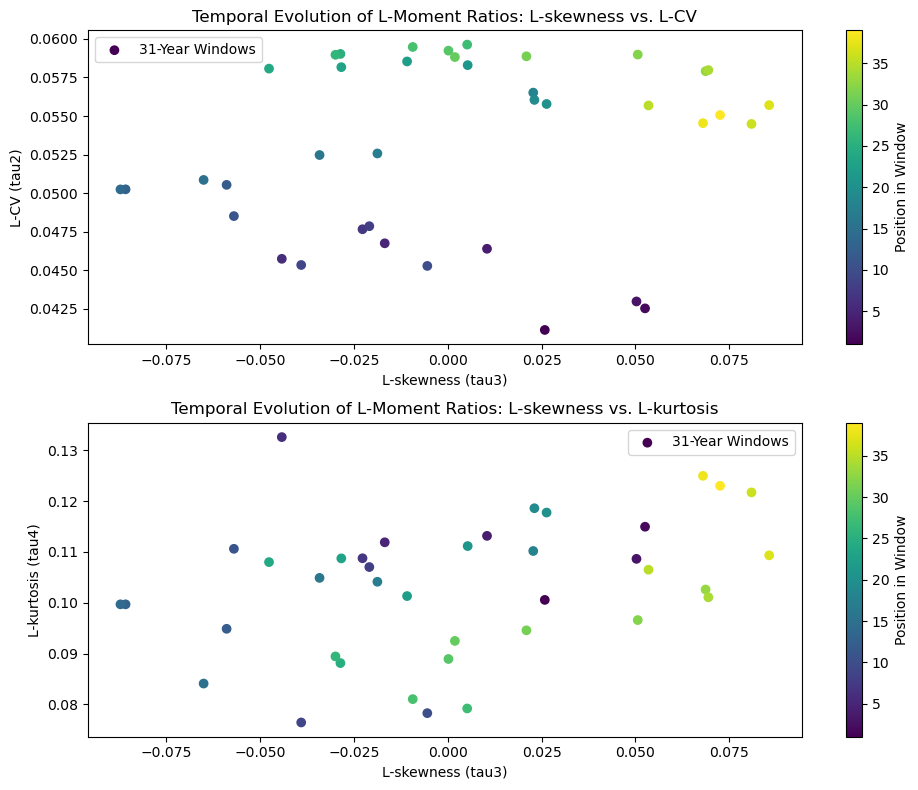

In [24]:
# In[27]:


# idea from https://doi.org/10.1038/s41598-019-44603-7

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Assuming 'temperature_residual' is your original dataset
original_signal = np.array(selected_month_max_temp['Max_Temperature'])[indices_4]

# Lists to store L-moment ratios for each window
lmom_ratios_list = []

# Iterate through moving time windows
for i in range(len(original_signal) - window_size + 1):
    # Extract a window of the original signal
    window_data = original_signal[i : i + window_size]

    # Detrend the windowed signal
    detrended_signal = np.array(window_data)

    # Compute L-moment ratios
    lmom_ratios = calculate_lmom(detrended_signal)
    lmom_ratios_list.append(lmom_ratios)

# Convert the list of L-moment ratios to a DataFrame
lmom_df = pd.DataFrame(lmom_ratios_list, columns=['tau2', 'tau3', 'tau4'])
lmom_df['Position'] = np.arange(1, len(lmom_ratios_list) + 1)

# Remove any rows where L-CV (tau2) is not between 0 and 1
lmom_df = lmom_df[(lmom_df['tau2'] > 0) & (lmom_df['tau2'] < 1)]

# Plotting L-moment ratios with temporal evolution, color-coded by position
plt.figure(figsize=(10, 8))

# Plot L-skewness vs. L-CV
plt.subplot(2, 1, 1)
scatter1 = plt.scatter(lmom_df['tau3'], lmom_df['tau2'], c=lmom_df['Position'], cmap='viridis', label=f'{window_size}-Year Windows')
plt.colorbar(scatter1, label='Position in Window')
plt.xlabel('L-skewness (tau3)')
plt.ylabel('L-CV (tau2)')
plt.title('Temporal Evolution of L-Moment Ratios: L-skewness vs. L-CV')
plt.legend()

# Plot L-CV vs. L-kurtosis
plt.subplot(2, 1, 2)
scatter2 = plt.scatter(lmom_df['tau3'], lmom_df['tau4'], c=lmom_df['Position'], cmap='viridis', label=f'{window_size}-Year Windows')
plt.colorbar(scatter2, label='Position in Window')
plt.xlabel('L-skewness (tau3)')
plt.ylabel('L-kurtosis (tau4)')
plt.title('Temporal Evolution of L-Moment Ratios: L-skewness vs. L-kurtosis')
plt.legend()

plt.tight_layout()
plt.show()

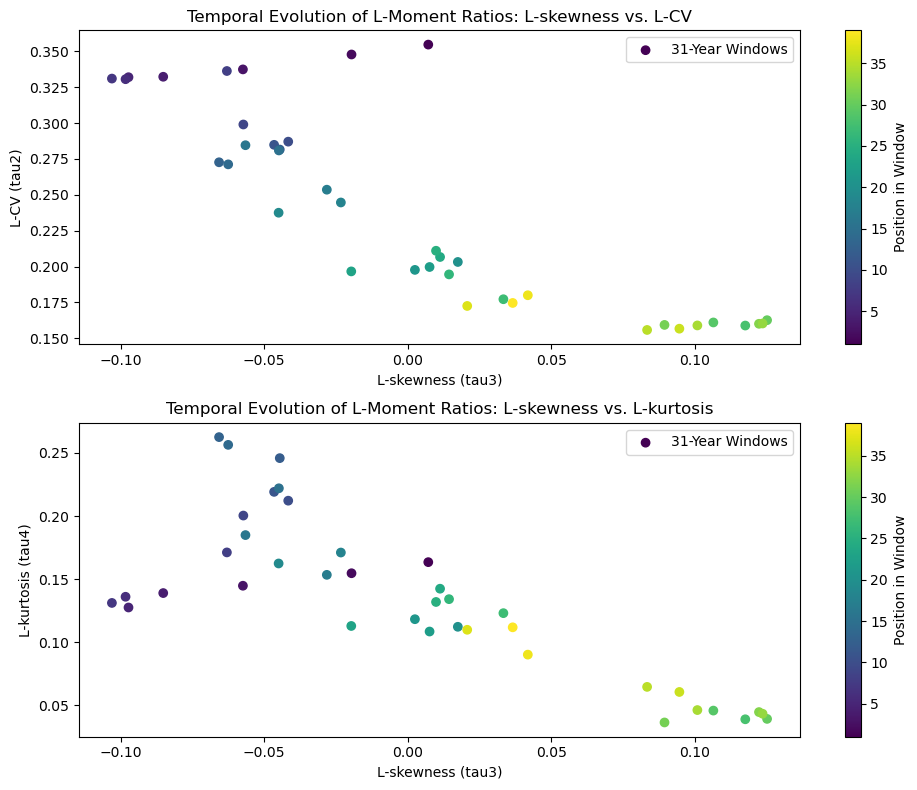

In [25]:
# In[28]:


# idea from https://doi.org/10.1038/s41598-019-44603-7

import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import detrend
import pandas as pd

# Assuming 'temperature_residual' is your original dataset
original_signal = np.array(selected_month_min_temp['Min_Temperature'])[indices_3]

# Lists to store L-moment ratios for each window
lmom_ratios_list = []

# Iterate through moving time windows
for i in range(len(original_signal) - window_size + 1):
    # Extract a window of the original signal
    window_data = original_signal[i : i + window_size]

    # Detrend the windowed signal
    detrended_signal = np.array(window_data)

    # Compute L-moment ratios
    lmom_ratios = calculate_lmom(detrended_signal)
    lmom_ratios_list.append(lmom_ratios)

# Convert the list of L-moment ratios to a DataFrame
lmom_df = pd.DataFrame(lmom_ratios_list, columns=['tau2', 'tau3', 'tau4'])
lmom_df['Position'] = np.arange(1, len(lmom_ratios_list) + 1)

# Plot L-moment ratios with temporal evolution, color-coded by position
plt.figure(figsize=(10, 8))

# Plot L-skewness vs. L-CV
plt.subplot(2, 1, 1)
scatter1 = plt.scatter(lmom_df['tau3'], lmom_df['tau2'], c=lmom_df['Position'], cmap='viridis', label=f'{window_size}-Year Windows')
plt.colorbar(scatter1, label='Position in Window')
plt.xlabel('L-skewness (tau3)')
plt.ylabel('L-CV (tau2)')
plt.title('Temporal Evolution of L-Moment Ratios: L-skewness vs. L-CV')
plt.legend()

# Plot L-CV vs. L-kurtosis
plt.subplot(2, 1, 2)
scatter2 = plt.scatter(lmom_df['tau3'], lmom_df['tau4'], c=lmom_df['Position'], cmap='viridis', label=f'{window_size}-Year Windows')
plt.colorbar(scatter2, label='Position in Window')
plt.xlabel('L-skewness (tau3)')
plt.ylabel('L-kurtosis (tau4)')
plt.title('Temporal Evolution of L-Moment Ratios: L-skewness vs. L-kurtosis')
plt.legend()



plt.tight_layout()
plt.show()

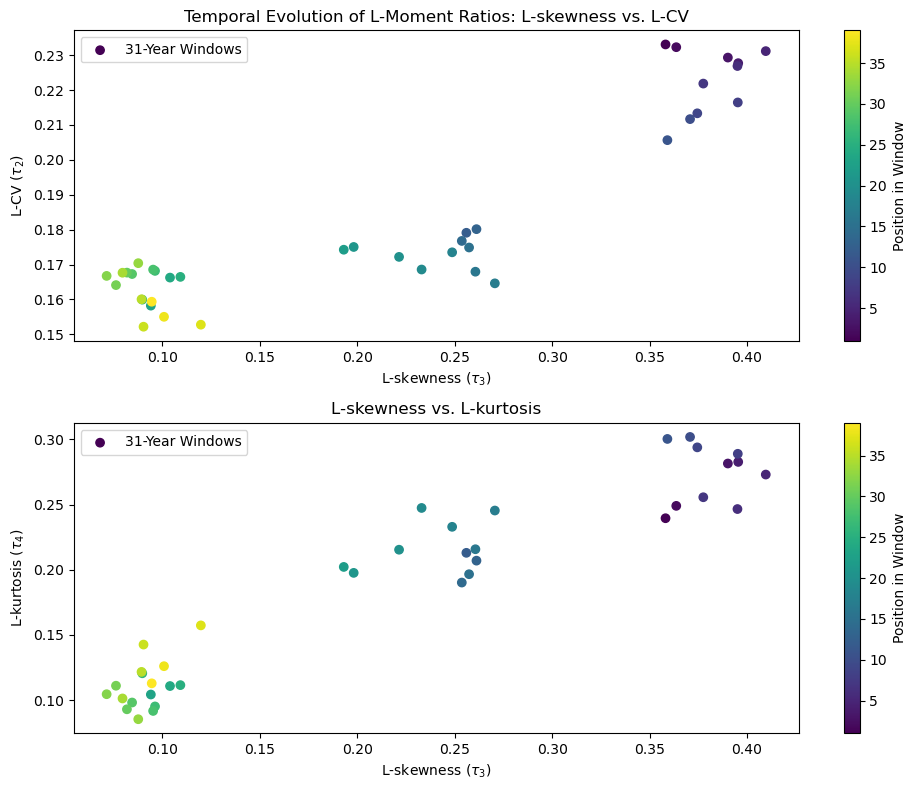

In [26]:
# In[29]:
# for theortical distributions https://www-jstor-org.ezproxy.library.uvic.ca/stable/pdf/2345653
# Additional Source https://stats.stackexchange.com/questions/285262/constructing-an-l-moment-ratio-diagram

# idea from https://doi.org/10.1038/s41598-019-44603-7
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import genextreme

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import genextreme

# Define a range of k values for theoretical GEV
k_values = np.linspace(-0.5, 0.5, 400)
tau_3 = 2 * (1 - 3**(-k_values)) / (1 - 2**(-k_values)) - 3
tau_4 = (1 - 6 * (2**(-k_values)) + 10 * (3**(-k_values)) - 5 * (4**(-k_values))) / (1 - 2**(-k_values))

# Load your empirical data
original_signal = np.array(selected_month_time_series['Discharge'])[indices_1]
lmom_ratios_list = []

for i in range(len(original_signal) - window_size + 1):
    window_data = original_signal[i: i + window_size]
    lmom_ratios = calculate_lmom(window_data)
    lmom_ratios_list.append(lmom_ratios)

lmom_df = pd.DataFrame(lmom_ratios_list, columns=['tau2', 'tau3', 'tau4'])
lmom_df['Position'] = np.arange(1, len(lmom_ratios_list) + 1)

# Plotting both empirical and theoretical data
plt.figure(figsize=(10, 8))

# Plot only empirical data for L-skewness vs. L-CV (tau2 vs tau3)
plt.subplot(2, 1, 1)
scatter1 = plt.scatter(lmom_df['tau3'], lmom_df['tau2'], c=lmom_df['Position'], cmap='viridis',  label=f'{window_size}-Year Windows')
plt.colorbar(scatter1, label='Position in Window')
plt.xlabel('L-skewness ($\\tau_3$)')
plt.ylabel('L-CV ($\\tau_2$)')
plt.title('Temporal Evolution of L-Moment Ratios: L-skewness vs. L-CV')
plt.legend()

# Plot both empirical and theoretical data for L-skewness vs. L-kurtosis
plt.subplot(2, 1, 2)
scatter2 = plt.scatter(lmom_df['tau3'], lmom_df['tau4'], c=lmom_df['Position'], cmap='viridis',  label=f'{window_size}-Year Windows')
#plt.plot(tau_3, tau_4, 'r-', label='Theoretical GEV L-moments')
plt.colorbar(scatter2, label='Position in Window')
plt.xlabel('L-skewness ($\\tau_3$)')
plt.ylabel('L-kurtosis ($\\tau_4$)')
plt.title('L-skewness vs. L-kurtosis')
plt.legend()

plt.tight_layout()
plt.show()



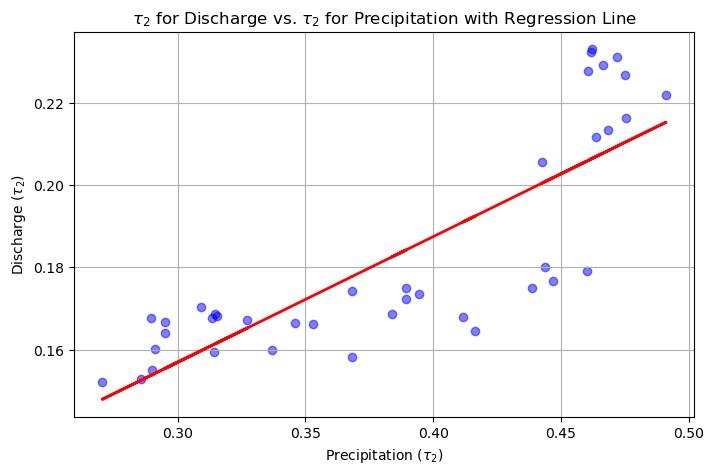

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.675
Model:                            OLS   Adj. R-squared:                  0.666
Method:                 Least Squares   F-statistic:                     76.94
Date:                Mon, 09 Sep 2024   Prob (F-statistic):           1.44e-10
Time:                        15:37:56   Log-Likelihood:                 108.60
No. Observations:                  39   AIC:                            -213.2
Df Residuals:                      37   BIC:                            -209.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0652      0.014      4.783      0.0

In [27]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import statsmodels.api as sm

# Function to calculate L-moment ratios
def calculate_lmom(sample):
    n = len(sample)
    sample = np.sort(sample)[::-1]
    
    b0 = np.mean(sample)
    b1 = np.array([(n - j - 1) * sample[j] / n / (n - 1) for j in range(n)]).sum()
    
    lmom1 = b0
    lmom2 = 2 * b1 - b0
    
    tau2 = lmom2 / lmom1 if lmom1 != 0 else 0

    return tau2

# Function to compute tau2 for all windows in a signal
def get_tau2_ratios(signal, window_size):
    tau2_list = []
    for i in range(len(signal) - window_size + 1):
        window_data = signal[i:i + window_size]
        tau2 = calculate_lmom(window_data)
        tau2_list.append(tau2)
    return tau2_list

# Simulate data for precipitation and discharge
precip_signal = np.array(selected_month_total_precip['total_precip'])[indices_2]
discharge_signal = np.array(selected_month_time_series['Discharge'])[indices_1] 

# Calculate tau2 for precipitation and discharge
precip_tau2 = get_tau2_ratios(precip_signal, window_size)
discharge_tau2 = get_tau2_ratios(discharge_signal, window_size)

# Plot tau2 for discharge against tau2 for precipitation
plt.figure(figsize=(8, 5))
plt.scatter(precip_tau2, discharge_tau2, color='blue', alpha=0.5)

# Fit a linear regression line
X = sm.add_constant(precip_tau2)  # Add constant for intercept
model = sm.OLS(discharge_tau2, X).fit()
fit_line = model.predict(X)

# Plot the regression line
plt.plot(precip_tau2, fit_line, color='red', linewidth=2)

plt.title('$\\tau_2$ for Discharge vs. $\\tau_2$ for Precipitation with Regression Line')
plt.xlabel('Precipitation ($\\tau_2$)')
plt.ylabel('Discharge ($\\tau_2$)')
plt.grid(True)
plt.show()

# Print model summary
print(model.summary())

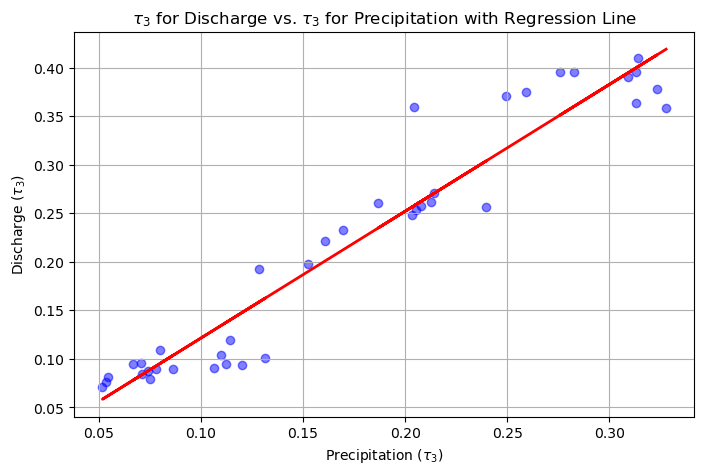

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.925
Model:                            OLS   Adj. R-squared:                  0.923
Method:                 Least Squares   F-statistic:                     458.7
Date:                Mon, 09 Sep 2024   Prob (F-statistic):           1.91e-22
Time:                        15:37:57   Log-Likelihood:                 77.337
No. Observations:                  39   AIC:                            -150.7
Df Residuals:                      37   BIC:                            -147.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0090      0.012     -0.762      0.4

In [28]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import statsmodels.api as sm

# Function to calculate L-moment ratios
def calculate_lmom(sample):
    n = len(sample)
    sample = np.sort(sample)[::-1]
    
    b0 = np.mean(sample)
    b1 = np.array([(n - j - 1) * sample[j] / n / (n - 1) for j in range(n)]).sum()
    b2 = np.array([(n - j - 1) * (n - j - 2) * sample[j] / n / (n - 1) / (n - 2) for j in range(n - 1)]).sum()
    b3 = np.array([(n - j - 1) * (n - j - 2) * (n - j - 3) * sample[j] / n / (n - 1) / (n - 2) / (n - 3) for j in range(n - 2)]).sum()
    
    lmom1 = b0
    lmom2 = 2 * b1 - b0
    lmom3 = 6 * (b2 - b1) + b0
    lmom4 = 20 * b3 - 30 * b2 + 12 * b1 - b0
    
    tau2 = lmom2 / lmom1
    tau3 = lmom3 / lmom2

    return tau2, tau3

# Function to compute tau3 for all windows in a signal
def get_tau3_ratios(signal, window_size):
    tau3_list = []
    for i in range(len(signal) - window_size + 1):
        window_data = signal[i:i + window_size]
        _, tau3 = calculate_lmom(window_data)
        tau3_list.append(tau3)
    return tau3_list

# Simulate data for precipitation and discharge
precip_signal = np.array(selected_month_total_precip['total_precip'])[indices_2]
discharge_signal = np.array(selected_month_time_series['Discharge'])[indices_1]

# Calculate tau3 for precipitation and discharge
precip_tau3 = get_tau3_ratios(precip_signal, window_size)
discharge_tau3 = get_tau3_ratios(discharge_signal, window_size)

# Plot tau3 for discharge against tau3 for precipitation
plt.figure(figsize=(8, 5))
plt.scatter(precip_tau3, discharge_tau3, color='blue', alpha=0.5)

# Fit a linear regression line
X = sm.add_constant(precip_tau3)  # Add constant for intercept
model = sm.OLS(discharge_tau3, X).fit()
fit_line = model.predict(X)

# Plot the regression line
plt.plot(precip_tau3, fit_line, color='red', linewidth=2)

plt.title('$\\tau_3$ for Discharge vs. $\\tau_3$ for Precipitation with Regression Line')
plt.xlabel('Precipitation ($\\tau_3$)')
plt.ylabel('Discharge ($\\tau_3$)')
plt.grid(True)
plt.show()

# Print model summary
print(model.summary())

In [29]:
# In[30]:

# Calculate samples L-moments
# Code from https://xiaoganghe.github.io/python-climate-visuals/chapters/data-analytics/scipy-basic.html

def fit_gev(l_moments):
    loc1, scale1, c1 = pargev(l_moments)
    return loc1, scale1, c1

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from itertools import combinations

def calculate_lmom(sample):
    n = len(sample)
    sample = np.sort(sample.reshape(n))[::-1]
    
    b0 = np.mean(sample)
    b1 = np.array([(n - j - 1) * sample[j] / n / (n - 1) for j in range(n)]).sum()
    b2 = np.array([(n - j - 1) * (n - j - 2) * sample[j] / n / (n - 1) / (n - 2) for j in range(n - 1)]).sum()
    b3 = np.array([(n - j - 1) * (n - j - 2) * (n - j - 3) * sample[j] / n / (n - 1) / (n - 2) / (n - 3) for j in range(n - 2)]).sum()
    
    lmom1 = b0
    lmom2 = 2 * b1 - b0
    lmom3 = 6 * (b2 - b1) + b0
    lmom4 = 20 * b3 - 30 * b2 + 12 * b1 - b0

    return lmom1, lmom2, lmom3, lmom4


In [30]:
# In[31]:


import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import detrend
import pandas as pd
from sklearn.linear_model import LinearRegression

if precip_only == "On":
    signals = [
        #Replace with your actual data and indices
        np.array(selected_month_time_series['Discharge'])[indices_1],
        np.array(selected_month_total_precip['total_precip'])[indices_2]
    ]
elif precip_and_min == "On":
    signals = [
        # Replace with your actual data and indices
        np.array(selected_month_time_series['Discharge'])[indices_1],
        np.array(selected_month_total_precip['total_precip'])[indices_2],
        np.array(selected_month_min_temp['Min_Temperature'])[indices_3]
    ]
else:
    signals = [
        # Replace with your actual data and indices
        np.array(selected_month_time_series['Discharge'])[indices_1],
        np.array(selected_month_total_precip['total_precip'])[indices_2],
        np.array(selected_month_min_temp['Min_Temperature'])[indices_3],
        np.array(selected_month_max_temp['Max_Temperature'])[indices_4]
    ]

In [31]:
# In[32]:

signal_names = ['Discharge', 'Total Precip', 'Min Temperature', 'Max Temperature']
l_moment_names = ['L-moment 1', 'L-moment 2', 'L-moment 3', 'L-moment 4']

def calculate_lmom_df(signal, window_size, l_moment_names):
    lmom_data = []
    for i in range(len(signal) - window_size + 1):
        window = signal[i:i + window_size]
        lmom_data.append(calculate_lmom(window))
    lmom_df = pd.DataFrame(lmom_data, columns=l_moment_names)
    return lmom_df

In [32]:
# In[33]:
# See https://doi.org/10.1080/03610919608813340

def pargev(lmom):
    SMALL = 1e-5
    eps = 1e-6
    maxit = 20

    # EU IS EULER'S CONSTANT
    EU = 0.57721566
    DL2 = math.log(2)
    DL3 = math.log(3)

    # COEFFICIENTS OF RATIONAL-FUNCTION APPROXIMATIONS FOR XI
    A0 = 0.28377530
    A1 = -1.21096399
    A2 = -2.50728214
    A3 = -1.13455566
    A4 = -0.07138022
    B1 = 2.06189696
    B2 = 1.31912239
    B3 = 0.25077104
    C1 = 1.59921491
    C2 = -0.48832213
    C3 = 0.01573152
    D1 = -0.64363929
    D2 = 0.08985247

    # Initialize arrays to store parameter estimates
    loc = np.empty(lmom.shape[1])
    scale = np.empty(lmom.shape[1])
    c = np.empty(lmom.shape[1])

    for i in range(lmom.shape[1]):
        lmom_ratios = [lmom[0, i], lmom[1, i], lmom[2, i] / lmom[1, i]]

        T3 = lmom_ratios[2]
        if lmom_ratios[1] <= 0 or abs(T3) >= 1:
            raise ValueError("Invalid L-Moments")

        if T3 <= 0:
            G = (A0 + T3 * (A1 + T3 * (A2 + T3 * (A3 + T3 * A4)))) / (1 + T3 * (B1 + T3 * (B2 + T3 * B3)))

            if T3 >= -0.8:
                para3 = G
                GAM = math.exp(special.gammaln(1 + G))
                para2 = lmom_ratios[1] * G / (GAM * (1 - 2**-G))
                para1 = lmom_ratios[0] - para2 * (1 - GAM) / G
            elif T3 <= -0.97:
                G = 1 - math.log(1 + T3) / DL2

            T0 = (T3 + 3) * 0.5
            for IT in range(1, maxit):
                X2 = 2 ** -G
                X3 = 3 ** -G
                XX2 = 1 - X2
                XX3 = 1 - X3
                T = XX3 / XX2
                DERIV = (XX2 * X3 * DL3 - XX3 * X2 * DL2) / (XX2**2)
                GOLD = G
                G -= (T - T0) / DERIV

                if abs(G - GOLD) <= eps * G:
                    para3 = G
                    GAM = math.exp(special.gammaln(1 + G))
                    para2 = lmom_ratios[1] * G / (GAM * (1 - 2**-G))
                    para1 = lmom_ratios[0] - para2 * (1 - GAM) / G
                    break
            else:
                raise Exception("Iteration has not converged")
        else:
            Z = 1 - T3
            G = (-1 + Z * (C1 + Z * (C2 + Z * C3))) / (1 + Z * (D1 + Z * D2))
            if abs(G) < SMALL:
                para2 = lmom_ratios[1] / DL2
                para1 = lmom_ratios[0] - EU * para2
                para3 = 0
            else:
                para3 = G
                GAM = math.exp(special.gammaln(1 + G))
                para2 = lmom_ratios[1] * G / (GAM * (1 - 2**-G))
                para1 = lmom_ratios[0] - para2 * (1 - GAM) / G

        loc[i] = para1
        scale[i] = para2
        c[i] = para3

    return loc, scale, c

# Multiple Linear Regression Machine Learning Algorithm

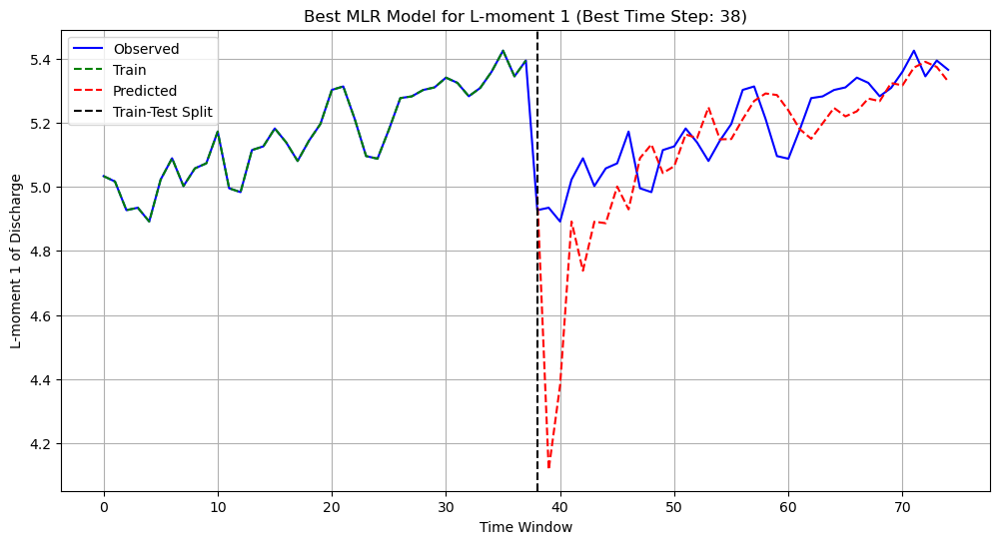

Model summary for L-moment 1:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.805
Model:                            OLS   Adj. R-squared:                  0.782
Method:                 Least Squares   F-statistic:                     34.14
Date:                Mon, 09 Sep 2024   Prob (F-statistic):           2.67e-11
Time:                        15:37:57   Log-Likelihood:                 51.205
No. Observations:                  38   AIC:                            -92.41
Df Residuals:                      33   BIC:                            -84.22
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.6166 

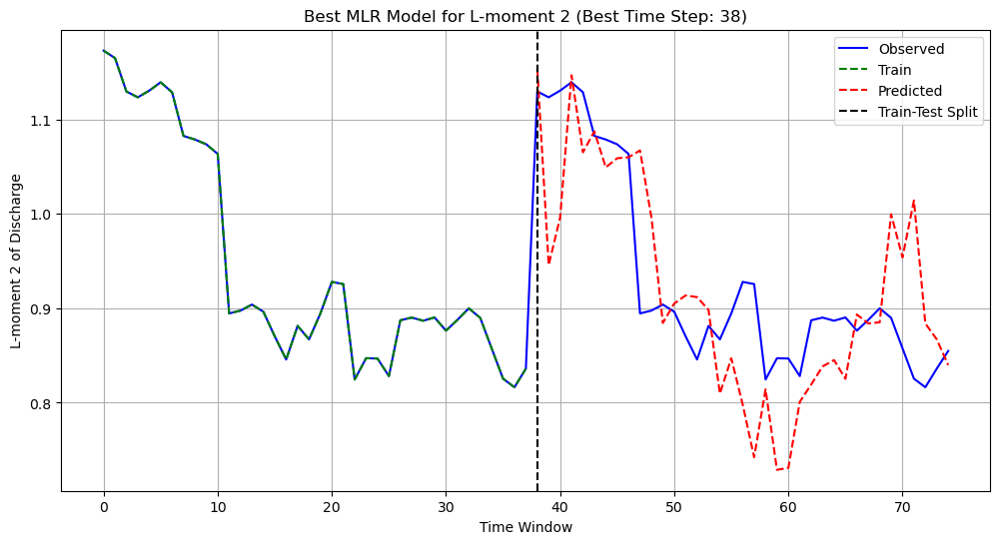

Model summary for L-moment 2:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.750
Model:                            OLS   Adj. R-squared:                  0.719
Method:                 Least Squares   F-statistic:                     24.72
Date:                Mon, 09 Sep 2024   Prob (F-statistic):           1.58e-09
Time:                        15:37:57   Log-Likelihood:                 54.643
No. Observations:                  38   AIC:                            -99.29
Df Residuals:                      33   BIC:                            -91.10
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.5197 

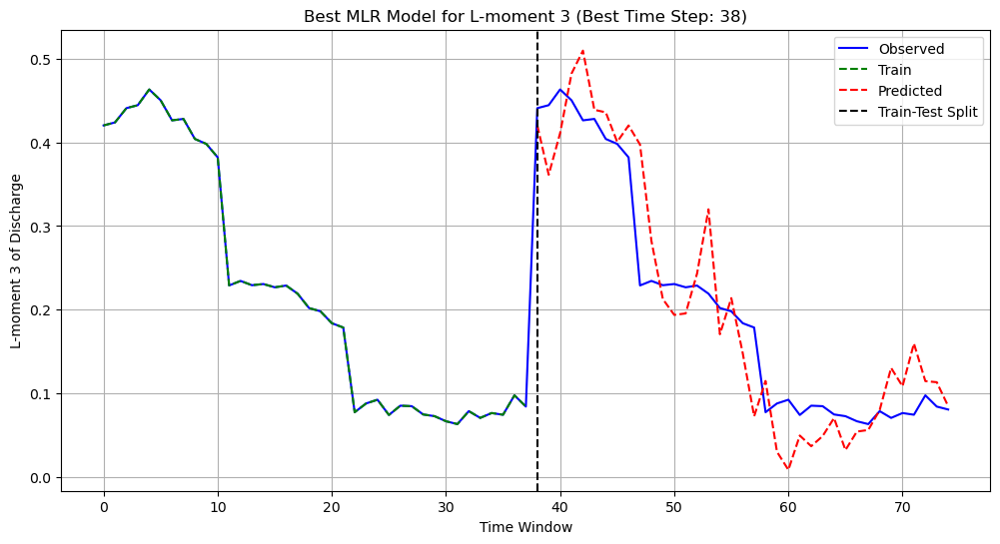

Model summary for L-moment 3:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.932
Model:                            OLS   Adj. R-squared:                  0.923
Method:                 Least Squares   F-statistic:                     112.5
Date:                Mon, 09 Sep 2024   Prob (F-statistic):           9.66e-19
Time:                        15:37:57   Log-Likelihood:                 70.554
No. Observations:                  38   AIC:                            -131.1
Df Residuals:                      33   BIC:                            -122.9
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.7270 

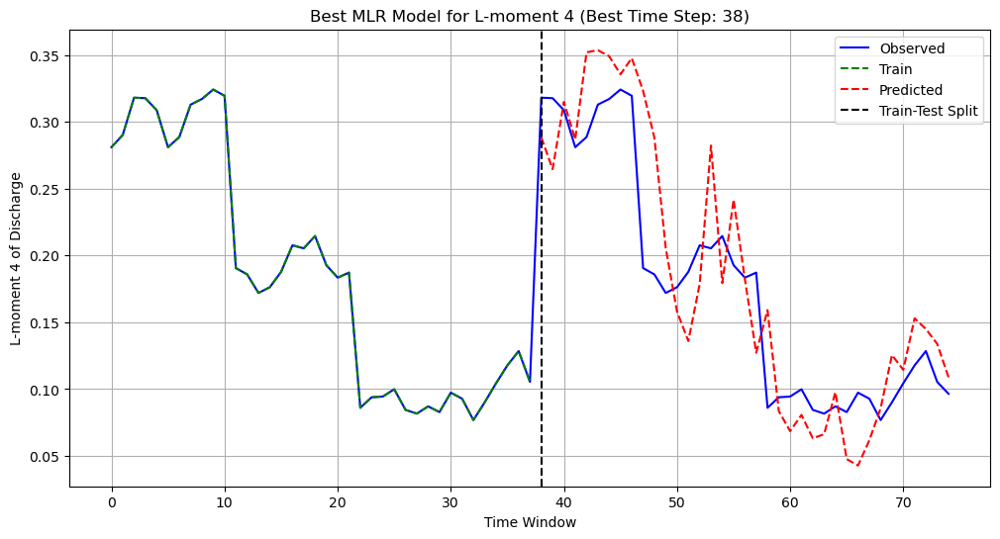

Model summary for L-moment 4:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.879
Model:                            OLS   Adj. R-squared:                  0.864
Method:                 Least Squares   F-statistic:                     59.84
Date:                Mon, 09 Sep 2024   Prob (F-statistic):           1.16e-14
Time:                        15:37:57   Log-Likelihood:                 78.423
No. Observations:                  38   AIC:                            -146.8
Df Residuals:                      33   BIC:                            -138.7
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4962 

In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
import numpy as np
from itertools import combinations

# Assuming the 'calculate_lmom_df' function and variables are already defined

# Define signal and L-moment names based on the user settings
if precip_only == "On":
    signal_names = ['Discharge', 'Total Precip']
elif precip_and_min == "On":
    signal_names = ['Discharge', 'Total Precip', 'Min Temperature']
else:
    signal_names = ['Discharge', 'Total Precip', 'Min Temperature', 'Max Temperature']

l_moment_names = ['L-moment 1', 'L-moment 2', 'L-moment 3', 'L-moment 4']

# Calculate L-moments for all signals and store them in DataFrames
lmom_dfs = [calculate_lmom_df(signal, window_size, l_moment_names) for signal in signals]

# Target signal is the first in the list, typically 'Discharge'
target_signal_index = 0

# Generate all possible combinations of predictor variables
all_predictors = [(idx, l_moment) for idx in range(len(signal_names)) if idx != target_signal_index for l_moment in l_moment_names]
all_combinations = sum([list(combinations(all_predictors, i)) for i in range(1, len(all_predictors) + 1)], [])

# Store the best models for each L-moment of the target signal
best_models = {}
best_model_equations = {}  # Dictionary to store the best-fit model equations
best_time_steps = {}  # Dictionary to store the best time step for each L-moment

# Use forward chaining for training and evaluation
all_future_predictions = []
all_future_actuals = []

for l_moment in l_moment_names:
    lowest_mse = np.inf
    best_model_info = None
    best_time_step = None  # Initialize the best time step

    all_predictions = []
    all_actuals = []

    for i in range(1, len(lmom_dfs[target_signal_index])):
        train_data = lmom_dfs[target_signal_index].iloc[:i]
        test_data = lmom_dfs[target_signal_index].iloc[i:i+1]

        y_train = train_data[l_moment].values
        predictors = []  # Initialize the predictors list inside the loop
        predictors_used = []  # Initialize predictors_used inside the loop
        for combination in all_combinations:
            current_predictors = []
            for (idx, l_moment_pred) in combination:
                if idx == target_signal_index:
                    # Use data up to the current point in the forward walk
                    predictor_data = train_data[l_moment_pred]
                else:
                    # Use data up to the current point for other signals as well
                    predictor_data = lmom_dfs[idx][l_moment_pred].iloc[:len(train_data)]
                current_predictors.append(predictor_data.values.reshape(-1, 1))
                predictors_used.append((idx, l_moment_pred))

            if current_predictors:
                predictors.append(np.hstack(current_predictors))

        if predictors:
            X_train = np.hstack(predictors)
            valid_indices = ~np.isnan(X_train).any(axis=1)
            X_train, y_train = X_train[valid_indices], y_train[valid_indices]

            # Fit the model using statsmodels
            X_train_sm = sm.add_constant(X_train)
            model = sm.OLS(y_train, X_train_sm).fit()

            # Evaluate model on the current test point
            test_predictors = []
            for combination in all_combinations:
                current_test_predictors = []
                for (idx, l_moment_pred) in combination:
                    if idx == target_signal_index:
                        test_data_point = test_data[l_moment_pred]
                    else:
                        test_data_point = lmom_dfs[idx][l_moment_pred].iloc[len(train_data):len(train_data) + 1]
                    current_test_predictors.append(test_data_point.values.reshape(-1, 1))
                if current_test_predictors:
                    test_predictors.append(np.hstack(current_test_predictors))

            if test_predictors:
                X_test = np.hstack(test_predictors)
                X_test_sm = sm.add_constant(X_test, has_constant='add')
                try:
                    y_pred_test = model.predict(X_test_sm)
                except ValueError:
                    # Handle the case where the number of predictors does not match
                    continue

                # Store the prediction and actual value
                all_predictions.append(y_pred_test[0])
                all_actuals.append(test_data[l_moment].values[0])

        # Add the test point to the training set for the next iteration
        train_data = pd.concat([train_data, test_data])

    # Calculate MSE for this fold
    mse = np.mean((np.array(all_actuals) - np.array(all_predictions)) ** 2)
    if mse < lowest_mse:
        lowest_mse = mse
        best_model_info = (model, X_train_sm, y_train, X_test_sm, np.array(all_actuals), np.array(all_predictions), predictors_used)
        best_time_step = i  # Store the best time step

    best_models[l_moment] = best_model_info
    best_time_steps[l_moment] = best_time_step  # Store the best time step

    # Extract and store the best-fit model equation
    if best_model_info:
        model, _, _, _, _, _, predictors_used = best_model_info
        intercept = model.params[0]
        coefficients = model.params[1:]
        equation_parts = [f"{coeff:.3f}*({signal_names[idx]} {l_m})" for coeff, (idx, l_m) in zip(coefficients, predictors_used)]
        equation = " + ".join(equation_parts)
        full_equation = f"{l_moment} = {intercept:.3f} + {equation}"
        best_model_equations[l_moment] = full_equation

# Plotting and model summary
for l_moment, model_info in best_models.items():
    if model_info:
        model, X_train, y_train, X_test, y_test, y_pred_test, predictors_used = model_info
        plt.figure(figsize=(12, 6))
        plt.plot(np.arange(len(y_train) + len(y_test)), np.concatenate((y_train, y_test)), label='Observed', color='blue')
        plt.plot(np.arange(len(y_train)), y_train, label='Train', linestyle='--', color='green')
        plt.plot(np.arange(len(y_train), len(y_train) + len(y_test)), y_pred_test, label='Predicted', linestyle='--', color='red')
        plt.title(f'Best MLR Model for {l_moment} (Best Time Step: {best_time_steps[l_moment]})')
        plt.xlabel('Time Window')
        plt.ylabel(f'{l_moment} of Discharge')
        plt.axvline(x=len(y_train), color='black', linestyle='--', label='Train-Test Split')
        plt.legend()
        plt.grid(True)
        plt.show()

        print(f"Model summary for {l_moment}:")
        print(model.summary())

# Print the best fit equations and best time steps
for l_moment, equation in best_model_equations.items():
    print(f"Best-fit Model Equation for {l_moment}:")
    print(equation)
    print(f"Best Time Step for {l_moment}: {best_time_steps[l_moment]}")


Best-fit Model Equation for L-moment 1: L-moment 1 = 4.617 + 0.003*(Total Precip L-moment 1) + -0.003*(Total Precip L-moment 2) + 0.006*(Total Precip L-moment 3) + -0.006*(Total Precip L-moment 4) + 0.003*(Total Precip L-moment 1) + -0.003*(Total Precip L-moment 2) + 0.003*(Total Precip L-moment 1) + 0.006*(Total Precip L-moment 3) + 0.003*(Total Precip L-moment 1) + -0.006*(Total Precip L-moment 4) + -0.003*(Total Precip L-moment 2) + 0.006*(Total Precip L-moment 3) + -0.003*(Total Precip L-moment 2) + -0.006*(Total Precip L-moment 4) + 0.006*(Total Precip L-moment 3) + -0.006*(Total Precip L-moment 4) + 0.003*(Total Precip L-moment 1) + -0.003*(Total Precip L-moment 2) + 0.006*(Total Precip L-moment 3) + 0.003*(Total Precip L-moment 1) + -0.003*(Total Precip L-moment 2) + -0.006*(Total Precip L-moment 4) + 0.003*(Total Precip L-moment 1) + 0.006*(Total Precip L-moment 3) + -0.006*(Total Precip L-moment 4) + -0.003*(Total Precip L-moment 2) + 0.006*(Total Precip L-moment 3) + -0.006*(

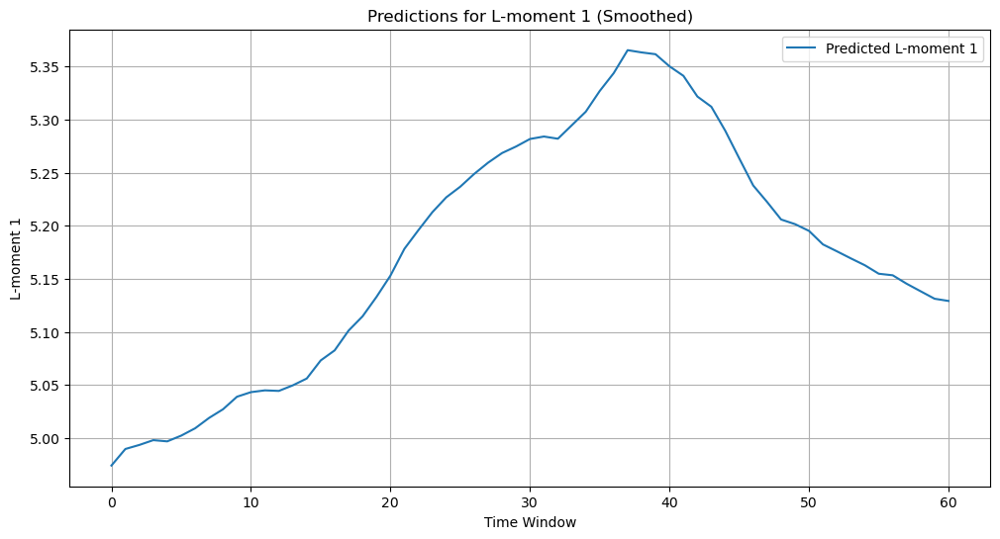

Best-fit Model Equation for L-moment 2: L-moment 2 = 1.520 + -0.001*(Total Precip L-moment 1) + -0.004*(Total Precip L-moment 2) + 0.001*(Total Precip L-moment 3) + 0.009*(Total Precip L-moment 4) + -0.001*(Total Precip L-moment 1) + -0.004*(Total Precip L-moment 2) + -0.001*(Total Precip L-moment 1) + 0.001*(Total Precip L-moment 3) + -0.001*(Total Precip L-moment 1) + 0.009*(Total Precip L-moment 4) + -0.004*(Total Precip L-moment 2) + 0.001*(Total Precip L-moment 3) + -0.004*(Total Precip L-moment 2) + 0.009*(Total Precip L-moment 4) + 0.001*(Total Precip L-moment 3) + 0.009*(Total Precip L-moment 4) + -0.001*(Total Precip L-moment 1) + -0.004*(Total Precip L-moment 2) + 0.001*(Total Precip L-moment 3) + -0.001*(Total Precip L-moment 1) + -0.004*(Total Precip L-moment 2) + 0.009*(Total Precip L-moment 4) + -0.001*(Total Precip L-moment 1) + 0.001*(Total Precip L-moment 3) + 0.009*(Total Precip L-moment 4) + -0.004*(Total Precip L-moment 2) + 0.001*(Total Precip L-moment 3) + 0.009*(

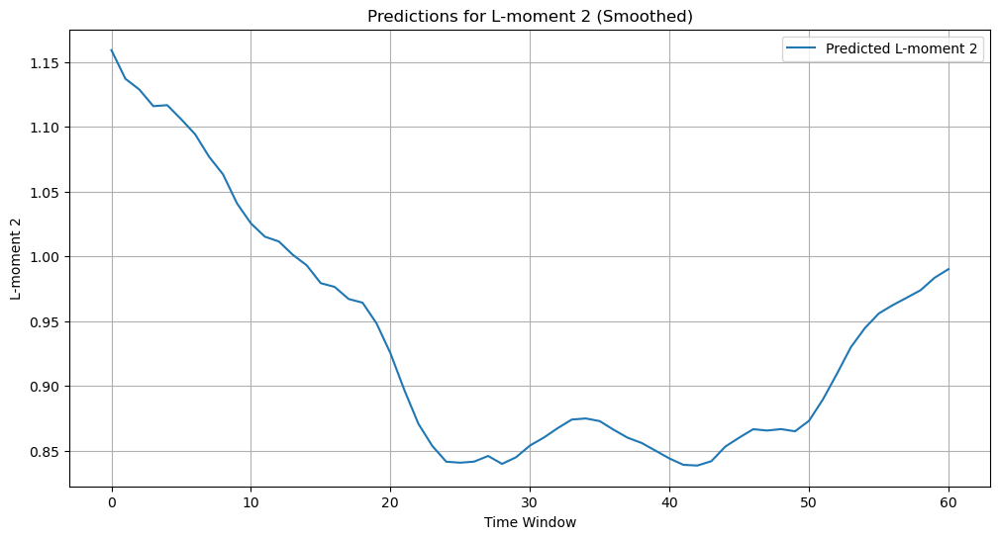

Best-fit Model Equation for L-moment 3: L-moment 3 = 0.727 + -0.001*(Total Precip L-moment 1) + -0.004*(Total Precip L-moment 2) + 0.007*(Total Precip L-moment 3) + -0.000*(Total Precip L-moment 4) + -0.001*(Total Precip L-moment 1) + -0.004*(Total Precip L-moment 2) + -0.001*(Total Precip L-moment 1) + 0.007*(Total Precip L-moment 3) + -0.001*(Total Precip L-moment 1) + -0.000*(Total Precip L-moment 4) + -0.004*(Total Precip L-moment 2) + 0.007*(Total Precip L-moment 3) + -0.004*(Total Precip L-moment 2) + -0.000*(Total Precip L-moment 4) + 0.007*(Total Precip L-moment 3) + -0.000*(Total Precip L-moment 4) + -0.001*(Total Precip L-moment 1) + -0.004*(Total Precip L-moment 2) + 0.007*(Total Precip L-moment 3) + -0.001*(Total Precip L-moment 1) + -0.004*(Total Precip L-moment 2) + -0.000*(Total Precip L-moment 4) + -0.001*(Total Precip L-moment 1) + 0.007*(Total Precip L-moment 3) + -0.000*(Total Precip L-moment 4) + -0.004*(Total Precip L-moment 2) + 0.007*(Total Precip L-moment 3) + -

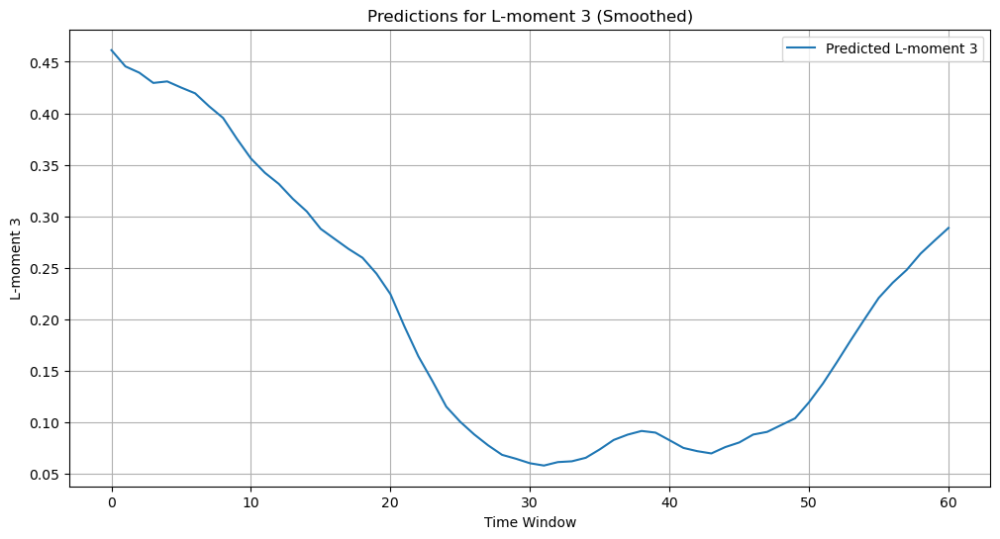

Best-fit Model Equation for L-moment 4: L-moment 4 = 0.496 + -0.000*(Total Precip L-moment 1) + -0.003*(Total Precip L-moment 2) + 0.005*(Total Precip L-moment 3) + -0.005*(Total Precip L-moment 4) + -0.000*(Total Precip L-moment 1) + -0.003*(Total Precip L-moment 2) + -0.000*(Total Precip L-moment 1) + 0.005*(Total Precip L-moment 3) + -0.000*(Total Precip L-moment 1) + -0.005*(Total Precip L-moment 4) + -0.003*(Total Precip L-moment 2) + 0.005*(Total Precip L-moment 3) + -0.003*(Total Precip L-moment 2) + -0.005*(Total Precip L-moment 4) + 0.005*(Total Precip L-moment 3) + -0.005*(Total Precip L-moment 4) + -0.000*(Total Precip L-moment 1) + -0.003*(Total Precip L-moment 2) + 0.005*(Total Precip L-moment 3) + -0.000*(Total Precip L-moment 1) + -0.003*(Total Precip L-moment 2) + -0.005*(Total Precip L-moment 4) + -0.000*(Total Precip L-moment 1) + 0.005*(Total Precip L-moment 3) + -0.005*(Total Precip L-moment 4) + -0.003*(Total Precip L-moment 2) + 0.005*(Total Precip L-moment 3) + -

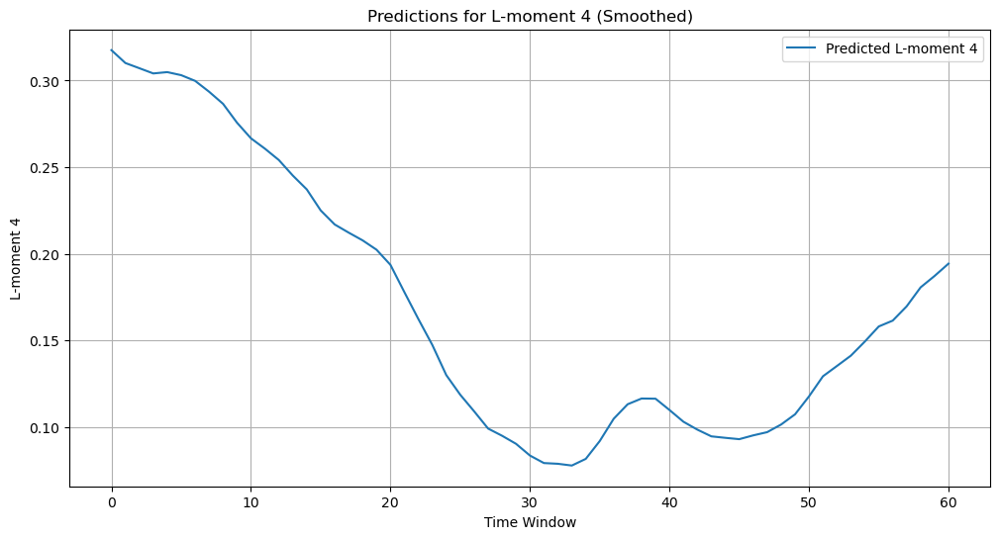

In [34]:
# In[35]:


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm


# Prepare your new data as a dictionary
new_signal_data = {
    'Total Precip': np.array(selected_month_total_precip['total_precip'])[total_precip_indices],
    'Min Temperature': np.array(selected_month_min_temp['Min_Temperature'])[total_min_temp_indices],
    'Max Temperature': np.array(selected_month_max_temp['Max_Temperature'])[total_max_temp_indices]
}

new_lmom_dfs = {signal: calculate_lmom_df(data, window_size, l_moment_names) for signal, data in new_signal_data.items()}

# Apply rolling mean to the new L-moment DataFrames
new_lmom_dfs_smoothed = {signal: df.rolling(window=window_mean, min_periods=1).mean().dropna() for signal, df in new_lmom_dfs.items()}

# Function to predict using the model coefficients and intercept
def predict_with_model(intercept, coefficients, predictors):
    X_with_intercept = sm.add_constant(predictors, has_constant='add')
    prediction = np.dot(X_with_intercept, np.insert(coefficients, 0, intercept))
    return prediction

# Iterate over each L-moment to make predictions and plot
for l_moment in l_moment_names:
    model_info = best_models[l_moment]
    if model_info:
        model, _, _, _, _, _, predictors_used = model_info

        # Extract the model coefficients and intercept
        coefficients = model.params[1:]
        intercept = model.params[0]

        # Prepare the new smoothed data for prediction
        new_predictors = [new_lmom_dfs_smoothed[signal_names[idx]][l_m].values.reshape(-1, 1) for idx, l_m in predictors_used]
        new_X_combined = np.hstack(new_predictors) if new_predictors else np.empty((len(new_lmom_dfs_smoothed[signal_names[0]]), 0))

        # Make predictions using the new smoothed data
        new_predictions = predict_with_model(intercept, coefficients, new_X_combined)
        
        # Construct and print the equation
        equation_parts = [f"{coeff:.3f}*({signal_names[idx]} {l_m})" for coeff, (idx, l_m) in zip(coefficients, predictors_used)]
        equation = " + ".join(equation_parts)
        full_equation = f"{l_moment} = {intercept:.3f} + {equation}"
        print(f"Best-fit Model Equation for {l_moment}: {full_equation}")

        # Print the predictors used
        predictor_names = [f"{signal_names[idx]} {l_m}" for idx, l_m in predictors_used]
        print(f"Predictors used for {l_moment}: {predictor_names}")


        # Plotting
        plt.figure(figsize=(12, 6))
        plt.plot(new_predictions, label='Predicted ' + l_moment)
        plt.title(f'Predictions for {l_moment} (Smoothed)')
        plt.xlabel('Time Window')
        plt.ylabel(l_moment)
        plt.legend()
        plt.grid(True)
        plt.show()

In [35]:
# In[36]:


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm

# Assuming all required data and functions are defined (selected_month_total_precip, selected_month_min_temp, selected_month_max_temp, indices arrays, calculate_lmom_df, etc.)

# Prepare your new data as a dictionary
new_signal_data = {
    'Total Precip': np.array(selected_month_total_precip['total_precip'])[total_precip_indices],
    'Min Temperature': np.array(selected_month_min_temp['Min_Temperature'])[total_min_temp_indices],
    'Max Temperature': np.array(selected_month_max_temp['Max_Temperature'])[total_max_temp_indices]
}


    
# Calculate L-moments for the new data
new_lmom_dfs = {signal: calculate_lmom_df(data, window_size, l_moment_names) for signal, data in new_signal_data.items()}

# Apply rolling mean to the new L-moment DataFrames
new_lmom_dfs_smoothed = {signal: df.rolling(window=rolling_window_size, min_periods=1).mean().dropna() for signal, df in new_lmom_dfs.items()}

# Extract and predict the first three L-moments
predicted_l_moments = {}
for l_moment in ['L-moment 1', 'L-moment 2', 'L-moment 3', 'L-moment 4']:
    model_info = best_models.get(l_moment)
    if model_info:
        model, _, _, _, _, _, predictors_used = model_info
        coefficients = model.params[1:]
        intercept = model.params[0]
        new_predictors = np.hstack([new_lmom_dfs_smoothed[signal_names[idx]][l_m].values.reshape(-1, 1) for idx, l_m in predictors_used])
        new_predictions = predict_with_model(intercept, coefficients, new_predictors)
        predicted_l_moments[l_moment] = new_predictions

# Now `predicted_l_moments` contains the predictions for the first three L-moments
l_moment1_array = np.array(predicted_l_moments['L-moment 1'])
l_moment2_array = np.array(predicted_l_moments['L-moment 2'])
l_moment3_array = np.array(predicted_l_moments['L-moment 3'])
l_moment4_array = np.array(predicted_l_moments['L-moment 4'])

Goat_l_moments = np.vstack([l_moment1_array, l_moment2_array, l_moment3_array])

In [36]:
import matplotlib.pyplot as plt
import numpy as np

# Calculating L-moment ratios for predicted data
tau2_pred = l_moment2_array / l_moment1_array
tau3_pred = l_moment3_array / l_moment2_array
tau4_pred = l_moment4_array / l_moment2_array

window_positions_pred = np.arange(1, len(tau2_pred) + 1)

# Normalize window positions for color coding
norm = plt.Normalize(window_positions_pred.min(), window_positions_pred.max())
cmap = plt.cm.viridis  # Choose a colormap that fits your preference



import matplotlib.pyplot as plt
import pandas as pd
import numpy as np


window_positions_obs = lmom_df['Position'].values
norm = plt.Normalize(window_positions_obs.min(), window_positions_obs.max())
cmap = plt.cm.viridis  # Ensure consistent colormap usage



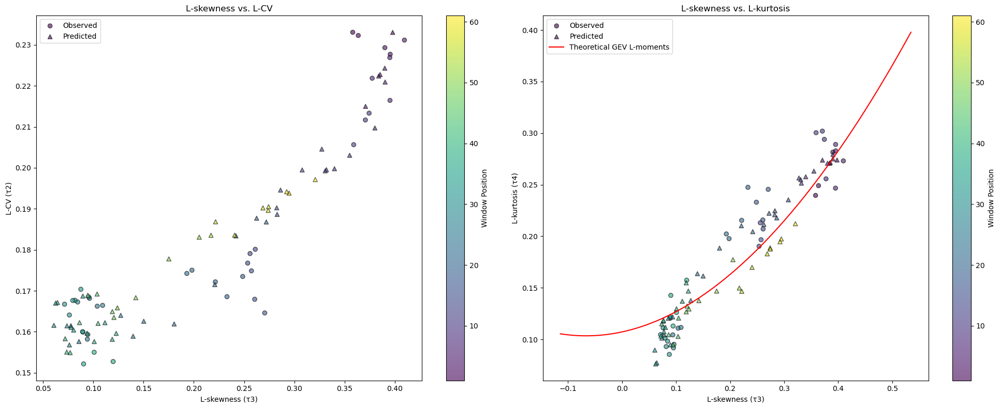

In [37]:
import numpy as np
import matplotlib.pyplot as plt

# Define a range of k values for GEV distribution
k_values = np.linspace(-0.5, 0.5, 400)
tau_3_gev = 2 * (1 - 3**(-k_values)) / (1 - 2**(-k_values)) - 3
tau_4_gev = (1 - 6 * (2**(-k_values)) + 10 * (3**(-k_values)) - 5 * (4**(-k_values))) / (1 - 2**(-k_values))

# Assuming 'lmom_df' and 'tau3_pred', 'tau4_pred' are calculated and 'window_positions_pred', 'window_positions_obs' are defined
all_window_positions = np.concatenate([window_positions_pred, window_positions_obs])
norm = plt.Normalize(all_window_positions.min(), all_window_positions.max())
cmap = plt.cm.viridis

# Plotting Combined L-Moment Ratio Diagrams
fig, axs = plt.subplots(1, 2, figsize=(20, 8))

# L-skewness vs. L-CV
scatter_obs_1 = axs[0].scatter(lmom_df['tau3'], lmom_df['tau2'], c=window_positions_obs, cmap=cmap, norm=norm, alpha=0.6, edgecolor='k', label='Observed', marker='o')
scatter_pred_1 = axs[0].scatter(tau3_pred, tau2_pred, c=window_positions_pred, cmap=cmap, norm=norm, alpha=0.6, edgecolor='k', label='Predicted', marker='^')
axs[0].set_xlabel('L-skewness (\u03C43)')
axs[0].set_ylabel('L-CV (\u03C42)')
axs[0].set_title('L-skewness vs. L-CV')
axs[0].legend()
cb1 = fig.colorbar(scatter_pred_1, ax=axs[0], label='Window Position')

# L-skewness vs. L-kurtosis with theoretical GEV
scatter_obs_2 = axs[1].scatter(lmom_df['tau3'], lmom_df['tau4'], c=window_positions_obs, cmap=cmap, norm=norm, alpha=0.6, edgecolor='k', label='Observed', marker='o')
scatter_pred_2 = axs[1].scatter(tau3_pred, tau4_pred, c=window_positions_pred, cmap=cmap, norm=norm, alpha=0.6, edgecolor='k', label='Predicted', marker='^')
axs[1].plot(tau_3_gev, tau_4_gev, 'r-', label='Theoretical GEV L-moments')
axs[1].set_xlabel('L-skewness (\u03C43)')
axs[1].set_ylabel('L-kurtosis (\u03C44)')
axs[1].set_title('L-skewness vs. L-kurtosis')
axs[1].legend()
cb2 = fig.colorbar(scatter_pred_2, ax=axs[1], label='Window Position')

plt.tight_layout()
plt.show()


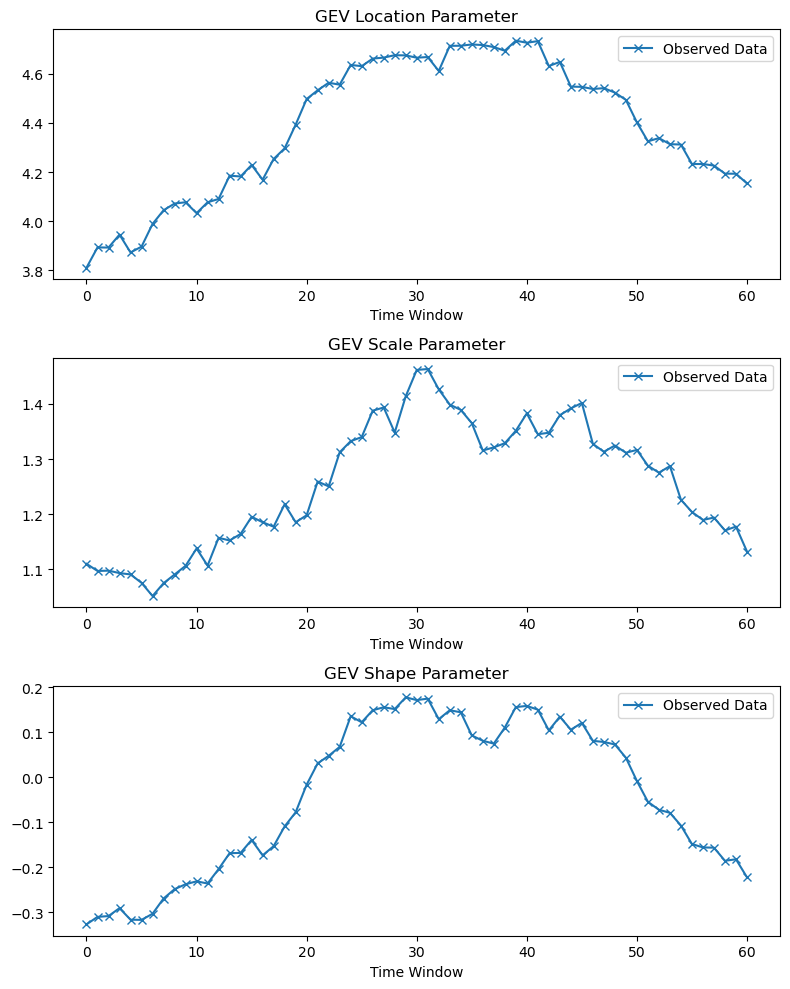

In [38]:
# In[37]:


import numpy as np
import math
from scipy import special

# Assuming you have l_moment_1_pred, l_moment_2_pred, l_moment_3_pred,
# l_moment_1_obs, l_moment_2_obs, and l_moment_3_obs from predicted and observed data

# Fit GEV to observed l-moments
params_Goat = fit_gev(Goat_l_moments)

# The params_pred and params_obs variables now contain the fitted parameters (loc, scale, c)
# for the GEV distribution using all three l-moments at once.

import matplotlib.pyplot as plt

# Assuming you have already computed params_pred and params_obs as described earlier

# Extract the parameters for plotting
Goat_loc_obs, Goat_scale_obs, Goat_shape_obs = params_Goat

# Create subplots for each parameter
fig, axs = plt.subplots(3, 1, figsize=(8, 10))

# Plot location parameters
axs[0].plot(Goat_loc_obs, label='Observed Data', marker='x')
axs[0].set_title('GEV Location Parameter')
axs[0].legend()

# Plot scale parameters
axs[1].plot(Goat_scale_obs, label='Observed Data', marker='x')
axs[1].set_title('GEV Scale Parameter')
axs[1].legend()

# Plot shape parameters
axs[2].plot(Goat_shape_obs, label='Observed Data', marker='x')
axs[2].set_title('GEV Shape Parameter')
axs[2].legend()

# Set common x-axis label
for ax in axs:
    ax.set_xlabel('Time Window')

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

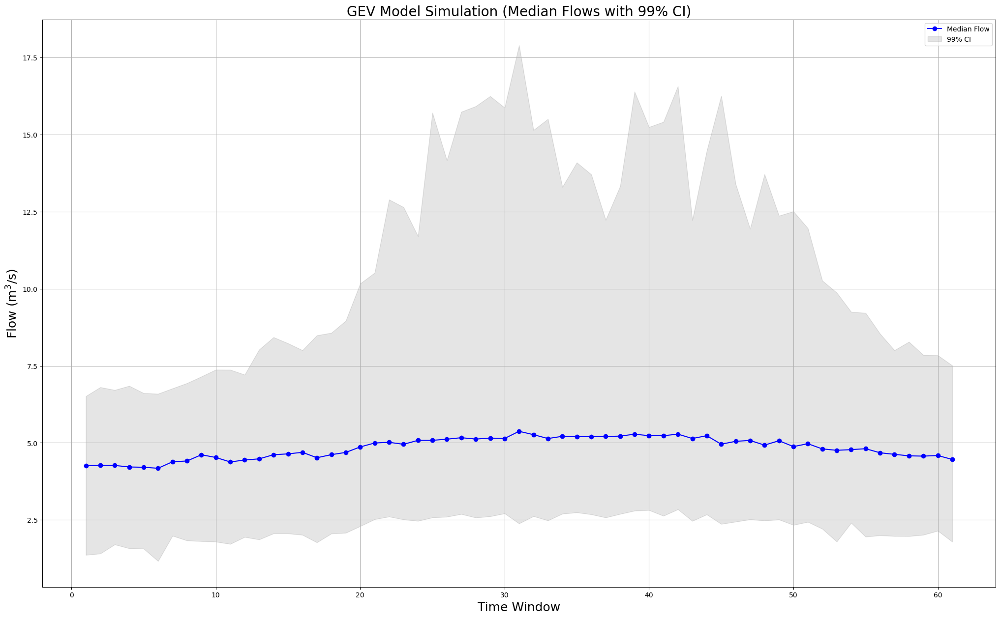

In [39]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import genextreme as gev

def generate_and_plot_gev_time_series(loc_array, scale_array, shape_array, num_simulations, title):
    # Determine the number of windows
    num_windows = len(loc_array)

    # Prepare a matrix to store data for each simulation in each window
    simulation_data = np.zeros((num_windows, num_simulations))

    # Run simulations and collect data
    for i in range(num_simulations):
        for j in range(num_windows):
            # Generate random data using the GEV distribution with the given parameters
            random_data = gev.rvs(c=-shape_array[j], loc=loc_array[j], scale=scale_array[j], size=1)[0]
            # Ensure generated value is >= 0
            while random_data < 0:
                random_data = gev.rvs(c=-shape_array[j], loc=loc_array[j], scale=scale_array[j], size=1)[0]
            simulation_data[j, i] = random_data

    # Calculate the median and 99% CI for each window across all simulations
    median_flows = np.median(simulation_data, axis=1)
    confidence_interval = np.percentile(simulation_data, [0.5, 99.5], axis=1)

    # Plotting the time series of median flows with 99% CI shading
    plt.figure(figsize=(25, 15))
    plt.plot(range(1, num_windows + 1), median_flows, marker='o', linestyle='-', color='b', label='Median Flow')
    plt.fill_between(range(1, num_windows + 1), confidence_interval[0], confidence_interval[1], color='black', alpha=0.1, label='99% CI')
    plt.title(f"{title} (Median Flows with 99% CI)", fontsize=20)
    plt.xlabel('Time Window', fontsize=18)
    plt.ylabel('Flow (m$^3$/s)', fontsize=18)
    plt.legend()
    plt.grid(True)
    
    # Save the plot as an image
    plt.savefig("flow.png", bbox_inches='tight')
    plt.show()

# Assuming Goat_loc_obs, Goat_scale_obs, Goat_shape_obs are defined elsewhere
num_simulations = 1000  # Number of simulations to run

# Generate and plot GEV time series data
generate_and_plot_gev_time_series(Goat_loc_obs, Goat_scale_obs, Goat_shape_obs, num_simulations, "GEV Model Simulation")


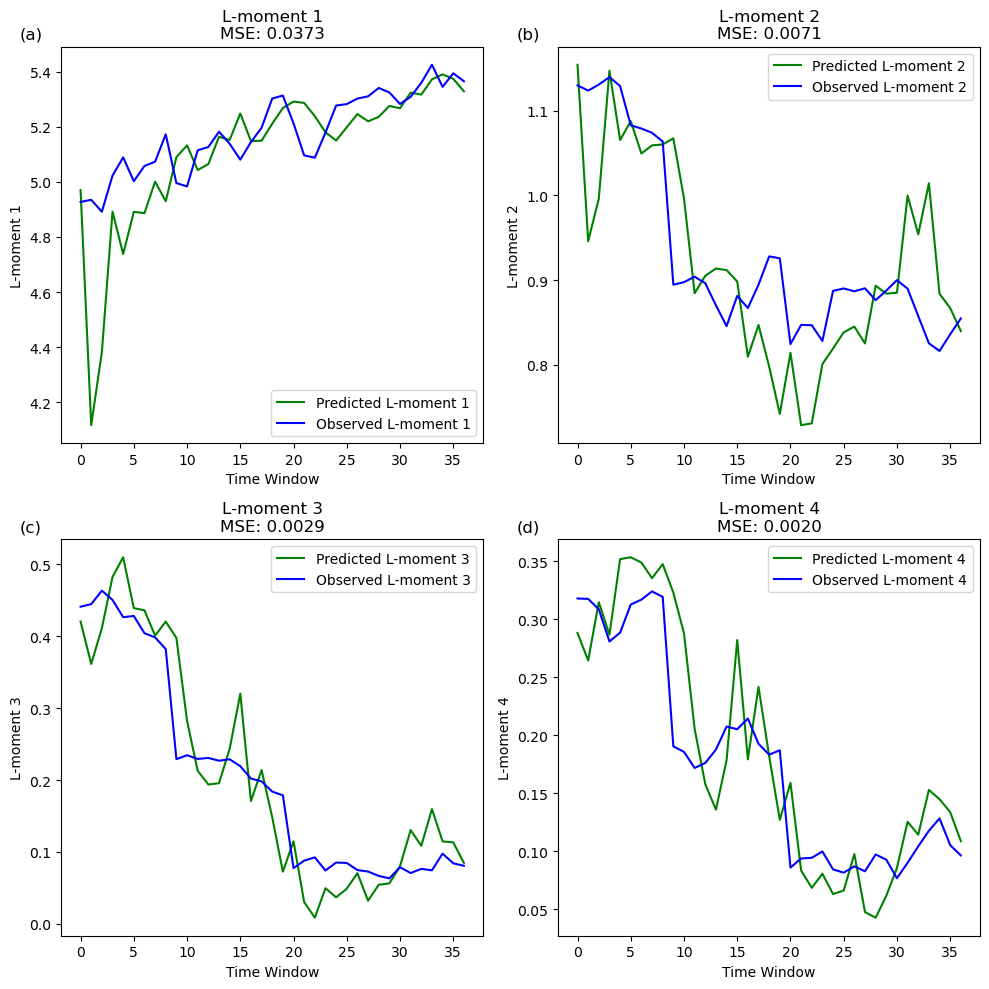

In [46]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error

predicted_tests = []
observed_tests = []
predicted_train = []
observed_train = []

# Iterate over each L-moment to store values
for l_moment, model_info in best_models.items():
    if model_info:
        # Unpack model_info
        model, X_train, y_train_smoothed, X_test, y_test_smoothed, y_pred_test_smoothed, predictors_used = model_info
        # Predictions on train and test sets
        X_train_sm = sm.add_constant(X_train)
        X_test_sm = sm.add_constant(X_test)
        y_pred_train = model.predict(X_train_sm)
        y_pred_test = model.predict(X_test_sm)

        predicted_train.append(y_train_smoothed)
        observed_train.append(X_train)
        predicted_tests.append(y_pred_test_smoothed)
        observed_tests.append(y_test_smoothed)

# Ensure the lengths of predictions and observations match
min_length = min(len(predicted_tests[0]), len(predicted_tests[1]), len(predicted_tests[2]), len(predicted_tests[3]),
                 len(observed_tests[0]), len(observed_tests[1]), len(observed_tests[2]), len(observed_tests[3]))

predicted_tests = [pred[:min_length] for pred in predicted_tests]
observed_tests = [obs[:min_length] for obs in observed_tests]

# Convert to Pandas Series for rolling mean operation
l_moment_1_pred = pd.Series(predicted_tests[0])
l_moment_2_pred = pd.Series(predicted_tests[1])
l_moment_3_pred = pd.Series(predicted_tests[2])
l_moment_4_pred = pd.Series(predicted_tests[3])

l_moment_1_obs = pd.Series(observed_tests[0])
l_moment_2_obs = pd.Series(observed_tests[1])
l_moment_3_obs = pd.Series(observed_tests[2])
l_moment_4_obs = pd.Series(observed_tests[3])

# Define the window size for the rolling mean
window_size_mean = 1  # Example window size, replace with the actual value

# Apply rolling mean and convert back to numpy arrays
l_moment_1_pred_rolled = l_moment_1_pred.rolling(window=window_size_mean, min_periods=1, center=True).mean().to_numpy()
l_moment_2_pred_rolled = l_moment_2_pred.rolling(window=window_size_mean, min_periods=1, center=True).mean().to_numpy()
l_moment_3_pred_rolled = l_moment_3_pred.rolling(window=window_size_mean, min_periods=1, center=True).mean().to_numpy()
l_moment_4_pred_rolled = l_moment_4_pred.rolling(window=window_size_mean, min_periods=1, center=True).mean().to_numpy()

l_moment_1_obs_rolled = l_moment_1_obs.rolling(window=window_size_mean, min_periods=1, center=True).mean().to_numpy()
l_moment_2_obs_rolled = l_moment_2_obs.rolling(window=window_size_mean, min_periods=1, center=True).mean().to_numpy()
l_moment_3_obs_rolled = l_moment_3_obs.rolling(window=window_size_mean, min_periods=1, center=True).mean().to_numpy()
l_moment_4_obs_rolled = l_moment_4_obs.rolling(window=window_size_mean, min_periods=1, center=True).mean().to_numpy()

# Calculate MSE
mse_l_moment_1 = mean_squared_error(l_moment_1_obs_rolled, l_moment_1_pred_rolled)
mse_l_moment_2 = mean_squared_error(l_moment_2_obs_rolled, l_moment_2_pred_rolled)
mse_l_moment_3 = mean_squared_error(l_moment_3_obs_rolled, l_moment_3_pred_rolled)
mse_l_moment_4 = mean_squared_error(l_moment_4_obs_rolled, l_moment_4_pred_rolled)

# Plotting the results in a 2x2 grid layout
plt.figure(figsize=(10, 10))

# L-moment 1
plt.subplot(2, 2, 1)
plt.plot(l_moment_1_pred_rolled, label='Predicted L-moment 1', color='green')
plt.plot(l_moment_1_obs_rolled, label='Observed L-moment 1', color='blue')
plt.title(f'L-moment 1\nMSE: {mse_l_moment_1:.4f}')
plt.xlabel('Time Window')
plt.ylabel('L-moment 1')
plt.legend()
plt.text(-0.1, 1.05, '(a)', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top')

# L-moment 2
plt.subplot(2, 2, 2)
plt.plot(l_moment_2_pred_rolled, label='Predicted L-moment 2', color='green')
plt.plot(l_moment_2_obs_rolled, label='Observed L-moment 2', color='blue')
plt.title(f'L-moment 2\nMSE: {mse_l_moment_2:.4f}')
plt.xlabel('Time Window')
plt.ylabel('L-moment 2')
plt.legend()
plt.text(-0.1, 1.05, '(b)', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top')

# L-moment 3
plt.subplot(2, 2, 3)
plt.plot(l_moment_3_pred_rolled, label='Predicted L-moment 3', color='green')
plt.plot(l_moment_3_obs_rolled, label='Observed L-moment 3', color='blue')
plt.title(f'L-moment 3\nMSE: {mse_l_moment_3:.4f}')
plt.xlabel('Time Window')
plt.ylabel('L-moment 3')
plt.legend()
plt.text(-0.1, 1.05, '(c)', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top')

# L-moment 4
plt.subplot(2, 2, 4)
plt.plot(l_moment_4_pred_rolled, label='Predicted L-moment 4', color='green')
plt.plot(l_moment_4_obs_rolled, label='Observed L-moment 4', color='blue')
plt.title(f'L-moment 4\nMSE: {mse_l_moment_4:.4f}')
plt.xlabel('Time Window')
plt.ylabel('L-moment 4')
plt.legend()
plt.text(-0.1, 1.05, '(d)', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top')

plt.tight_layout()
plt.show()


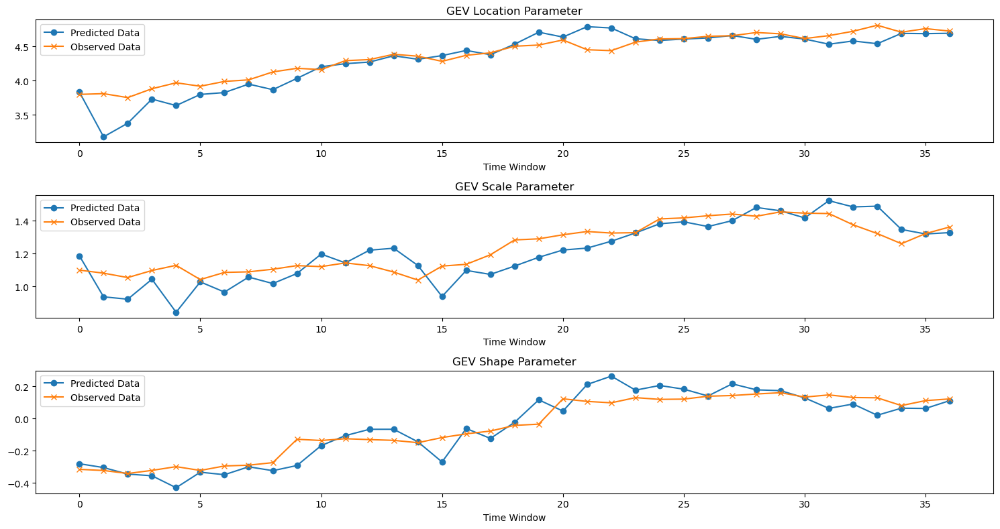

In [41]:
l_moments_pred = np.vstack([l_moment_1_pred, l_moment_2_pred, l_moment_3_pred])
l_moments_obs = np.vstack([l_moment_1_obs, l_moment_2_obs, l_moment_3_obs])


# In[42]:

import numpy as np
import math
from scipy import special

# Assuming you have l_moment_1_pred, l_moment_2_pred, l_moment_3_pred,
# l_moment_1_obs, l_moment_2_obs, and l_moment_3_obs from predicted and observed data


# Fit GEV to predicted l-moments
params_pred = fit_gev(l_moments_pred)

# Fit GEV to observed l-moments
params_obs = fit_gev(l_moments_obs)

# The params_pred and params_obs variables now contain the fitted parameters (loc, scale, c)
# for the GEV distribution using all three l-moments at once.

import matplotlib.pyplot as plt

# Assuming you have already computed params_pred and params_obs as described earlier

# Extract the parameters for plotting
loc_pred, scale_pred, shape_pred = params_pred
loc_obs, scale_obs, shape_obs = params_obs

# Create subplots for each parameter
fig, axs = plt.subplots(3, 1, figsize=(15, 8))

# Plot location parameters
axs[0].plot(loc_pred, label='Predicted Data', marker='o')
axs[0].plot(loc_obs, label='Observed Data', marker='x')
axs[0].set_title('GEV Location Parameter')
axs[0].legend()

# Plot scale parameters
axs[1].plot(scale_pred, label='Predicted Data', marker='o')
axs[1].plot(scale_obs, label='Observed Data', marker='x')
axs[1].set_title('GEV Scale Parameter')
axs[1].legend()

# Plot shape parameters
axs[2].plot(shape_pred, label='Predicted Data', marker='o')
axs[2].plot(shape_obs, label='Observed Data', marker='x')
axs[2].set_title('GEV Shape Parameter')
axs[2].legend()

# Set common x-axis label
for ax in axs:
    ax.set_xlabel('Time Window')

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

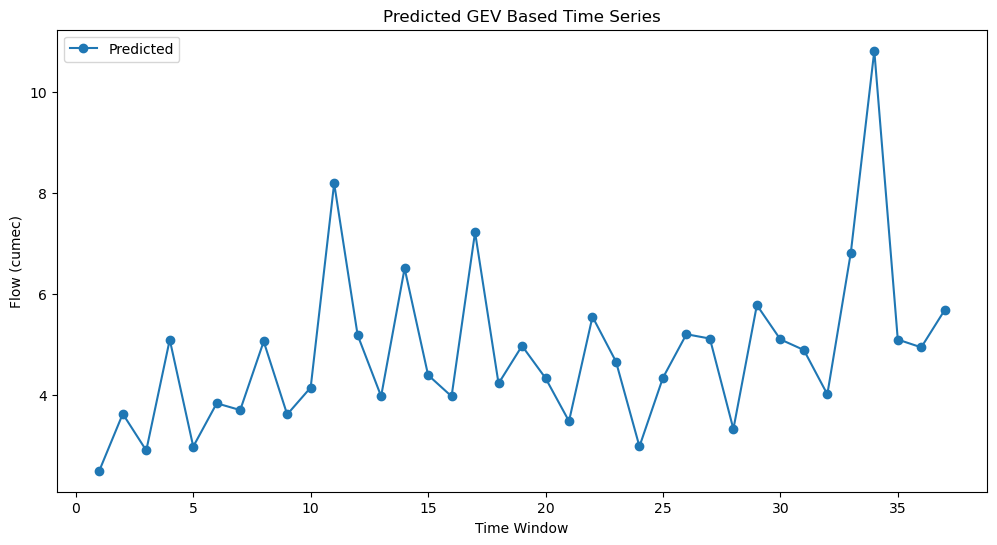

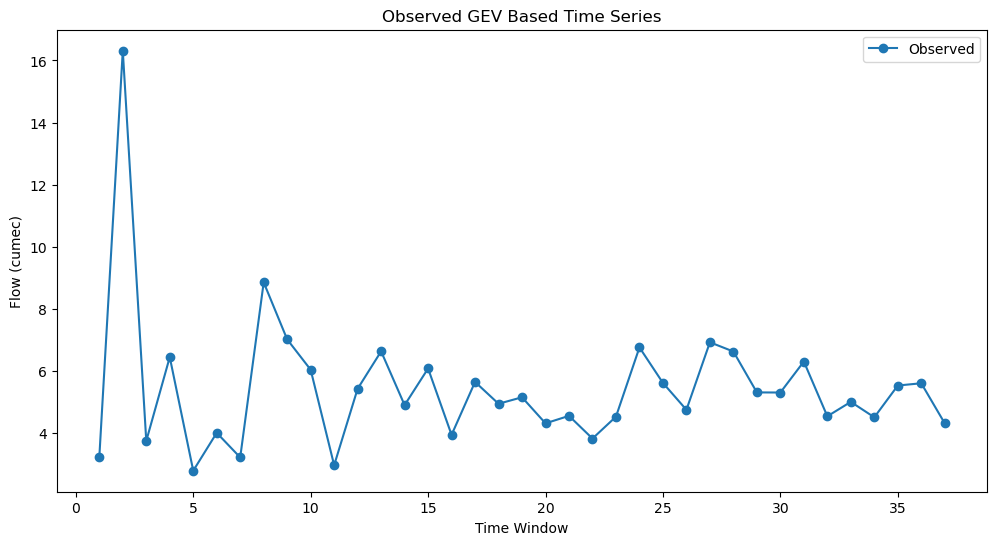

In [42]:
# In[45]:


import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import genextreme as gev

# Number of data points to generate for each window
num_data_points = 1 # For time series, typically one data point per window

def generate_and_plot_gev_time_series(loc_array, scale_array, shape_array, num_data_points, title):
    # Determine the number of windows
    num_windows = len(loc_array)

    # Prepare arrays to hold time series data
    time_series_data = []

    # Generate random data for each window
    for i in range(num_windows):
        # Generate random data using the GEV distribution with the given parameters
        random_data = gev.rvs(c=shape_array[i], loc=loc_array[i], scale=scale_array[i], size=num_data_points)
        time_series_data.append(random_data - total_useage)

    # Convert the list of data points to a numpy array
    time_series_data = np.array(time_series_data).flatten()  # Flatten in case num_data_points > 1

    # Plotting the time series
    plt.figure(figsize=(12, 6))
    plt.plot(range(1, num_windows + 1), time_series_data, marker='o', linestyle='-', label=title)
    plt.title(f"{title} GEV Based Time Series")
    plt.xlabel('Time Window')
    plt.ylabel('Flow (cumec)')
    plt.legend()
    plt.show()
    

smoothed_loc_pred = loc_pred
smoothed_scale_pred = scale_pred
smoothed_shape_pred = shape_pred

smoothed_loc_obs = loc_obs
smoothed_scale_obs = scale_obs
smoothed_shape_obs = shape_obs


# Generate and plot time series for predicted parameters
generate_and_plot_gev_time_series(smoothed_loc_pred, smoothed_scale_pred, smoothed_shape_pred, num_data_points, title="Predicted")

# Generate and plot time series for observed parameters
generate_and_plot_gev_time_series(smoothed_loc_obs, smoothed_scale_obs, smoothed_shape_obs, num_data_points, title="Observed")

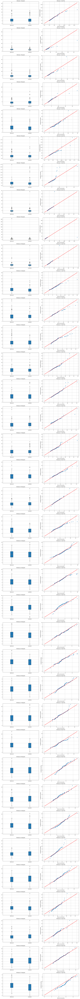

In [43]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import genextreme as gev

# Sample size for each set of GEV parameters
sample_size = 100

# Assuming you have your GEV parameters (loc, scale, shape) for observed and modelled data in arrays:
# e.g., smoothed_loc_obs, smoothed_scale_obs, smoothed_shape_obs for observed
#       smoothed_loc_pred, smoothed_scale_pred, smoothed_shape_pred for modelled

# Function to generate GEV distributed random data
def generate_gev_data(loc, scale, shape, size):
    return gev.rvs(c=shape, loc=loc, scale=scale, size=size)

# Generating random data for all windows
observed_data = [generate_gev_data(loc, scale, shape, sample_size) 
                 for loc, scale, shape in zip(smoothed_loc_obs, smoothed_scale_obs, smoothed_shape_obs)]
modelled_data = [generate_gev_data(loc, scale, shape, sample_size) 
                for loc, scale, shape in zip(smoothed_loc_pred, smoothed_scale_pred, smoothed_shape_pred)]

# Plotting both boxplots and QQ plots
fig, axs = plt.subplots(len(observed_data), 2, figsize=(15, 5*len(observed_data)))  # Adjusting for two plots per row

if len(observed_data) == 1:  # If there's only one window, axs is not a 2D array
    axs = [axs]

for i, (obs, mod) in enumerate(zip(observed_data, modelled_data)):
    # Boxplot
    axs[i][0].boxplot([obs, mod], patch_artist=True, labels=['Observed', 'modelled'])
    axs[i][0].set_title(f'Window {i+1} Boxplot')
    axs[i][0].grid(True)

    # QQ Plot
    axs[i][1].set_title(f'Window {i+1} QQ Plot')
    # Sorting data for QQ plot
    obs_sorted = np.sort(obs)
    mod_sorted = np.sort(mod)
    # Plotting the quantiles against each other
    axs[i][1].plot(obs_sorted, mod_sorted, 'o', markersize=5)
    # Line of equality for reference
    max_val = max(np.max(obs_sorted), np.max(mod_sorted))
    axs[i][1].plot([0, max_val], [0, max_val], 'r-', linewidth=2)
    axs[i][1].set_xlabel('Observed Quantiles')
    axs[i][1].set_ylabel('modelled Quantiles')
    axs[i][1].grid(True)

plt.tight_layout()
plt.show()


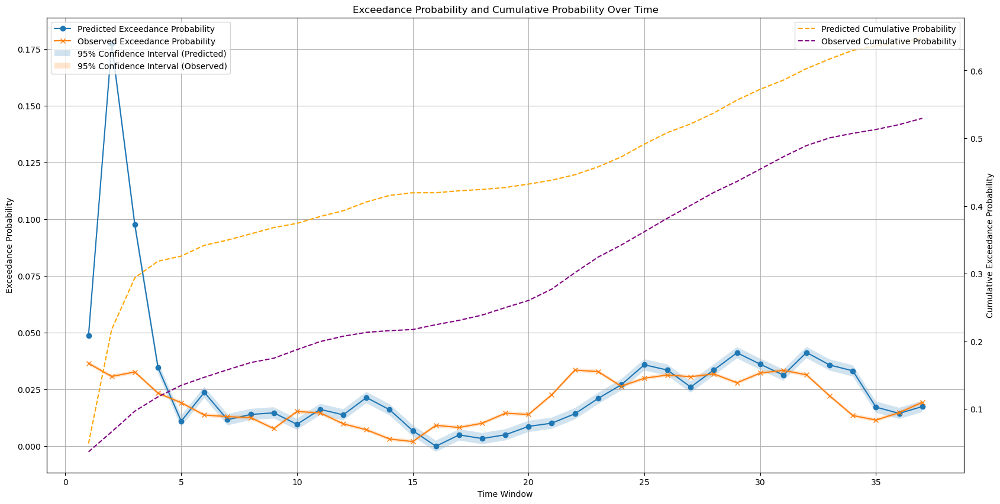

In [44]:
# In[47]:


import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import genextreme as gev
from scipy.signal import savgol_filter
from scipy.stats import t

def calculate_exceedance_probability(loc_array, scale_array, shape_array, num_data_points, num_simulations, threshold, low_flow):
    num_windows = len(loc_array)
    exceedances = np.zeros(num_windows, dtype=int)

    for i in range(num_windows):
        for _ in range(num_simulations):
            random_data = gev.rvs(c=shape_array[i], loc=loc_array[i], scale=scale_array[i], size=num_data_points)
            if low_flow == "On":
                exceedances[i] += np.sum((random_data - total_useage) < threshold)
            else:
                exceedances[i] += np.sum(random_data > threshold)

    exceedance_probability = exceedances / (num_data_points * num_simulations)
    return exceedance_probability

# Function to calculate cumulative exceedance probability
def calculate_cumulative_probability(probabilities):
    cumulative_probabilities = []
    cumulative = 1.0
    for p in probabilities:
        cumulative *= (1 - p)
        cumulative_probabilities.append(1 - cumulative)
    return np.array(cumulative_probabilities)

# Number of data points to generate for each window and number of simulations
num_data_points = 100
num_simulations = 1000

# Calculate exceedance probability for both predicted and observed data
predicted_exceedance_probability = calculate_exceedance_probability(loc_pred, scale_pred, shape_pred, num_data_points, num_simulations, threshold, low_flow)
observed_exceedance_probability = calculate_exceedance_probability(loc_obs, scale_obs, shape_obs, num_data_points, num_simulations, threshold, low_flow)

# Calculate cumulative exceedance probability for both predicted and observed data
predicted_cumulative_probability = calculate_cumulative_probability(predicted_exceedance_probability)
observed_cumulative_probability = calculate_cumulative_probability(observed_exceedance_probability)

# Calculate the 95% confidence interval for the observed exceedance probability
confidence_level = 0.99
degrees_of_freedom = num_simulations - 1
standard_error_observed = np.std(observed_exceedance_probability) / np.sqrt(num_simulations)
t_value_observed = t.ppf((1 + confidence_level) / 2, degrees_of_freedom)
margin_of_error_observed = t_value_observed * standard_error_observed
lower_bound_observed = observed_exceedance_probability - margin_of_error_observed
upper_bound_observed = observed_exceedance_probability + margin_of_error_observed

# Calculate the 95% confidence interval for the predicted exceedance probability
standard_error_predicted = np.std(predicted_exceedance_probability) / np.sqrt(num_simulations)
t_value_predicted = t.ppf((1 + confidence_level) / 2, degrees_of_freedom)
margin_of_error_predicted = t_value_predicted * standard_error_predicted
lower_bound_predicted = predicted_exceedance_probability - margin_of_error_predicted
upper_bound_predicted = predicted_exceedance_probability + margin_of_error_predicted

# Plotting the exceedance probabilities and cumulative probabilities with secondary y-axis
fig, ax1 = plt.subplots(figsize=(20, 10))

# Plotting the exceedance probabilities with confidence intervals on the primary y-axis
ax1.plot(range(1, len(smoothed_loc_pred) + 1), predicted_exceedance_probability, label='Predicted Exceedance Probability', marker='o')
ax1.plot(range(1, len(smoothed_loc_obs) + 1), observed_exceedance_probability, label='Observed Exceedance Probability', marker='x')
ax1.fill_between(range(1, len(smoothed_loc_pred) + 1), lower_bound_predicted, upper_bound_predicted, alpha=0.2, label='95% Confidence Interval (Predicted)')
ax1.fill_between(range(1, len(smoothed_loc_obs) + 1), lower_bound_observed, upper_bound_observed, alpha=0.2, label='95% Confidence Interval (Observed)')
ax1.set_xlabel('Time Window')
ax1.set_ylabel('Exceedance Probability')
ax1.legend(loc='upper left')
ax1.grid(True)

# Create a secondary y-axis for cumulative probabilities
ax2 = ax1.twinx()
ax2.plot(range(1, len(smoothed_loc_pred) + 1), predicted_cumulative_probability, label='Predicted Cumulative Probability', linestyle='--', color='orange')
ax2.plot(range(1, len(smoothed_loc_obs) + 1), observed_cumulative_probability, label='Observed Cumulative Probability', linestyle='--', color='purple')
ax2.set_ylabel('Cumulative Exceedance Probability')
ax2.legend(loc='upper right')

plt.title('Exceedance Probability and Cumulative Probability Over Time')
plt.show()

# Statistical Downscaling 

In [46]:
import numpy as np
import math
from scipy.special import gammaln

def pargev(lmom):
    SMALL = 1e-5
    eps = 1e-6
    maxit = 20

    # Constants
    EU = 0.5772156649  # Euler's constant
    DL2 = math.log(2)
    DL3 = math.log(3)

    # Coefficients for rational-function approximations
    A0 = 0.28377530
    A1 = -1.21096399
    A2 = -2.50728214
    A3 = -1.13455566
    A4 = -0.07138022
    B1 = 2.06189696
    B2 = 1.31912239
    B3 = 0.25077104
    C1 = 1.59921491
    C2 = -0.48832213
    C3 = 0.01573152
    D1 = -0.64363929
    D2 = 0.08985247

    # Initialize arrays to store parameter estimates
    loc = np.zeros(lmom.shape[1])
    scale = np.zeros(lmom.shape[1])
    c = np.zeros(lmom.shape[1])

    for i in range(lmom.shape[1]):
        l1, l2, l3 = lmom[0, i], lmom[1, i], lmom[2, i]
        if l2 <= 0:
            print(f"Skipping index {i} due to non-positive l2: l2={l2}")
            continue  # Skip this iteration if l2 is non-positive

        T3 = l3 / l2
        if abs(T3) >= 1:
            print(f"Skipping index {i} due to invalid T3: |T3|={abs(T3)} >= 1")
            continue  # Skip this iteration if T3 is out of bounds

        if T3 <= 0:
            G = (A0 + T3 * (A1 + T3 * (A2 + T3 * (A3 + T3 * A4)))) / (1 + T3 * (B1 + T3 * (B2 + T3 * B3)))
            T0 = (T3 + 3) * 0.5
            for _ in range(maxit):
                X2 = 2 ** -G
                X3 = 3 ** -G
                XX2 = 1 - X2
                XX3 = 1 - X3
                T = XX3 / XX2
                DERIV = (XX2 * X3 * DL3 - XX3 * X2 * DL2) / (XX2 ** 2)
                GOLD = G
                G -= (T - T0) / DERIV
                if abs(G - GOLD) <= eps * G:
                    break
            else:
                print(f"Non-convergence at index {i}, using default values")
                continue  # Use default values if not converged
        else:
            Z = 1 - T3
            G = (-1 + Z * (C1 + Z * (C2 + Z * C3))) / (1 + Z * (D1 + Z * D2))

        if abs(G) < SMALL:
            G = 0  # Avoid division by zero in calculations

        GAM = math.exp(gammaln(1 + G))
        scale[i] = l2 * G / (GAM * (1 - 2 ** -G)) if G != 0 else l2 / DL2
        loc[i] = l1 - scale[i] * ((1 - GAM) / G if G != 0 else -EU)
        c[i] = G

    return loc, scale, c

# Bash Script Used to Extract Climate Data from PCIC

# Climate Data Processing

In [47]:
import os  # Importing necessary libraries
import xarray as xr  # Importing necessary libraries
import pandas as pd  # Importing necessary libraries

# List of GCMs
gcms = ["ACCESS1-0", "CanESM2", "CCSM4", "CNRM-CM5", "HadGEM2-ES", "MPI-ESM-LR"]

# List of variables
variables = ["tasmax_day", "tasmin_day", "pr_day"]

# List of RCPs
rcps = ["rcp45", "rcp85"]

# Output directory
output_dir = "PCIC"

# Create output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

# Loop through combinations of GCMs, variables, and RCPs
for gcm in gcms:
    for variable in variables:
        for rcp in rcps:
            # Construct the file name
            file_name = f"{variable}_{gcm}_{rcp}.nc"
            file_path = os.path.join(output_dir, file_name)

            # Open the NetCDF file using xarray
            ds = xr.open_dataset(file_path)

            # Get the variable name
            variable_name = variable.split('_')[0]

            # Convert to Pandas DataFrame
            df = ds[variable_name].to_dataframe().reset_index()

            # Save as CSV file with correct time index
            csv_file = os.path.join(output_dir, f"{variable}_{gcm}_{rcp}.csv")
            df.to_csv(csv_file, index=False)

            # Display message
            print(f"Converted to DataFrame: {csv_file}")

            # Close the NetCDF file
            ds.close()

Converted to DataFrame: PCIC\tasmax_day_ACCESS1-0_rcp45.csv
Converted to DataFrame: PCIC\tasmax_day_ACCESS1-0_rcp85.csv
Converted to DataFrame: PCIC\tasmin_day_ACCESS1-0_rcp45.csv
Converted to DataFrame: PCIC\tasmin_day_ACCESS1-0_rcp85.csv
Converted to DataFrame: PCIC\pr_day_ACCESS1-0_rcp45.csv
Converted to DataFrame: PCIC\pr_day_ACCESS1-0_rcp85.csv
Converted to DataFrame: PCIC\tasmax_day_CanESM2_rcp45.csv
Converted to DataFrame: PCIC\tasmax_day_CanESM2_rcp85.csv
Converted to DataFrame: PCIC\tasmin_day_CanESM2_rcp45.csv
Converted to DataFrame: PCIC\tasmin_day_CanESM2_rcp85.csv
Converted to DataFrame: PCIC\pr_day_CanESM2_rcp45.csv
Converted to DataFrame: PCIC\pr_day_CanESM2_rcp85.csv
Converted to DataFrame: PCIC\tasmax_day_CCSM4_rcp45.csv
Converted to DataFrame: PCIC\tasmax_day_CCSM4_rcp85.csv
Converted to DataFrame: PCIC\tasmin_day_CCSM4_rcp45.csv
Converted to DataFrame: PCIC\tasmin_day_CCSM4_rcp85.csv
Converted to DataFrame: PCIC\pr_day_CCSM4_rcp45.csv
Converted to DataFrame: PCIC\pr_

In [48]:
import os  # Importing necessary libraries
import pandas as pd  # Importing necessary libraries

# Output directory
output_dir = "PCIC"

# List all CSV files in the output directory
csv_files = [file for file in os.listdir(output_dir) if file.endswith(".csv")]

# Loop through each CSV file
for csv_file in csv_files:
    # Construct the file path
    file_path = os.path.join(output_dir, csv_file)

    # Read the CSV file into a Pandas DataFrame to inspect its columns
    df = pd.read_csv(file_path)

    # Extract information from the file name to create a meaningful DataFrame name
    file_parts = csv_file.split("_")
    gcm = file_parts[0]
    
    # Extract the model name from the last part before the RCP
    model = file_parts[-2]
    
    # Extract RCP from the last part of the file name
    rcp = file_parts[-1].split(".")[0]  # Assumes RCP is the last part before the file extension

    variable = file_parts[1]
    
    dataframe_name = f"{gcm}_{variable}_{model}_{rcp}"

In [49]:
import os  # Importing necessary libraries
import pandas as pd  # Importing necessary libraries

# Output directory
output_dir = "PCIC"

# List all CSV files in the output directory
csv_files = [file for file in os.listdir(output_dir) if file.endswith(".csv")]

# Dictionary to store DataFrames
dataframes = {}

# Loop through each CSV file
for csv_file in csv_files:
    # Construct the file path
    file_path = os.path.join(output_dir, csv_file)

    # Read the CSV file into a Pandas DataFrame
    df = pd.read_csv(file_path)

    # Extract information from the file name to create a meaningful DataFrame name
    file_parts = csv_file.split("_")
    gcm = file_parts[0]
    model = file_parts[-2]
    variable = file_parts[1]
    rcp = file_parts[-1].split(".")[0]

    # Create a unique identifier for each DataFrame
    dataframe_name = f"{gcm}_{variable}_{model}_{rcp}"

    # Store the DataFrame in the dictionary
    dataframes[dataframe_name] = df

# Access

In [50]:
pr_day_ACCESS1_0_rcp45 = dataframes["pr_day_ACCESS1-0_rcp45"]
pr_day_ACCESS1_0_rcp85 = dataframes["pr_day_ACCESS1-0_rcp85"]

tasmin_day_ACCESS1_0_rcp45 = dataframes["tasmin_day_ACCESS1-0_rcp45"]
tasmin_day_ACCESS1_0_rcp85 = dataframes["tasmin_day_ACCESS1-0_rcp85"]

tasmax_day_ACCESS1_0_rcp45 = dataframes["tasmax_day_ACCESS1-0_rcp45"]
tasmax_day_ACCESS1_0_rcp85 = dataframes["tasmax_day_ACCESS1-0_rcp85"]

# CanESM2

In [51]:
pr_day_CanESM2_rcp45 = dataframes["pr_day_CanESM2_rcp45"]
pr_day_CanESM2_rcp85 = dataframes["pr_day_CanESM2_rcp85"]

tasmin_day_CanESM2_rcp45 = dataframes["tasmin_day_CanESM2_rcp45"]
tasmin_day_CanESM2_rcp85 = dataframes["tasmin_day_CanESM2_rcp85"]

tasmax_day_CanESM2_rcp45 = dataframes["tasmax_day_CanESM2_rcp45"]
tasmax_day_CanESM2_rcp85 = dataframes["tasmax_day_CanESM2_rcp85"]

# CCSM4

In [52]:
pr_day_CCSM4_rcp45 = dataframes["pr_day_CCSM4_rcp45"]
pr_day_CCSM4_rcp85 = dataframes["pr_day_CCSM4_rcp85"]

tasmin_day_CCSM4_rcp45 = dataframes["tasmin_day_CCSM4_rcp45"]
tasmin_day_CCSM4_rcp85 = dataframes["tasmin_day_CCSM4_rcp85"]

tasmax_day_CCSM4_rcp45 = dataframes["tasmax_day_CCSM4_rcp45"]
tasmax_day_CCSM4_rcp85 = dataframes["tasmax_day_CCSM4_rcp85"]

# CNRM-CM5

In [53]:
pr_day_CNRM_CM5_rcp45 = dataframes["pr_day_CNRM-CM5_rcp45"]
pr_day_CNRM_CM5_rcp85 = dataframes["pr_day_CNRM-CM5_rcp85"]

tasmin_day_CNRM_CM5_rcp45 = dataframes["tasmin_day_CNRM-CM5_rcp45"]
tasmin_day_CNRM_CM5_rcp85 = dataframes["tasmin_day_CNRM-CM5_rcp85"]

tasmax_day_CNRM_CM5_rcp45 = dataframes["tasmax_day_CNRM-CM5_rcp45"]
tasmax_day_CNRM_CM5_rcp85 = dataframes["tasmax_day_CNRM-CM5_rcp85"]

# HadGEM2

In [54]:
pr_day_HadGEM2_rcp45 = dataframes["pr_day_HadGEM2-ES_rcp45"]
pr_day_HadGEM2_rcp85 = dataframes["pr_day_HadGEM2-ES_rcp85"]

tasmin_day_HadGEM2_rcp45 = dataframes["tasmin_day_HadGEM2-ES_rcp45"]
tasmin_day_HadGEM2_rcp85 = dataframes["tasmin_day_HadGEM2-ES_rcp85"]

tasmax_day_HadGEM2_rcp45 = dataframes["tasmax_day_HadGEM2-ES_rcp45"]
tasmax_day_HadGEM2_rcp85 = dataframes["tasmax_day_HadGEM2-ES_rcp85"]

# MPI-ESM-LR

In [55]:
pr_day_MPI_ESM_LR_rcp45 = dataframes["pr_day_MPI-ESM-LR_rcp45"]
pr_day_MPI_ESM_LR_rcp85 = dataframes["pr_day_MPI-ESM-LR_rcp85"]

tasmin_day_MPI_ESM_LR_rcp45 = dataframes["tasmin_day_MPI-ESM-LR_rcp45"]
tasmin_day_MPI_ESM_LR_rcp85 = dataframes["tasmin_day_MPI-ESM-LR_rcp85"]

tasmax_day_MPI_ESM_LR_rcp45 = dataframes["tasmax_day_MPI-ESM-LR_rcp45"]
tasmax_day_MPI_ESM_LR_rcp85 = dataframes["tasmax_day_MPI-ESM-LR_rcp85"]

Processing RCP 4.5 models for precipitation:
Processing ACCESS1_0
Processing CanESM2
Processing CCSM4
Processing CNRM_CM5
Processing HadGEM2
Invalid dates found in HadGEM2:
       time     lat         lon        pr
58     NaT  49.125 -116.541668 -0.000092
59     NaT  49.125 -116.541668 -0.000092
418    NaT  49.125 -116.541668  6.713867
419    NaT  49.125 -116.541668 -0.000092
779    NaT  49.125 -116.541668  4.663055
...    ...     ...         ...       ...
52949  NaT  49.125 -116.541668 -0.000092
53308  NaT  49.125 -116.541668 -0.000092
53309  NaT  49.125 -116.541668 -0.000092
53668  NaT  49.125 -116.541668  1.708923
53669  NaT  49.125 -116.541668  0.585846

[263 rows x 4 columns]
Processing MPI_ESM_LR


C:\Users\Local Admin\AppData\Local\Temp\ipykernel_24952\3064511001.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['month'] = df.index.month


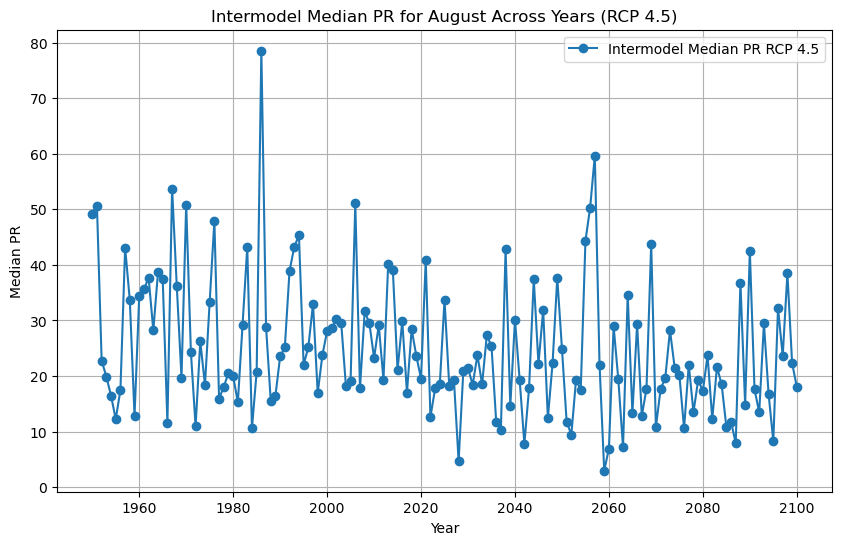

Processing RCP 4.5 models for tasmin:
Processing ACCESS1_0
Processing CanESM2
Processing CCSM4
Processing CNRM_CM5
Processing HadGEM2
Invalid dates found in HadGEM2:
       time     lat         lon    tasmin
58     NaT  49.125 -116.541668  1.329061
59     NaT  49.125 -116.541668 -0.630197
418    NaT  49.125 -116.541668 -0.416571
419    NaT  49.125 -116.541668  0.682078
779    NaT  49.125 -116.541668  2.009613
...    ...     ...         ...       ...
52949  NaT  49.125 -116.541668 -5.137712
53308  NaT  49.125 -116.541668  3.697260
53309  NaT  49.125 -116.541668  3.779659
53668  NaT  49.125 -116.541668 -8.723581
53669  NaT  49.125 -116.541668 -8.223085

[263 rows x 4 columns]
Processing MPI_ESM_LR


C:\Users\Local Admin\AppData\Local\Temp\ipykernel_24952\3064511001.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['month'] = df.index.month


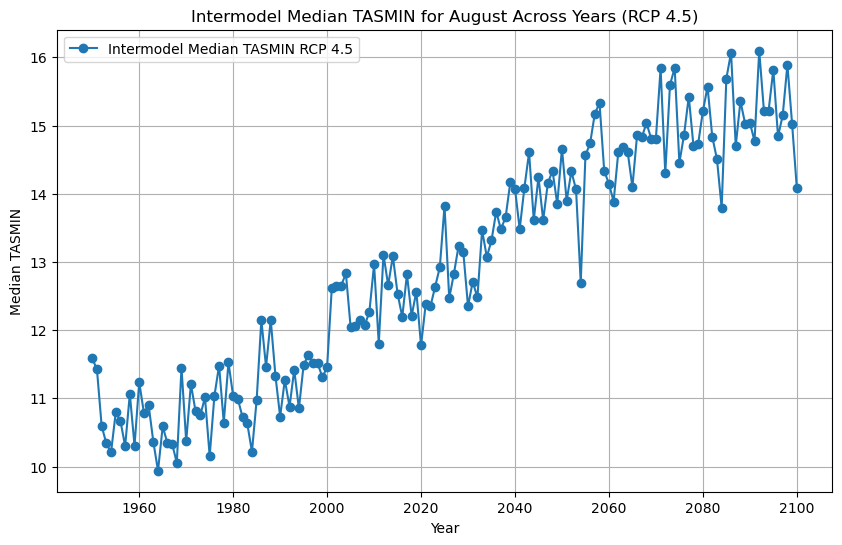

Processing RCP 4.5 models for tasmax:
Processing ACCESS1_0
Processing CanESM2
Processing CCSM4
Processing CNRM_CM5
Processing HadGEM2
Invalid dates found in HadGEM2:
       time     lat         lon     tasmax
58     NaT  49.125 -116.541668   7.853817
59     NaT  49.125 -116.541668   8.326847
418    NaT  49.125 -116.541668   9.462118
419    NaT  49.125 -116.541668   9.687951
779    NaT  49.125 -116.541668   9.068436
...    ...     ...         ...        ...
52949  NaT  49.125 -116.541668   2.690165
53308  NaT  49.125 -116.541668  12.248415
53309  NaT  49.125 -116.541668  10.081634
53668  NaT  49.125 -116.541668   1.359579
53669  NaT  49.125 -116.541668   3.315785

[263 rows x 4 columns]
Processing MPI_ESM_LR


C:\Users\Local Admin\AppData\Local\Temp\ipykernel_24952\3064511001.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['month'] = df.index.month


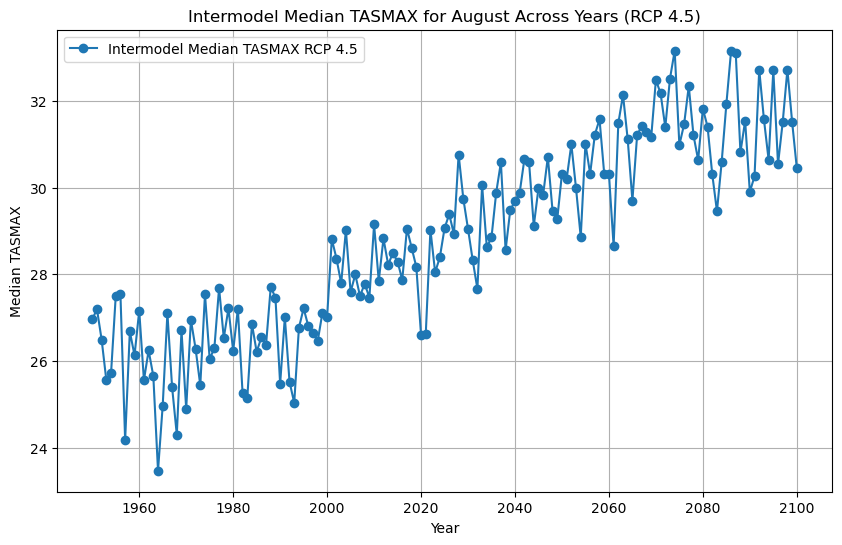

Processing RCP 8.5 models for precipitation:
Processing ACCESS1_0
Processing CanESM2
Processing CCSM4
Processing CNRM_CM5
Processing HadGEM2
Invalid dates found in HadGEM2:
       time     lat         lon        pr
58     NaT  49.125 -116.541668 -0.000092
59     NaT  49.125 -116.541668 -0.000092
418    NaT  49.125 -116.541668  6.774902
419    NaT  49.125 -116.541668 -0.000092
779    NaT  49.125 -116.541668  4.650848
...    ...     ...         ...       ...
52979  NaT  49.125 -116.541668  0.244049
53338  NaT  49.125 -116.541668  0.927643
53339  NaT  49.125 -116.541668  0.695709
53698  NaT  49.125 -116.541668 -0.000092
53699  NaT  49.125 -116.541668 -0.000092

[263 rows x 4 columns]
Processing MPI_ESM_LR


C:\Users\Local Admin\AppData\Local\Temp\ipykernel_24952\3064511001.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['month'] = df.index.month


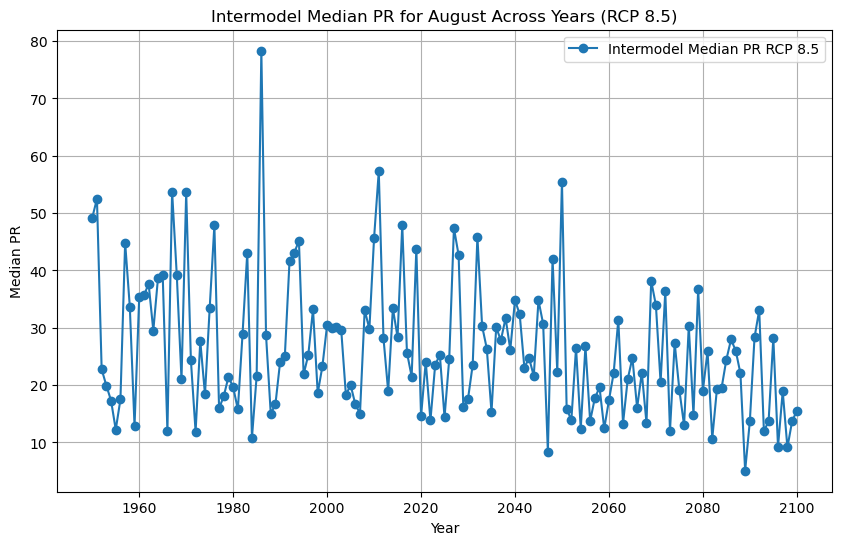

Processing RCP 8.5 models for tasmin:
Processing ACCESS1_0
Processing CanESM2
Processing CCSM4
Processing CNRM_CM5
Processing HadGEM2
Invalid dates found in HadGEM2:
       time     lat         lon    tasmin
58     NaT  49.125 -116.541668  1.329061
59     NaT  49.125 -116.541668 -0.630197
418    NaT  49.125 -116.541668 -0.416571
419    NaT  49.125 -116.541668  0.682078
779    NaT  49.125 -116.541668  2.009613
...    ...     ...         ...       ...
53339  NaT  49.125 -116.541668  5.409322
53698  NaT  49.125 -116.541668  5.448996
53699  NaT  49.125 -116.541668  5.052261
54058  NaT  49.125 -116.541668  5.024795
54059  NaT  49.125 -116.541668  5.232318

[265 rows x 4 columns]
Processing MPI_ESM_LR


C:\Users\Local Admin\AppData\Local\Temp\ipykernel_24952\3064511001.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['month'] = df.index.month


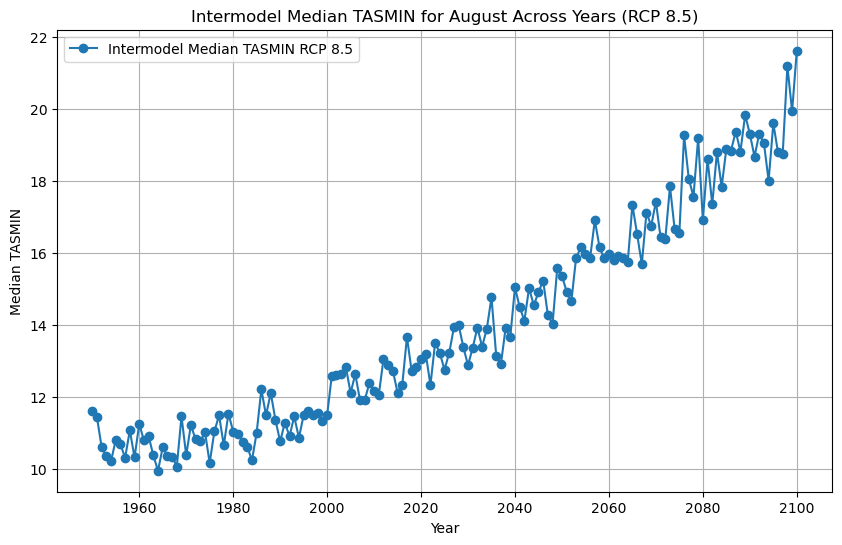

Processing RCP 8.5 models for tasmax:
Processing ACCESS1_0
Processing CanESM2
Processing CCSM4
Processing CNRM_CM5
Processing HadGEM2
Invalid dates found in HadGEM2:
       time     lat         lon     tasmax
58     NaT  49.125 -116.541668   7.853817
59     NaT  49.125 -116.541668   8.326847
418    NaT  49.125 -116.541668   9.462118
419    NaT  49.125 -116.541668   9.687951
779    NaT  49.125 -116.541668   9.068436
...    ...     ...         ...        ...
53339  NaT  49.125 -116.541668  14.784464
53698  NaT  49.125 -116.541668   9.770350
53699  NaT  49.125 -116.541668  10.136567
54058  NaT  49.125 -116.541668  10.606545
54059  NaT  49.125 -116.541668  10.267795

[265 rows x 4 columns]
Processing MPI_ESM_LR


C:\Users\Local Admin\AppData\Local\Temp\ipykernel_24952\3064511001.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['month'] = df.index.month


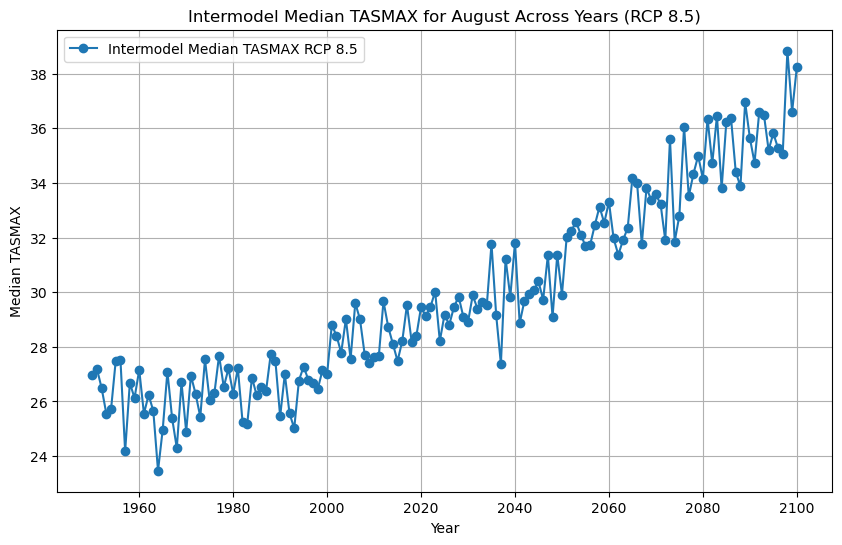

In [56]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Assuming you have the following DataFrames:
# pr_day_ACCESS1_0_rcp45, pr_day_CanESM2_rcp45, pr_day_CCSM4_rcp45, pr_day_CNRM_CM5_rcp45, pr_day_HadGEM2_rcp45, pr_day_MPI_ESM_LR_rcp45 
# pr_day_ACCESS1_0_rcp85, pr_day_CanESM2_rcp85, pr_day_CCSM4_rcp85, pr_day_CNRM_CM5_rcp85, pr_day_HadGEM2_rcp85, pr_day_MPI_ESM_LR_rcp85 
# tasmin_day_ACCESS1_0_rcp45, tasmin_day_CanESM2_rcp45, tasmin_day_CCSM4_rcp45, tasmin_day_CNRM_CM5_rcp45, tasmin_day_HadGEM2_rcp45, tasmin_day_MPI_ESM_LR_rcp45 
# tasmin_day_ACCESS1_0_rcp85, tasmin_day_CanESM2_rcp85, tasmin_day_CCSM4_rcp85, tasmin_day_CNRM_CM5_rcp85, tasmin_day_HadGEM2_rcp85, tasmin_day_MPI_ESM_LR_rcp85 
# tasmax_day_ACCESS1_0_rcp45, tasmax_day_CanESM2_rcp45, tasmax_day_CCSM4_rcp45, tasmax_day_CNRM_CM5_rcp45, tasmax_day_HadGEM2_rcp45, tasmax_day_MPI_ESM_LR_rcp45 
# tasmax_day_ACCESS1_0_rcp85, tasmax_day_CanESM2_rcp85, tasmax_day_CCSM4_rcp85, tasmax_day_CNRM_CM5_rcp85, tasmax_day_HadGEM2_rcp85, tasmax_day_MPI_ESM_LR_rcp85 

# List of models and their corresponding DataFrames for RCP 4.5 and RCP 8.5
rcp45_models_pr = {
    'ACCESS1_0': pr_day_ACCESS1_0_rcp45,
    'CanESM2': pr_day_CanESM2_rcp45,
    'CCSM4': pr_day_CCSM4_rcp45,
    'CNRM_CM5': pr_day_CNRM_CM5_rcp45,
    'HadGEM2': pr_day_HadGEM2_rcp45,
    'MPI_ESM_LR': pr_day_MPI_ESM_LR_rcp45
}

rcp85_models_pr = {
    'ACCESS1_0': pr_day_ACCESS1_0_rcp85,
    'CanESM2': pr_day_CanESM2_rcp85,
    'CCSM4': pr_day_CCSM4_rcp85,
    'CNRM_CM5': pr_day_CNRM_CM5_rcp85,
    'HadGEM2': pr_day_HadGEM2_rcp85,
    'MPI_ESM_LR': pr_day_MPI_ESM_LR_rcp85
}

rcp45_models_tasmin = {
    'ACCESS1_0': tasmin_day_ACCESS1_0_rcp45,
    'CanESM2': tasmin_day_CanESM2_rcp45,
    'CCSM4': tasmin_day_CCSM4_rcp45,
    'CNRM_CM5': tasmin_day_CNRM_CM5_rcp45,
    'HadGEM2': tasmin_day_HadGEM2_rcp45,
    'MPI_ESM_LR': tasmin_day_MPI_ESM_LR_rcp45
}

rcp85_models_tasmin = {
    'ACCESS1_0': tasmin_day_ACCESS1_0_rcp85,
    'CanESM2': tasmin_day_CanESM2_rcp85,
    'CCSM4': tasmin_day_CCSM4_rcp85,
    'CNRM_CM5': tasmin_day_CNRM_CM5_rcp85,
    'HadGEM2': tasmin_day_HadGEM2_rcp85,
    'MPI_ESM_LR': tasmin_day_MPI_ESM_LR_rcp85
}

rcp45_models_tasmax = {
    'ACCESS1_0': tasmax_day_ACCESS1_0_rcp45,
    'CanESM2': tasmax_day_CanESM2_rcp45,
    'CCSM4': tasmax_day_CCSM4_rcp45,
    'CNRM_CM5': tasmax_day_CNRM_CM5_rcp45,
    'HadGEM2': tasmax_day_HadGEM2_rcp45,
    'MPI_ESM_LR': tasmax_day_MPI_ESM_LR_rcp45
}

rcp85_models_tasmax = {
    'ACCESS1_0': tasmax_day_ACCESS1_0_rcp85,
    'CanESM2': tasmax_day_CanESM2_rcp85,
    'CCSM4': tasmax_day_CCSM4_rcp85,
    'CNRM_CM5': tasmax_day_CNRM_CM5_rcp85,
    'HadGEM2': tasmax_day_HadGEM2_rcp85,
    'MPI_ESM_LR': tasmax_day_MPI_ESM_LR_rcp85
}

# Function to clean and convert 'time' column to datetime
def clean_time_column(df, model_name):
    if 'time' not in df.columns:
        print(f"'time' column missing in {model_name}.")
        return None
    df['time'] = pd.to_datetime(df['time'], errors='coerce')
    invalid_dates = df[df['time'].isna()]
    if not invalid_dates.empty:
        print(f"Invalid dates found in {model_name}:\n", invalid_dates)
    df = df.dropna(subset=['time'])
    return df

# Function to process data for each model and calculate the intermodel median
def process_data(models, variable, selected_month, lag):
    yearly_data = {}

    for model_name, df in models.items():
        print(f"Processing {model_name}")

        # Clean the 'time' column
        df = clean_time_column(df, model_name)
        if df is None:
            continue
        
        # Set the 'time' column as the index
        df.set_index('time', inplace=True)
        
        # Add a new column for the month derived from the datetime index
        df['month'] = df.index.month
        
        # Filter the DataFrame for the selected month
        df_selected_month = df[df['month'] == (selected_month - lag)]
        
        # Group by year and calculate the total for the selected variable for each year in the selected month
        if variable == 'pr':
            total_variable = df_selected_month.groupby(df_selected_month.index.year)[variable].sum()
        else:
            total_variable = df_selected_month.groupby(df_selected_month.index.year)[variable].mean()
        
        # Store the total variable in the yearly_data dictionary
        for year, value in total_variable.items():
            if year not in yearly_data:
                yearly_data[year] = []
            yearly_data[year].append(value)

    # Calculate the median for the selected variable for each year across all models
    intermodel_median = {year: np.median(values) for year, values in yearly_data.items()}
    
    # Convert to DataFrame for plotting
    intermodel_median_df = pd.DataFrame(list(intermodel_median.items()), columns=['year', f'median_{variable}'])
    return intermodel_median_df

# Function to plot the intermodel median data
def plot_median_data(median_data, variable, rcp_label):
    plt.figure(figsize=(10, 6))
    plt.plot(median_data['year'], median_data[f'median_{variable}'], marker='o', linestyle='-', label=f'Intermodel Median {variable.upper()} {rcp_label}')
    plt.title(f'Intermodel Median {variable.upper()} for {pd.to_datetime(f"2000-{selected_month - lag}-01").strftime("%B")} Across Years ({rcp_label})')
    plt.xlabel('Year')
    plt.ylabel(f'Median {variable.upper()}')
    plt.legend()
    plt.grid(True)
    plt.show()

print("Processing RCP 4.5 models for precipitation:")
rcp45_median_data_pr = process_data(rcp45_models_pr, 'pr', selected_month, lag)
plot_median_data(rcp45_median_data_pr, 'pr', 'RCP 4.5')

print("Processing RCP 4.5 models for tasmin:")
rcp45_median_data_tasmin = process_data(rcp45_models_tasmin, 'tasmin', selected_month, lag)
plot_median_data(rcp45_median_data_tasmin, 'tasmin', 'RCP 4.5')

print("Processing RCP 4.5 models for tasmax:")
rcp45_median_data_tasmax = process_data(rcp45_models_tasmax, 'tasmax', selected_month, lag)
plot_median_data(rcp45_median_data_tasmax, 'tasmax', 'RCP 4.5')

# Process and plot data for RCP 8.5
print("Processing RCP 8.5 models for precipitation:")
rcp85_median_data_pr = process_data(rcp85_models_pr, 'pr', selected_month, lag)
plot_median_data(rcp85_median_data_pr, 'pr', 'RCP 8.5')

print("Processing RCP 8.5 models for tasmin:")
rcp85_median_data_tasmin = process_data(rcp85_models_tasmin, 'tasmin', selected_month, lag)
plot_median_data(rcp85_median_data_tasmin, 'tasmin', 'RCP 8.5')

print("Processing RCP 8.5 models for tasmax:")
rcp85_median_data_tasmax = process_data(rcp85_models_tasmax, 'tasmax', selected_month, lag)
plot_median_data(rcp85_median_data_tasmax, 'tasmax', 'RCP 8.5')

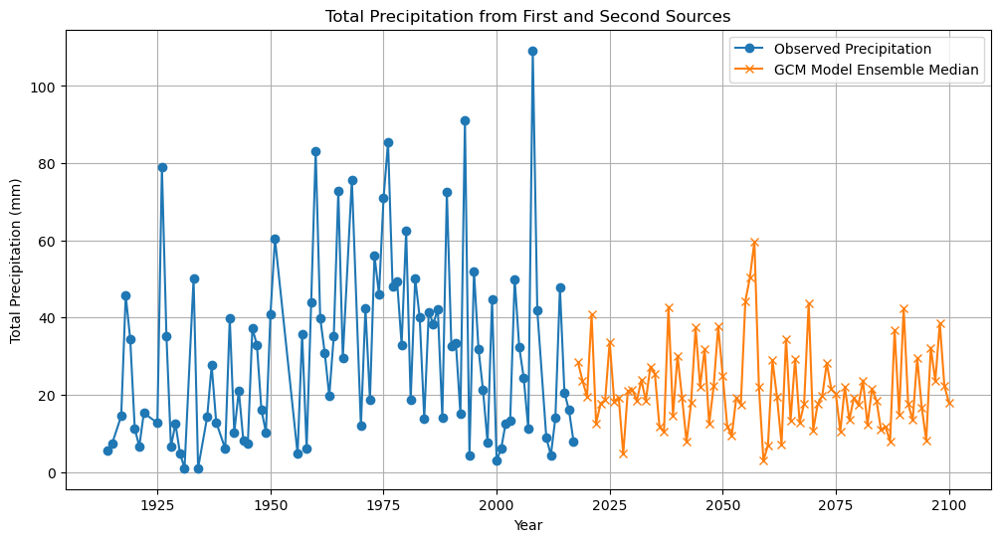

In [57]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'selected_month_total_precip' is a DataFrame from the first source and has a column 'total_precip'.
# Assuming 'rcp85_median_data_pr', 'rcp45_median_data_pr', 'rcp85_median_data_tasmin', 'rcp45_median_data_tasmin', 'rcp85_median_data_tasmax', 'rcp45_median_data_tasmax'
# are DataFrames computed earlier and have columns 'median_pr', 'median_tasmin', 'median_tasmax'.

# Data extraction from the first source

#first_source_precip = np.array(selected_month_total_precip['total_precip'])[total_precip_indices]
#first_source_min_temp = np.array(selected_month_min_temp['Min_Temperature'])[total_min_temp_indices]
#first_source_max_temp = np.array(selected_month_max_temp['Max_Temperature'])[total_max_temp_indices]

first_source_precip = np.array(selected_month_total_precip['total_precip'])[total_precip_indices]
first_source_years = np.array(selected_month_total_precip['Year'])[total_precip_indices]

# Data extraction from the second source (using the intermodel median computed earlier)
if rcp_85 == "On":
    second_source_precip = np.array(rcp85_median_data_pr['median_pr'])[68:]
    second_source_tasmin = np.array(rcp85_median_data_tasmin['median_tasmin'])[68:]
    second_source_tasmax = np.array(rcp85_median_data_tasmax['median_tasmax'])[68:]
else:
    second_source_precip = np.array(rcp45_median_data_pr['median_pr'])[68:]
    second_source_tasmin = np.array(rcp45_median_data_tasmin['median_tasmin'])[68:]
    second_source_tasmax = np.array(rcp45_median_data_tasmax['median_tasmax'])[68:]

# Generate the years for the second source based on the last year of the first source
start_year = first_source_years[-1] + 1
years_second_source = np.arange(start_year, start_year + len(second_source_precip))

# Plotting the data
plt.figure(figsize=(12, 6))
plt.plot(first_source_years, first_source_precip, label='Observed Precipitation', marker='o')
plt.plot(years_second_source, second_source_precip, label='GCM Model Ensemble Median', marker='x')
plt.xlabel('Year')
plt.ylabel('Total Precipitation (mm)')
plt.title('Total Precipitation from First and Second Sources')
plt.legend()
plt.grid(True)
plt.show()

In [58]:
# Combining the data
combined_precip = np.concatenate((first_source_precip, second_source_precip)).astype(float)
#combined_tasmin = np.concatenate((first_source_tasmin, second_source_tasmin)).astype(float)
#combined_tasmax = np.concatenate((first_source_tasmax, second_source_tasmax)).astype(float)

# Prepare the combined data as a dictionary
new_signal_data = {
    'Total Precip': combined_precip,
    #'Tasmin': combined_tasmin,
    #'Tasmax': combined_tasmax
}

In [59]:
# Calculate L-moments for the new data
new_lmom_dfs = {signal: calculate_lmom_df(data, window_size, l_moment_names) for signal, data in new_signal_data.items()}

# Apply rolling mean to the new L-moment DataFrames
new_lmom_dfs_smoothed = {signal: df.rolling(window=rolling_window_size, min_periods=1).mean().dropna() for signal, df in new_lmom_dfs.items()}

# Extract and predict the first four L-moments
predicted_l_moments = {}
for l_moment in ['L-moment 1', 'L-moment 2', 'L-moment 3', 'L-moment 4']:
    model_info = best_models.get(l_moment)
    if model_info:
        model, _, _, _, _, _, predictors_used = model_info
        coefficients = model.params[1:]
        intercept = model.params[0]
        new_predictors = np.hstack([new_lmom_dfs_smoothed[signal_names[idx]][l_m].values.reshape(-1, 1) for idx, l_m in predictors_used])
        new_predictions = predict_with_model(intercept, coefficients, new_predictors)
        predicted_l_moments[l_moment] = new_predictions

# Now predicted_l_moments contains the predictions for the first four L-moments
l_moment1_array = np.array(predicted_l_moments['L-moment 1'])
l_moment2_array = np.array(predicted_l_moments['L-moment 2'])
l_moment3_array = np.array(predicted_l_moments['L-moment 3'])
l_moment4_array = np.array(predicted_l_moments['L-moment 4'])

goat_l_moments = np.vstack([l_moment1_array, l_moment2_array, l_moment3_array, l_moment4_array])

# For R Use Later 

In [60]:
import numpy as np
import pandas as pd

# Assuming you have the predicted L-moments as arrays
l_moment1_array = np.array(predicted_l_moments['L-moment 1'])
l_moment2_array = np.array(predicted_l_moments['L-moment 2'])
l_moment3_array = np.array(predicted_l_moments['L-moment 3'])
l_moment4_array = np.array(predicted_l_moments['L-moment 4'])

# Calculate L-moment ratios
st2_array = l_moment2_array / l_moment1_array
st3_array = l_moment3_array / l_moment2_array
st4_array = l_moment4_array / l_moment2_array

# Create a DataFrame for L-moments
l_moments_df = pd.DataFrame({
    'sl1': l_moment1_array,  # sample 1st l-moment
    'sl2': l_moment2_array,  # sample 2nd l-moment
    'sl3': l_moment3_array,  # sample 3rd l-moment
    'sl4': l_moment4_array   # sample 4th l-moment
})

# Create a DataFrame for L-moment ratios
l_moment_ratios_df = pd.DataFrame({
    'st2': st2_array,  # sample 2nd l-moment ratio
    'st3': st3_array,  # sample 3rd l-moment ratio
    'st4': st4_array   # sample 4th l-moment ratio
})

# Save to an Excel workbook
with pd.ExcelWriter('L_moments_and_ratios.xlsx') as writer:
    l_moments_df.to_excel(writer, sheet_name='L-moments', index=False)
    l_moment_ratios_df.to_excel(writer, sheet_name='L-moment ratios', index=False)

print("L-moments and L-moment ratios saved to 'L_moments_and_ratios.xlsx'")

L-moments and L-moment ratios saved to 'L_moments_and_ratios.xlsx'


In [61]:
import matplotlib.pyplot as plt
import numpy as np

# Calculating L-moment ratios for predicted data
tau2_pred = l_moment2_array / l_moment1_array
tau3_pred = l_moment3_array / l_moment2_array
tau4_pred = l_moment4_array / l_moment2_array

window_positions_pred = np.arange(1, len(tau2_pred) + 1)

# Normalize window positions for color coding
norm = plt.Normalize(window_positions_pred.min(), window_positions_pred.max())
cmap = plt.cm.viridis  # Choose a colormap that fits your preference



import matplotlib.pyplot as plt
import pandas as pd
import numpy as np


window_positions_obs = lmom_df['Position'].values
norm = plt.Normalize(window_positions_obs.min(), window_positions_obs.max())
cmap = plt.cm.viridis  # Ensure consistent colormap usage

In [62]:
import numpy as np
import matplotlib.pyplot as plt

# Data for L-moment ratio diagram
data = np.array([
    [-1.00, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000],
    [-0.99, 0.9834, 0.9761, 0.9752, 0.9775, 0.9752, 0.9752, 0.9751],
    [-0.98, 0.9670, 0.9532, 0.9507, 0.9561, 0.9510, 0.9507, 0.9505],
    [-0.97, 0.9508, 0.9311, 0.9267, 0.9356, 0.9271, 0.9265, 0.9261],
    [-0.96, 0.9347, 0.9095, 0.9030, 0.9159, 0.9038, 0.9026, 0.9020],
    [-0.95, 0.9188, 0.8885, 0.8796, 0.8968, 0.8809, 0.8791, 0.8781],
    [-0.94, 0.9030, 0.8681, 0.8567, 0.8782, 0.8584, 0.8559, 0.8545],
    [-0.93, 0.8874, 0.8480, 0.8340, 0.8600, 0.8364, 0.8331, 0.8311],
    [-0.92, 0.8720, 0.8284, 0.8118, 0.8422, 0.8149, 0.8105, 0.8080],
    [-0.91, 0.8568, 0.8092, 0.7899, 0.8247, 0.7938, 0.7883, 0.7851],
    [-0.90, 0.8417, 0.7904, 0.7683, 0.8077, 0.7731, 0.7664, 0.7625],
    [-0.89, 0.8268, 0.7720, 0.7471, 0.7909, 0.7529, 0.7448, 0.7401],
    [-0.88, 0.8120, 0.7540, 0.7262, 0.7745, 0.7330, 0.7235, 0.7180],
    [-0.87, 0.7974, 0.7363, 0.7057, 0.7583, 0.7136, 0.7026, 0.6961],
    [-0.86, 0.7830, 0.7189, 0.6855, 0.7425, 0.6946, 0.6819, 0.6745],
    [-0.85, 0.7688, 0.7019, 0.6657, 0.7269, 0.6761, 0.6616, 0.6531],
    [-0.84, 0.7547, 0.6851, 0.6462, 0.7116, 0.6579, 0.6416, 0.6320],
    [-0.83, 0.7408, 0.6687, 0.6270, 0.6966, 0.6401, 0.6218, 0.6111],
    [-0.82, 0.7270, 0.6526, 0.6081, 0.6818, 0.6227, 0.6024, 0.5905],
    [-0.81, 0.7134, 0.6368, 0.5896, 0.6672, 0.6057, 0.5833, 0.5701],
    [-0.80, 0.7000, 0.6213, 0.5714, 0.6529, 0.5891, 0.5645, 0.5500],
    [-0.79, 0.6868, 0.6061, 0.5536, 0.6389, 0.5729, 0.5460, 0.5301],
    [-0.78, 0.6737, 0.5912, 0.5360, 0.6251, 0.5571, 0.5278, 0.5105],
    [-0.77, 0.6608, 0.5765, 0.5188, 0.6115, 0.5416, 0.5099, 0.4911],
    [-0.76, 0.6480, 0.5622, 0.5019, 0.5981, 0.5265, 0.4923, 0.4720],
    [-0.75, 0.6354, 0.5480, 0.4853, 0.5850, 0.5118, 0.4750, 0.4531],
    [-0.74, 0.6230, 0.5342, 0.4690, 0.5721, 0.4974, 0.4580, 0.4345],
    [-0.73, 0.6108, 0.5206, 0.4530, 0.5594, 0.4834, 0.4412, 0.4161],
    [-0.72, 0.5987, 0.5073, 0.4374, 0.5469, 0.4697, 0.4248, 0.3980],
    [-0.71, 0.5868, 0.4942, 0.4220, 0.5347, 0.4564, 0.4087, 0.3801],
    [-0.70, 0.5750, 0.4814, 0.4070, 0.5226, 0.4434, 0.3928, 0.3625],
    [-0.69, 0.5634, 0.4689, 0.3922, 0.5107, 0.4308, 0.3773, 0.3451],
    [-0.68, 0.5520, 0.4565, 0.3778, 0.4991, 0.4185, 0.3620, 0.3280],
    [-0.67, 0.5408, 0.4445, 0.3636, 0.4877, 0.4065, 0.3470, 0.3111],
    [-0.66, 0.5297, 0.4326, 0.3498, 0.4764, 0.3949, 0.3323, 0.2945],
    [-0.65, 0.5188, 0.4210, 0.3362, 0.4654, 0.3836, 0.3179, 0.2781],
    [-0.64, 0.5080, 0.4097, 0.3229, 0.4545, 0.3726, 0.3037, 0.2620],
    [-0.63, 0.4974, 0.3986, 0.3100, 0.4439, 0.3619, 0.2899, 0.2461],
    [-0.62, 0.4870, 0.3877, 0.2973, 0.4334, 0.3515, 0.2763, 0.2305],
    [-0.61, 0.4768, 0.3770, 0.2849, 0.4231, 0.3414, 0.2630, 0.2151],
    [-0.60, 0.4667, 0.3666, 0.2727, 0.4131, 0.3317, 0.2499, 0.2000],
    [-0.59, 0.4568, 0.3564, 0.2609, 0.4032, 0.3222, 0.2372, 0.1851],
    [-0.58, 0.4470, 0.3464, 0.2493, 0.3935, 0.3130, 0.2247, 0.1705],
    [-0.57, 0.4374, 0.3366, 0.2380, 0.3840, 0.3041, 0.2125, 0.1561],
    [-0.56, 0.4280, 0.3271, 0.2270, 0.3746, 0.2955, 0.2005, 0.1420],
    [-0.55, 0.4188, 0.3177, 0.2163, 0.3655, 0.2872, 0.1888, 0.1281],
    [-0.54, 0.4097, 0.3086, 0.2058, 0.3565, 0.2791, 0.1774, 0.1145],
    [-0.53, 0.4008, 0.2997, 0.1956, 0.3478, 0.2713, 0.1663, 0.1011],
    [-0.52, 0.3920, 0.2911, 0.1857, 0.3392, 0.2638, 0.1554, 0.0880],
    [-0.51, 0.3834, 0.2826, 0.1761, 0.3307, 0.2566, 0.1448, 0.0751],
    [-0.50, 0.3750, 0.2743, 0.1667, 0.3225, 0.2496, 0.1344, 0.0625],
    [-0.49, 0.3668, 0.2663, 0.1575, 0.3144, 0.2428, 0.1243, 0.0501],
    [-0.48, 0.3587, 0.2585, 0.1487, 0.3065, 0.2363, 0.1145, 0.0380],
    [-0.47, 0.3508, 0.2508, 0.1401, 0.2988, 0.2301, 0.1049, 0.0261],
    [-0.46, 0.3430, 0.2434, 0.1317, 0.2913, 0.2241, 0.0956, 0.0145],
    [-0.45, 0.3354, 0.2362, 0.1236, 0.2839, 0.2183, 0.0866, 0.0031],
    [-0.44, 0.3280, 0.2292, 0.1158, 0.2767, 0.2127, 0.0778, -0.0080],
    [-0.43, 0.3208, 0.2224, 0.1082, 0.2697, 0.2074, 0.0692, -0.0189],
    [-0.42, 0.3137, 0.2157, 0.1009, 0.2628, 0.2023, 0.0609, -0.0295],
    [-0.41, 0.3068, 0.2093, 0.0938, 0.2562, 0.1974, 0.0529, -0.0399],
    [-0.40, 0.3000, 0.2031, 0.0870, 0.2497, 0.1928, 0.0451, -0.0500],
    [-0.39, 0.2934, 0.1971, 0.0804, 0.2433, 0.1883, 0.0375, -0.0599],
    [-0.38, 0.2870, 0.1913, 0.0740, 0.2371, 0.1840, 0.0303, -0.0695],
    [-0.37, 0.2808, 0.1856, 0.0679, 0.2311, 0.1800, 0.0232, -0.0789],
    [-0.36, 0.2747, 0.1802, 0.0621, 0.2253, 0.1761, 0.0164, -0.0880],
    [-0.35, 0.2688, 0.1750, 0.0565, 0.2196, 0.1724, 0.0098, -0.0969],
    [-0.34, 0.2630, 0.1699, 0.0511, 0.2141, 0.1689, 0.0035, -0.1055],
    [-0.33, 0.2574, 0.1651, 0.0459, 0.2088, 0.1656, -0.0025, -0.1139],
    [-0.32, 0.2520, 0.1604, 0.0410, 0.2036, 0.1624, -0.0084, -0.1220],
    [-0.31, 0.2468, 0.1559, 0.0364, 0.1986, 0.1594, -0.0139, -0.1299],
    [-0.30, 0.2417, 0.1516, 0.0319, 0.1937, 0.1566, -0.0193, -0.1375],
    [-0.29, 0.2368, 0.1475, 0.0277, 0.1890, 0.1539, -0.0244, -0.1449],
    [-0.28, 0.2320, 0.1436, 0.0237, 0.1845, 0.1514, -0.0293, -0.1520],
    [-0.27, 0.2274, 0.1399, 0.0200, 0.1802, 0.1490, -0.0339, -0.1589],
    [-0.26, 0.2230, 0.1364, 0.0165, 0.1759, 0.1467, -0.0383, -0.1655],
    [-0.25, 0.2188, 0.1330, 0.0132, 0.1719, 0.1446, -0.0425, -0.1719],
    [-0.24, 0.2147, 0.1298, 0.0101, 0.1680, 0.1426, -0.0464, -0.1780],
    [-0.23, 0.2108, 0.1269, 0.0072, 0.1643, 0.1408, -0.0501, -0.1839],
    [-0.22, 0.2070, 0.1241, 0.0046, 0.1607, 0.1390, -0.0536, -0.1895],
    [-0.21, 0.2034, 0.1214, 0.0022, 0.1573, 0.1374, -0.0568, -0.1949],
    [-0.20, 0.2000, 0.1190, 0.0000, 0.1541, 0.1358, -0.0599, -0.2000],
    [-0.19, 0.1968, 0.1167, -0.0020, 0.1510, 0.1344, -0.0626, -0.2049],
    [-0.18, 0.1937, 0.1147, -0.0037, 0.1481, 0.1331, -0.0652, -0.2095],
    [-0.17, 0.1908, 0.1127, -0.0053, 0.1453, 0.1319, -0.0675, -0.2139],
    [-0.16, 0.1880, 0.1110, -0.0066, 0.1427, 0.1307, -0.0696, -0.2180],
    [-0.15, 0.1854, 0.1095, -0.0077, 0.1403, 0.1297, -0.0715, -0.2219],
    [-0.14, 0.1830, 0.1081, -0.0086, 0.1380, 0.1287, -0.0732, -0.2255],
    [-0.13, 0.1808, 0.1069, -0.0093, 0.1359, 0.1278, -0.0746, -0.2289],
    [-0.12, 0.1787, 0.1059, -0.0098, 0.1339, 0.1270, -0.0759, -0.2320],
    [-0.11, 0.1768, 0.1051, -0.0101, 0.1321, 0.1263, -0.0769, -0.2349],
    [-0.10, 0.1750, 0.1044, -0.0102, 0.1305, 0.1256, -0.0776, -0.2375],
    [-0.09, 0.1734, 0.1039, -0.0101, 0.1290, 0.1250, -0.0782, -0.2399],
    [-0.08, 0.1720, 0.1036, -0.0098, 0.1276, 0.1245, -0.0786, -0.2420],
    [-0.07, 0.1708, 0.1034, -0.0092, 0.1265, 0.1241, -0.0787, -0.2439],
    [-0.06, 0.1697, 0.1035, -0.0085, 0.1254, 0.1237, -0.0786, -0.2455],
    [-0.05, 0.1688, 0.1037, -0.0076, 0.1246, 0.1233, -0.0783, -0.2469],
    [-0.04, 0.1680, 0.1040, -0.0065, 0.1239, 0.1231, -0.0778, -0.2480],
    [-0.03, 0.1674, 0.1046, -0.0051, 0.1233, 0.1229, -0.0771, -0.2489],
    [-0.02, 0.1670, 0.1053, -0.0036, 0.1229, 0.1227, -0.0761, -0.2495],
    [-0.01, 0.1668, 0.1061, -0.0019, 0.1227, 0.1226, -0.0750, -0.2499],
    [ 0.00, 0.1667, 0.1072, 0.0000, 0.1226, 0.1226, -0.0737, -0.2500],
    [ 0.01, 0.1667, 0.1084, 0.0021, 0.1227, 0.1226, -0.0721, -0.2499],
    [ 0.02, 0.1670, 0.1098, 0.0044, 0.1229, 0.1227, -0.0703, -0.2495],
    [ 0.03, 0.1674, 0.1113, 0.0069, 0.1233, 0.1229, -0.0683, -0.2489],
    [ 0.04, 0.1680, 0.1131, 0.0095, 0.1239, 0.1231, -0.0662, -0.2480],
    [ 0.05, 0.1687, 0.1149, 0.0124, 0.1246, 0.1233, -0.0638, -0.2469],
    [ 0.06, 0.1697, 0.1170, 0.0154, 0.1254, 0.1237, -0.0612, -0.2455],
    [ 0.07, 0.1707, 0.1192, 0.0186, 0.1265, 0.1241, -0.0584, -0.2439],
    [ 0.08, 0.1720, 0.1216, 0.0220, 0.1276, 0.1245, -0.0554, -0.2420],
    [ 0.09, 0.1734, 0.1241, 0.0256, 0.1290, 0.1250, -0.0522, -0.2399],
    [ 0.10, 0.1750, 0.1269, 0.0294, 0.1305, 0.1256, -0.0488, -0.2375],
    [ 0.11, 0.1767, 0.1297, 0.0334, 0.1321, 0.1263, -0.0452, -0.2349],
    [ 0.12, 0.1787, 0.1328, 0.0375, 0.1339, 0.1270, -0.0414, -0.2320],
    [ 0.13, 0.1807, 0.1360, 0.0418, 0.1359, 0.1278, -0.0374, -0.2289],
    [ 0.14, 0.1830, 0.1393, 0.0463, 0.1380, 0.1287, -0.0332, -0.2255],
    [ 0.15, 0.1854, 0.1429, 0.0510, 0.1403, 0.1297, -0.0289, -0.2219],
    [ 0.16, 0.1880, 0.1466, 0.0558, 0.1427, 0.1307, -0.0243, -0.2180],
    [ 0.17, 0.1907, 0.1504, 0.0608, 0.1453, 0.1319, -0.0195, -0.2139],
    [ 0.18, 0.1937, 0.1544, 0.0660, 0.1481, 0.1331, -0.0145, -0.2095],
    [ 0.19, 0.1967, 0.1586, 0.0714, 0.1510, 0.1344, -0.0094, -0.2049],
    [ 0.20, 0.2000, 0.1629, 0.0769, 0.1541, 0.1358, -0.0040, -0.2000],
    [ 0.21, 0.2034, 0.1674, 0.0826, 0.1573, 0.1374, 0.0016, -0.1949],
    [ 0.22, 0.2070, 0.1721, 0.0885, 0.1607, 0.1390, 0.0073, -0.1895],
    [ 0.23, 0.2107, 0.1769, 0.0946, 0.1643, 0.1408, 0.0132, -0.1839],
    [ 0.24, 0.2147, 0.1818, 0.1008, 0.1680, 0.1426, 0.0193, -0.1780],
    [ 0.25, 0.2188, 0.1870, 0.1071, 0.1719, 0.1446, 0.0257, -0.1719],
    [ 0.26, 0.2230, 0.1922, 0.1137, 0.1759, 0.1467, 0.0321, -0.1655],
    [ 0.27, 0.2274, 0.1977, 0.1204, 0.1802, 0.1490, 0.0388, -0.1589],
    [ 0.28, 0.2320, 0.2033, 0.1273, 0.1845, 0.1514, 0.0457, -0.1520],
    [ 0.29, 0.2367, 0.2090, 0.1343, 0.1890, 0.1539, 0.0528, -0.1449],
    [ 0.30, 0.2417, 0.2150, 0.1415, 0.1937, 0.1566, 0.0600, -0.1375],
    [ 0.31, 0.2467, 0.2210, 0.1489, 0.1986, 0.1594, 0.0674, -0.1299],
    [ 0.32, 0.2520, 0.2272, 0.1564, 0.2036, 0.1624, 0.0750, -0.1220],
    [ 0.33, 0.2574, 0.2336, 0.1641, 0.2088, 0.1656, 0.0828, -0.1139],
    [ 0.34, 0.2630, 0.2402, 0.1719, 0.2141, 0.1689, 0.0908, -0.1055],
    [ 0.35, 0.2687, 0.2469, 0.1799, 0.2196, 0.1724, 0.0990, -0.0969],
    [ 0.36, 0.2747, 0.2537, 0.1881, 0.2253, 0.1761, 0.1073, -0.0880],
    [ 0.37, 0.2807, 0.2607, 0.1964, 0.2311, 0.1800, 0.1158, -0.0789],
    [ 0.38, 0.2870, 0.2678, 0.2048, 0.2371, 0.1840, 0.1245, -0.0695],
    [ 0.39, 0.2934, 0.2751, 0.2135, 0.2433, 0.1883, 0.1334, -0.0599],
    [ 0.40, 0.3000, 0.2826, 0.2222, 0.2497, 0.1928, 0.1424, -0.0500],
    [ 0.41, 0.3067, 0.2902, 0.2311, 0.2562, 0.1974, 0.1517, -0.0399],
    [ 0.42, 0.3137, 0.2980, 0.2402, 0.2628, 0.2023, 0.1611, -0.0295],
    [ 0.43, 0.3207, 0.3059, 0.2494, 0.2697, 0.2074, 0.1707, -0.0189],
    [ 0.44, 0.3280, 0.3140, 0.2588, 0.2767, 0.2127, 0.1804, -0.0080],
    [ 0.45, 0.3354, 0.3222, 0.2683, 0.2839, 0.2183, 0.1904, 0.0031],
    [ 0.46, 0.3430, 0.3306, 0.2780, 0.2913, 0.2241, 0.2005, 0.0145],
    [ 0.47, 0.3507, 0.3391, 0.2878, 0.2988, 0.2301, 0.2108, 0.0261],
    [ 0.48, 0.3587, 0.3478, 0.2978, 0.3065, 0.2363, 0.2212, 0.0380],
    [ 0.49, 0.3667, 0.3566, 0.3079, 0.3144, 0.2428, 0.2319, 0.0501],
    [ 0.50, 0.3750, 0.3655, 0.3182, 0.3225, 0.2496, 0.2427, 0.0625],
    [ 0.51, 0.3834, 0.3747, 0.3286, 0.3307, 0.2566, 0.2536, 0.0751],
    [ 0.52, 0.3920, 0.3839, 0.3391, 0.3392, 0.2638, 0.2648, 0.0880],
    [ 0.53, 0.4007, 0.3934, 0.3498, 0.3478, 0.2713, 0.2761, 0.1011],
    [ 0.54, 0.4097, 0.4029, 0.3606, 0.3565, 0.2791, 0.2876, 0.1145],
    [ 0.55, 0.4187, 0.4127, 0.3716, 0.3655, 0.2872, 0.2993, 0.1281],
    [ 0.56, 0.4280, 0.4225, 0.3827, 0.3746, 0.2955, 0.3111, 0.1420],
    [ 0.57, 0.4374, 0.4325, 0.3940, 0.3840, 0.3041, 0.3231, 0.1561],
    [ 0.58, 0.4470, 0.4427, 0.4054, 0.3935, 0.3130, 0.3353, 0.1705],
    [ 0.59, 0.4567, 0.4530, 0.4169, 0.4032, 0.3222, 0.3476, 0.1851],
    [ 0.60, 0.4667, 0.4635, 0.4286, 0.4131, 0.3317, 0.3601, 0.2000],
    [ 0.61, 0.4767, 0.4741, 0.4404, 0.4231, 0.3414, 0.3728, 0.2151],
    [ 0.62, 0.4870, 0.4848, 0.4523, 0.4334, 0.3515, 0.3856, 0.2305],
    [ 0.63, 0.4974, 0.4957, 0.4644, 0.4439, 0.3619, 0.3986, 0.2461],
    [ 0.64, 0.5080, 0.5068, 0.4766, 0.4545, 0.3726, 0.4118, 0.2620],
    [ 0.65, 0.5187, 0.5180, 0.4889, 0.4654, 0.3836, 0.4251, 0.2781],
    [ 0.66, 0.5297, 0.5293, 0.5014, 0.4764, 0.3949, 0.4387, 0.2945],
    [ 0.67, 0.5407, 0.5408, 0.5140, 0.4877, 0.4065, 0.4523, 0.3111],
    [ 0.68, 0.5520, 0.5524, 0.5268, 0.4991, 0.4185, 0.4662, 0.3280],
    [ 0.69, 0.5634, 0.5642, 0.5396, 0.5107, 0.4308, 0.4802, 0.3451],
    [ 0.70, 0.5750, 0.5761, 0.5526, 0.5226, 0.4434, 0.4944, 0.3625],
    [ 0.71, 0.5867, 0.5882, 0.5658, 0.5347, 0.4564, 0.5087, 0.3801],
    [ 0.72, 0.5987, 0.6004, 0.5790, 0.5469, 0.4697, 0.5232, 0.3980],
    [ 0.73, 0.6107, 0.6127, 0.5924, 0.5594, 0.4834, 0.5379, 0.4161],
    [ 0.74, 0.6230, 0.6252, 0.6059, 0.5721, 0.4974, 0.5527, 0.4345],
    [ 0.75, 0.6354, 0.6379, 0.6196, 0.5850, 0.5118, 0.5677, 0.4531],
    [ 0.76, 0.6480, 0.6507, 0.6333, 0.5981, 0.5265, 0.5829, 0.4720],
    [ 0.77, 0.6607, 0.6636, 0.6472, 0.6115, 0.5416, 0.5982, 0.4911],
    [ 0.78, 0.6737, 0.6767, 0.6612, 0.6251, 0.5571, 0.6137, 0.5105],
    [ 0.79, 0.6867, 0.6899, 0.6754, 0.6389, 0.5729, 0.6294, 0.5301],
    [ 0.80, 0.7000, 0.7032, 0.6897, 0.6529, 0.5891, 0.6452, 0.5500],
    [ 0.81, 0.7134, 0.7167, 0.7040, 0.6672, 0.6057, 0.6612, 0.5701],
    [ 0.82, 0.7270, 0.7304, 0.7186, 0.6818, 0.6227, 0.6774, 0.5905],
    [ 0.83, 0.7407, 0.7442, 0.7332, 0.6966, 0.6401, 0.6937, 0.6111],
    [ 0.84, 0.7547, 0.7581, 0.7479, 0.7116, 0.6579, 0.7102, 0.6320],
    [ 0.85, 0.7687, 0.7722, 0.7628, 0.7269, 0.6761, 0.7269, 0.6531],
    [ 0.86, 0.7830, 0.7864, 0.7778, 0.7425, 0.6946, 0.7437, 0.6745],
    [ 0.87, 0.7974, 0.8007, 0.7929, 0.7583, 0.7136, 0.7608, 0.6961],
    [ 0.88, 0.8120, 0.8152, 0.8082, 0.7745, 0.7330, 0.7780, 0.7180],
    [ 0.89, 0.8267, 0.8298, 0.8235, 0.7909, 0.7529, 0.7953, 0.7401],
    [ 0.90, 0.8417, 0.8446, 0.8390, 0.8077, 0.7731, 0.8129, 0.7625],
    [ 0.91, 0.8567, 0.8595, 0.8546, 0.8247, 0.7938, 0.8307, 0.7851],
    [ 0.92, 0.8720, 0.8746, 0.8703, 0.8422, 0.8149, 0.8486, 0.8080],
    [ 0.93, 0.8874, 0.8898, 0.8861, 0.8600, 0.8364, 0.8667, 0.8311],
    [ 0.94, 0.9030, 0.9051, 0.9020, 0.8782, 0.8584, 0.8850, 0.8545],
    [ 0.95, 0.9187, 0.9206, 0.9181, 0.8968, 0.8809, 0.9036, 0.8781],
    [ 0.96, 0.9347, 0.9362, 0.9342, 0.9159, 0.9038, 0.9223, 0.9020],
    [ 0.97, 0.9507, 0.9519, 0.9505, 0.9356, 0.9271, 0.9413, 0.9261],
    [ 0.98, 0.9670, 0.9678, 0.9669, 0.9561, 0.9510, 0.9605, 0.9505],
    [ 0.99, 0.9834, 0.9838, 0.9834, 0.9775, 0.9752, 0.9801, 0.9751],
    [ 1.00, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000],
])

# L-moment Ratio Diagrams from Hosking 2023

Closest Distributions for Predicted Data Points: ['GEV', 'GEV', 'GEV', 'GLO', 'GEV', 'GEV', 'GEV', 'GLO', 'GLO', 'GLO', 'GLO', 'GLO', 'GLO', 'GLO', 'GLO', 'GLO', 'GEV', 'GLO', 'GLO', 'GLO', 'GLO', 'GEV', 'GLO', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GNO', 'GNO', 'GEV', 'GNO', 'GEV', 'GEV', 'GEV', 'PE3', 'GEV', 'PE3', 'GEV', 'PE3', 'GEV', 'PE3', 'GNO', 'GNO', 'GEV', 'GNO', 'PE3', 'GNO', 'GNO', 'GNO', 'GNO', 'GNO', 'GNO', 'GNO', 'GNO', 'GNO', 'GNO', 'GNO', 'GNO', 'GNO', 'GNO', 'GNO', 'GNO', 'GNO', 'GNO', 'GNO', 'GPA', 'GPA', 'GPA', 'GPA', 'GPA', 'GPA', 'GPA', 'GPA', 'GPA', 'GPA', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GLO', 'GLO', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV', 'GNO', 'GNO', 'GNO', 'GNO', 'GNO', 'GNO', 'GNO', 'GNO', 'GEV', 'GEV', 'GEV', 'GEV', 'GEV'

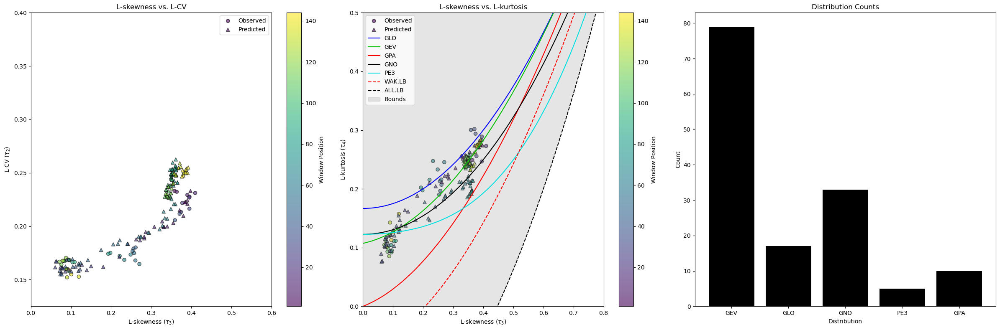

In [63]:
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter

# Assuming lmom_df, tau3_pred, tau4_pred, window_positions_obs, window_positions_pred are defined

# Extracting the values
tau_3 = data[:, 0]
GLO = data[:, 1]
GEV = data[:, 2]
GPA = data[:, 3]
GNO = data[:, 4]
PE3 = data[:, 5]
WAK_LB = data[:, 6]
ALL_LB = data[:, 7]

# Setup plot
fig, axs = plt.subplots(1, 3, figsize=(24, 8))

# L-skewness vs. L-CV Plot
scatter_obs_1 = axs[0].scatter(lmom_df['tau3'], lmom_df['tau2'], c=window_positions_obs, cmap='viridis', edgecolor='k', alpha=0.6, marker='o', label='Observed')
scatter_pred_1 = axs[0].scatter(tau3_pred, tau2_pred, c=window_positions_pred, cmap='viridis', edgecolor='k', alpha=0.6, marker='^', label='Predicted')
axs[0].set_xlabel('L-skewness ($\\tau_3$)')
axs[0].set_ylabel('L-CV ($\\tau_2$)')
axs[0].set_title('L-skewness vs. L-CV')
cb1 = fig.colorbar(scatter_pred_1, ax=axs[0], label='Window Position')
axs[0].legend()

# Adjust axis limits for L-skewness vs. L-CV Plot
axs[0].set_xlim(0.0, 0.6)
axs[0].set_ylim(0.125, 0.4)

# Function to calculate Euclidean distance between a point and a line
def euclidean_distance(x1, y1, x2, y2):
    return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)

# Determine closest distribution for each predicted window
closest_distributions = []

for tau3_p, tau4_p in zip(tau3_pred, tau4_pred):
    distances = {}
    
    distances['GLO'] = np.min(euclidean_distance(tau3_p, tau4_p, tau_3, GLO))
    distances['GEV'] = np.min(euclidean_distance(tau3_p, tau4_p, tau_3, GEV))
    distances['GPA'] = np.min(euclidean_distance(tau3_p, tau4_p, tau_3, GPA))
    distances['GNO'] = np.min(euclidean_distance(tau3_p, tau4_p, tau_3, GNO))
    distances['PE3'] = np.min(euclidean_distance(tau3_p, tau4_p, tau_3, PE3))
    distances['WAK_LB'] = np.min(euclidean_distance(tau3_p, tau4_p, tau_3, WAK_LB))
    distances['ALL_LB'] = np.min(euclidean_distance(tau3_p, tau4_p, tau_3, ALL_LB))
    
    closest_distribution = min(distances, key=distances.get)
    closest_distributions.append(closest_distribution)

# Count the number of times each distribution is selected
distribution_counts = Counter(closest_distributions)
majority_distribution = distribution_counts.most_common(1)[0]

# Print the list of closest distributions, the counts, and the majority distribution
print("Closest Distributions for Predicted Data Points:", closest_distributions)
print("Distribution counts:", distribution_counts)
print("Majority Distribution:", majority_distribution)

# Create a DataFrame for the closest distributions and window positions
df_closest = pd.DataFrame({
    'window': window_positions_pred,
    'distribution': closest_distributions
})

# Save the DataFrame to Excel and CSV
df_closest.to_excel('closest_distributions.xlsx', index=False)
df_closest.to_csv('closest_distributions.csv', index=False)

# L-skewness vs. L-kurtosis Plot
scatter_obs_2 = axs[1].scatter(lmom_df['tau3'], lmom_df['tau4'], c=window_positions_obs, cmap='viridis', edgecolor='k', alpha=0.6, marker='o', label='Observed')
scatter_pred_2 = axs[1].scatter(tau3_pred, tau4_pred, c=window_positions_pred, cmap='viridis', edgecolor='k', alpha=0.6, marker='^', label='Predicted')

# Highlight closest predicted points based on best-fit distribution
#for i, closest_dist in enumerate(closest_distributions):
    #if closest_dist == 'GLO':
        #axs[1].scatter(tau3_pred[i], tau4_pred[i], color='blue', s=100, edgecolor='k', alpha=0.8, marker='o')
    #elif closest_dist == 'GEV':
        #axs[1].scatter(tau3_pred[i], tau4_pred[i], color='#00C000', s=100, edgecolor='k', alpha=0.8, marker='o')
    #elif closest_dist == 'GPA':
        #axs[1].scatter(tau3_pred[i], tau4_pred[i], color='red', s=100, edgecolor='k', alpha=0.8, marker='o')
    #elif closest_dist == 'GNO':
        #axs[1].scatter(tau3_pred[i], tau4_pred[i], color='black', s=100, edgecolor='k', alpha=0.8, marker='o')
    #elif closest_dist == 'PE3':
        #axs[1].scatter(tau3_pred[i], tau4_pred[i], color='#00E0E0', s=100, edgecolor='k', alpha=0.8, marker='o')
    #elif closest_dist == 'WAK_LB':
        #axs[1].scatter(tau3_pred[i], tau4_pred[i], color='red', s=100, edgecolor='k', alpha=0.8, marker='o')
    #elif closest_dist == 'ALL_LB':
        #axs[1].scatter(tau3_pred[i], tau4_pred[i], color='black', s=100, edgecolor='k', alpha=0.8, marker='o')

# Plotting the extracted values
axs[1].plot(tau_3, GLO, label='GLO', color='blue', linestyle='solid')
axs[1].plot(tau_3, GEV, label='GEV', color='#00C000', linestyle='solid')
axs[1].plot(tau_3, GPA, label='GPA', color='red', linestyle='solid')
axs[1].plot(tau_3, GNO, label='GNO', color='black', linestyle='solid')
axs[1].plot(tau_3, PE3, label='PE3', color='#00E0E0', linestyle='solid')
axs[1].plot(tau_3, WAK_LB, label='WAK.LB', color='red', linestyle='--')
axs[1].plot(tau_3, ALL_LB, label='ALL.LB', color='black', linestyle='--')

# Fill the bounds
tau3_bounds = np.linspace(-1, 1, 1000)
tau4_lower_bound = (5 * tau3_bounds**2 - 1) / 4
tau4_upper_bound = 1
axs[1].fill_between(tau3_bounds, tau4_lower_bound, tau4_upper_bound, color='gray', alpha=0.2, label='Bounds')

# Adjust axis limits for L-skewness vs. L-kurtosis Plot
axs[1].set_xlim(0.0, 0.8)
axs[1].set_ylim(0.0, 0.5)

axs[1].set_xlabel('L-skewness ($\\tau_3$)')
axs[1].set_ylabel('L-kurtosis ($\\tau_4$)')
axs[1].set_title('L-skewness vs. L-kurtosis')
cb2 = fig.colorbar(scatter_pred_2, ax=axs[1], label='Window Position')
axs[1].legend()

# Histogram of Distribution Counts
distribution_names = list(distribution_counts.keys())
distribution_counts_values = list(distribution_counts.values())
bars = axs[2].bar(distribution_names, distribution_counts_values, color='black')
axs[2].set_xlabel('Distribution')
axs[2].set_ylabel('Count')
axs[2].set_title('Distribution Counts')

# Annotate bars with window positions
for bar, pos in zip(bars, window_positions_pred):
    height = bar.get_height()

plt.savefig('theo_ratios.png')

plt.tight_layout()
plt.show()

In [63]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Define the fit_gev function (assuming it's defined elsewhere)
def fit_gev(l_moments):
    loc1, scale1, c1 = pargev(l_moments)
    return loc1, scale1, c1

# Assuming goat_l_moments contains the observed L-moments
# Assuming predicted_l_moments contains the predicted L-moments

# Fit GEV to observed L-moments
params_Goat_obs = fit_gev(Goat_l_moments)

# Fit GEV to predicted L-moments
params_Goat_pred = fit_gev(goat_l_moments)

# Save the GEV parameters to a CSV file
def save_gev_params_to_csv(params, filename):
    loc, scale, shape = params
    params_df = pd.DataFrame({
        'Location': loc,
        'Scale': scale,
        'Shape': shape
    })
    params_df.to_csv(filename, index=False)

# Save the observed GEV parameters to a CSV file
save_gev_params_to_csv(params_Goat_obs, 'Goat_GEV_parameters_observed.csv')

# Save the projected GEV parameters to a CSV file
save_gev_params_to_csv(params_Goat_pred, 'Goat_GEV_parameters_projected.csv')

# The params_Goat_obs and params_Goat_pred variables now contain the fitted parameters (loc, scale, c)
# for the GEV distribution using all three L-moments at once.

# Extract the parameters for plotting
Goat_loc_obs, Goat_scale_obs, Goat_shape_obs = params_Goat_obs
Goat_loc_pred, Goat_scale_pred, Goat_shape_pred = params_Goat_pred

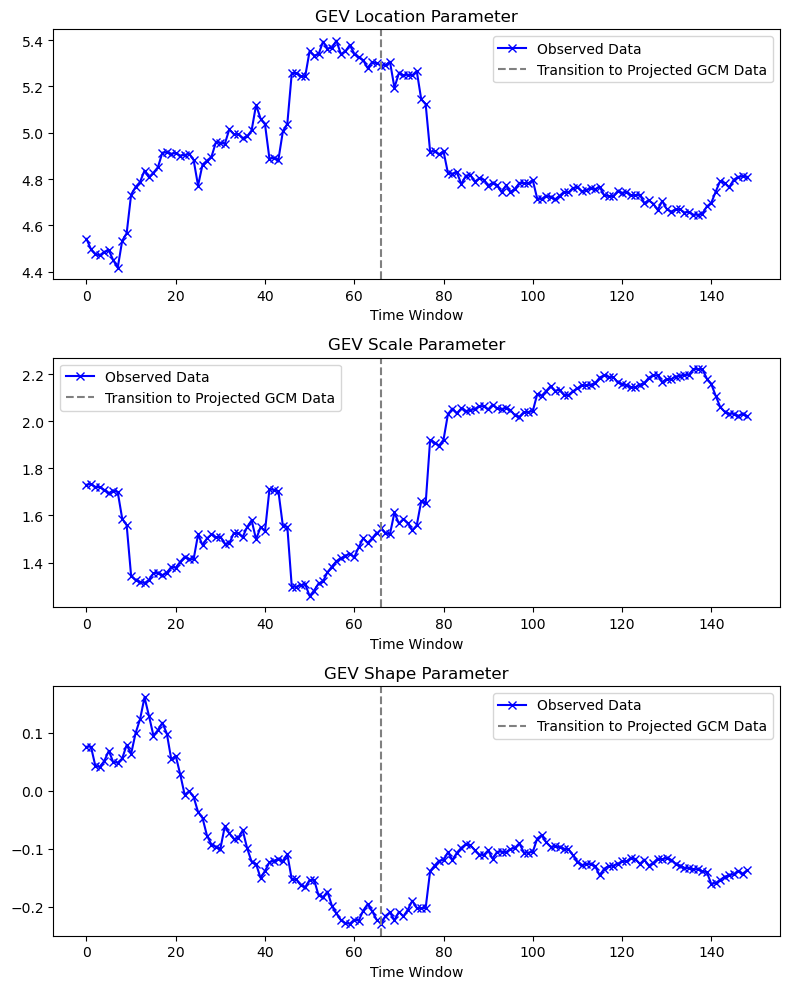

In [64]:
# Exclude the overlapping part of the projected parameters
overlap_length = len(Goat_loc_obs)
Goat_loc_pred = Goat_loc_pred[overlap_length:]
Goat_scale_pred = Goat_scale_pred[overlap_length:]
Goat_shape_pred = Goat_shape_pred[overlap_length:]

# Create subplots for each parameter
fig, axs = plt.subplots(3, 1, figsize=(8, 10))

# Plot location parameters
axs[0].plot(Goat_loc_obs, label='Observed Data', marker='x', color='blue')
axs[0].plot(np.arange(len(Goat_loc_obs), len(Goat_loc_obs) + len(Goat_loc_pred)), Goat_loc_pred, marker='x', color='blue')
axs[0].axvline(x=len(Goat_loc_obs), color='gray', linestyle='--', label='Transition to Projected GCM Data')
axs[0].set_title('GEV Location Parameter')
axs[0].legend()

# Plot scale parameters
axs[1].plot(Goat_scale_obs, label='Observed Data', marker='x', color='blue')
axs[1].plot(np.arange(len(Goat_scale_obs), len(Goat_scale_obs) + len(Goat_scale_pred)), Goat_scale_pred, marker='x', color='blue')
axs[1].axvline(x=len(Goat_scale_obs), color='gray', linestyle='--', label='Transition to Projected GCM Data')
axs[1].set_title('GEV Scale Parameter')
axs[1].legend()

# Plot shape parameters
axs[2].plot(Goat_shape_obs, label='Observed Data', marker='x', color='blue')
axs[2].plot(np.arange(len(Goat_shape_obs), len(Goat_shape_obs) + len(Goat_shape_pred)), Goat_shape_pred, marker='x', color='blue')
axs[2].axvline(x=len(Goat_shape_obs), color='gray', linestyle='--', label='Transition to Projected GCM Data')
axs[2].set_title('GEV Shape Parameter')
axs[2].legend()

# Set common x-axis label
for ax in axs:
    ax.set_xlabel('Time Window')

# Adjust spacing between subplots
plt.tight_layout()

# Save the plot as a PNG file
plt.savefig('GEV_params.png')

# Show the plot
plt.show()

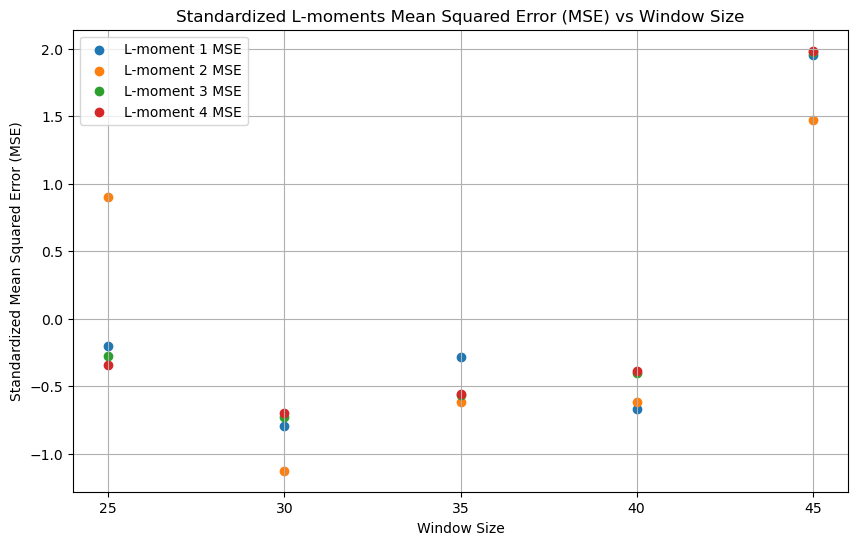

In [64]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

# Data from the image
data = {
    "Window Size": [25, 30, 35, 40, 45],
    "tau2 R^2": [0.550, 0.643, 0.730, 0.840, 0.864],
    "tau3 R^2": [0.863, 0.915, 0.910, 0.895, 0.744],
    "L-moment 1 MSE": [0.0664, 0.0073, 0.0588, 0.0196, 0.2837],
    "L-moment 2 MSE": [0.0204, 0.004, 0.0081, 0.0081, 0.025],
    "L-moment 3 MSE": [0.0093, 0.0012, 0.0041, 0.007, 0.0503],
    "L-moment 4 MSE": [0.0054, 0.0006, 0.0025, 0.0048, 0.0368]
}

df = pd.DataFrame(data)

# Standardize the MSE columns
scaler = StandardScaler()
df[df.columns[3:]] = scaler.fit_transform(df[df.columns[3:]])

# Plotting the data
plt.figure(figsize=(10, 6))

for column in df.columns[3:]:
    plt.scatter(df["Window Size"], df[column], label=column, marker='o')

plt.xticks(df["Window Size"])
plt.xlabel('Window Size')
plt.ylabel('Standardized Mean Squared Error (MSE)')
plt.title('Standardized L-moments Mean Squared Error (MSE) vs Window Size')
plt.legend()
plt.grid(True)
plt.show()

# For other Distributions using Hokings 2023 R Scirpt. ** Switch to R

# Generate Parameters from L-moments

## GEV

## Median and Mean All Distributions

## Exceednance over threshold 

## Best Fit

## As above but with adjustable threshold

# Back to Python Scripts

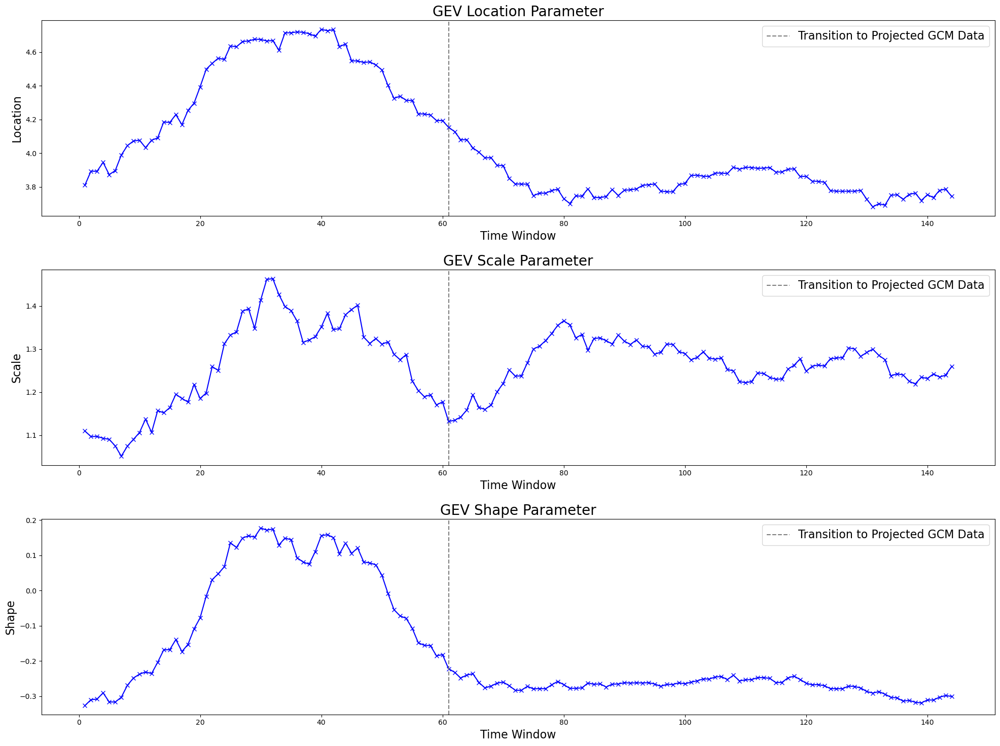

In [66]:
transition_window = overlap_length  # Ensure transition_window is defined

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the GEV parameters from a CSV file
def load_parameters(working_dir, file_name):
    file_path = f"{working_dir}/{file_name}"
    return pd.read_csv(file_path)

# Set the working directory
desired_dir = r"C:\Users\Local Admin\OneDrive - Lower Kootenay Band\Documents\workspace_python"

# Load parameters for GEV distribution
params_gev = load_parameters(desired_dir, 'GEV_parameters.csv')

# Extract the parameters
loc_array = params_gev['location']
scale_array = params_gev['scale']
shape_array = -params_gev['shape']  # Invert Shape Parameter

# Plotting the parameters
fig, axs = plt.subplots(3, 1, figsize=(20, 15))

# Increase font sizes
font_size = 16
plt.rcParams.update({'font.size': font_size})

# Plot location parameters
axs[0].plot(range(1, len(loc_array) + 1), loc_array, marker='x', linestyle='-', color='b')
axs[0].axvline(transition_window, color='gray', linestyle='--', label='Transition to Projected GCM Data')
axs[0].set_title('GEV Location Parameter', fontsize=font_size + 4)
axs[0].set_xlabel('Time Window', fontsize=font_size)
axs[0].set_ylabel('Location', fontsize=font_size)
axs[0].legend(fontsize=font_size)

# Plot scale parameters
axs[1].plot(range(1, len(scale_array) + 1), scale_array, marker='x', linestyle='-', color='b')
axs[1].axvline(transition_window, color='gray', linestyle='--', label='Transition to Projected GCM Data')
axs[1].set_title('GEV Scale Parameter', fontsize=font_size + 4)
axs[1].set_xlabel('Time Window', fontsize=font_size)
axs[1].set_ylabel('Scale', fontsize=font_size)
axs[1].legend(fontsize=font_size)

# Plot shape parameters
axs[2].plot(range(1, len(shape_array) + 1), shape_array, marker='x', linestyle='-', color='b')
axs[2].axvline(transition_window, color='gray', linestyle='--', label='Transition to Projected GCM Data')
axs[2].set_title('GEV Shape Parameter', fontsize=font_size + 4)
axs[2].set_xlabel('Time Window', fontsize=font_size)
axs[2].set_ylabel('Shape', fontsize=font_size)
axs[2].legend(fontsize=font_size)

# Adjust spacing between subplots
plt.tight_layout()

# Save the plot as an image
plt.savefig(f"{desired_dir}/GEV_parameter_distribution.png", bbox_inches='tight')
plt.show()

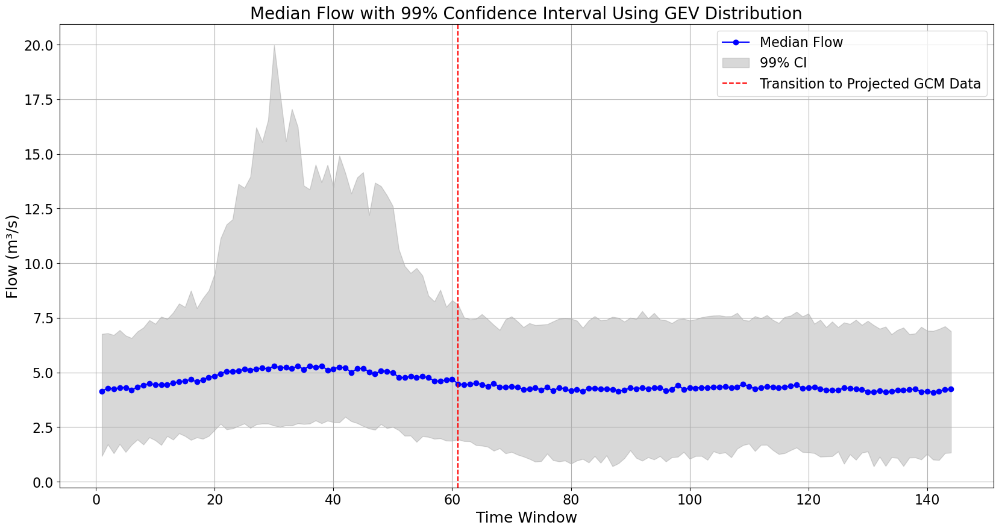

61


In [68]:
transition_window = overlap_length  # Ensure transition_window is defined

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import genextreme as gev

# Load the GEV parameters from a CSV file
def load_parameters(working_dir, file_name):
    file_path = f"{working_dir}/{file_name}"
    return pd.read_csv(file_path)

# Set the working directory
desired_dir = r"C:\Users\Local Admin\OneDrive - Lower Kootenay Band\Documents\workspace_python"

# Load parameters for GEV distributions
params_gev = load_parameters(desired_dir, 'GEV_parameters.csv')

# Number of simulations
num_simulations = 1000

# Initialize arrays to store simulation results
num_windows = len(params_gev)
simulation_data = np.zeros((num_windows, num_simulations))

# Simulate flows using GEV for all windows
for j in range(num_windows):
    # Use GEV distribution
    location, scale, shape = params_gev.loc[j, ['location', 'scale', 'shape']]
    c = shape  # Note: shape parameter for genextreme is -k

    # Validate parameters
    if scale <= 0:
        raise ValueError(f"Invalid scale parameter at window {j}: {scale} must be positive.")

    for i in range(num_simulations):
        random_data = gev.rvs(c=c, loc=location, scale=scale, size=1)[0]

        # Ensure generated value is >= 0
        while random_data < 0:
            random_data = gev.rvs(c=c, loc=location, scale=scale, size=1)[0]

        simulation_data[j, i] = random_data

# Calculate median flows and 99% CI
median_flows = np.median(simulation_data, axis=1)
confidence_interval = np.percentile(simulation_data, [0.5, 99.5], axis=1)

# Plotting the median flows and 99% CI
plt.figure(figsize=(20, 10))
plt.plot(range(1, num_windows + 1), median_flows, marker='o', linestyle='-', color='b', label='Median Flow')
plt.fill_between(range(1, num_windows + 1), confidence_interval[0], confidence_interval[1], color='gray', alpha=0.3, label='99% CI')
plt.axvline(x=transition_window, color='red', linestyle='--', label='Transition to Projected GCM Data')
plt.title('Median Flow with 99% Confidence Interval Using GEV Distribution', fontsize=20)
plt.xlabel('Time Window', fontsize=18)
plt.ylabel('Flow (m³/s)', fontsize=18)
plt.legend()
plt.grid(True)

# Save the plot as an image
plt.savefig(f"{desired_dir}/flow_simulation_gev.png", bbox_inches='tight')
plt.show()

print(transition_window)

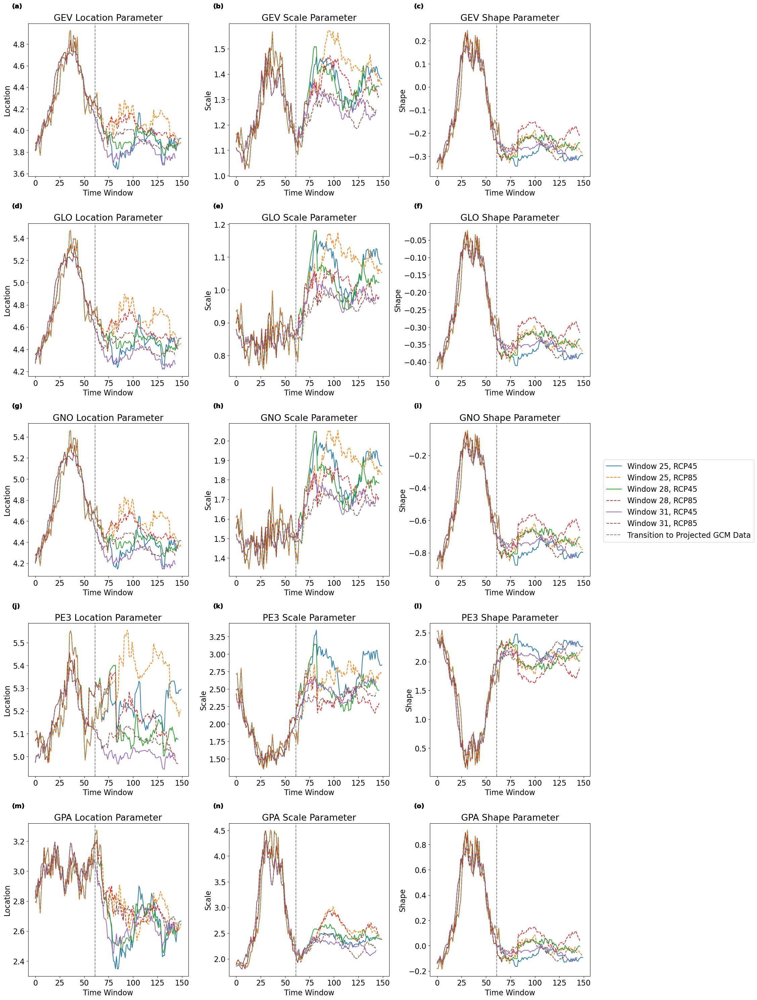

In [68]:
import pandas as pd
import matplotlib.pyplot as plt
import glob
import numpy as np

flip_signs = {
    'GEV': {'location': False, 'scale': False, 'shape': True},
    'GLO': {'location': False, 'scale': False, 'shape': False},
    'GNO': {'location': False, 'scale': False, 'shape': False},
    'PE3': {'location': False, 'scale': False, 'shape': False},
    'GPA': {'location': False, 'scale': False, 'shape': False}
}

# Load parameters from CSV files for each distribution
def load_parameters(file):
    df = pd.read_csv(file)
    df.columns = [col.lower() for col in df.columns]  # Standardize column names to lowercase
    return df

# Combine parameters and apply flipping if needed
def combine_params(file, dist):
    params_df = load_parameters(file)
    
    loc_params = params_df['location']
    scale_params = params_df['scale']
    shape_params = params_df['shape']
    
    # Apply flipping based on configuration
    if flip_signs[dist]['location']:
        loc_params = -loc_params
    if flip_signs[dist]['scale']:
        scale_params = -scale_params
    if flip_signs[dist]['shape']:
        shape_params = -shape_params

    return loc_params, scale_params, shape_params

# Function to determine line style based on filename
def get_line_style(file):
    if 'RCP45' in file:
        return '-'
    elif 'RCP85' in file:
        return '--'
    else:
        return '-.'

# Parameters
distributions = ['GEV', 'GLO', 'GNO', 'PE3', 'GPA']
params_files = {
    'GEV': 'GEV_parameters.csv',
    'GLO': 'GLO_parameters.csv',
    'GNO': 'GNO_parameters.csv',
    'PE3': 'PE3_parameters.csv',
    'GPA': 'GPA_parameters.csv'
}

rcp_scenario = 'RCP85' if rcp_85 == 'On' else 'RCP45'
gcm_model = 'GCM1'  # Replace with actual GCM model variable

# Process and save combined parameters for each distribution
for dist in distributions:
    file = params_files[dist]
    loc_params, scale_params, shape_params = combine_params(file, dist)
    
    combined_params_df = pd.DataFrame({
        'location': loc_params,
        'scale': scale_params,
        'shape': shape_params
    })
    combined_filename = f'{dist}_parameters_Window_{window_size}_{gcm_model}_{rcp_scenario}.csv'
    combined_params_df.to_csv(combined_filename, index=False)

# Load all combined CSV files
csv_files = glob.glob('*_parameters_Window_*.csv')

# Create subplots for each parameter
fig, axs = plt.subplots(len(distributions), 3, figsize=(18, 6 * len(distributions)))  # Adjust height based on number of distributions

# Plot each combined file
legend_handles = []
legend_labels = []

# Alphabet labels
alphabet = "abcdefghijklmnopqrstuvwxyz"

for file_idx, file in enumerate(csv_files):
    parts = file.split('_')
    dist = parts[0]
    window_size = parts[-3]
    gcm_model = parts[-2]
    rcp_scenario = parts[-1].split('.')[0]
    
    # Check if dist is in the distributions list
    if dist not in distributions:
        continue
    
    combined_params_df = load_parameters(file)
    combined_loc_params = combined_params_df['location']
    combined_scale_params = combined_params_df['scale']
    combined_shape_params = combined_params_df['shape']
    
    line_style = get_line_style(file)
    
    dist_index = distributions.index(dist)
    
    # Plot location parameters
    handle, = axs[dist_index, 0].plot(combined_loc_params, line_style, label=f'Window {window_size}, {rcp_scenario}')
    if f'Window {window_size}, {rcp_scenario}' not in legend_labels:
        legend_handles.append(handle)
        legend_labels.append(f'Window {window_size}, {rcp_scenario}')
    
    # Plot scale parameters
    axs[dist_index, 1].plot(combined_scale_params, line_style)
    
    # Plot shape parameters
    axs[dist_index, 2].plot(combined_shape_params, line_style)
    
    # Add alphabet labels to the plots
    for col_idx in range(3):
        axs[dist_index, col_idx].text(-0.1, 1.1, f"({alphabet[3 * dist_index + col_idx]})", transform=axs[dist_index, col_idx].transAxes,
                                      size=14, weight='bold')

# Add transition line with a dummy plot for legend
for dist_index in range(len(distributions)):
    for ax in axs[dist_index]:
        ax.axvline(x=overlap_length, color='gray', linestyle='--')

# Add a dummy plot for the transition line
dummy_line = plt.Line2D([], [], color='gray', linestyle='--', label='Transition to Projected GCM Data')
legend_handles.append(dummy_line)
legend_labels.append('Transition to Projected GCM Data')

# Set titles and labels
for dist_index, dist in enumerate(distributions):
    axs[dist_index, 0].set_title(f'{dist} Location Parameter')
    axs[dist_index, 0].set_xlabel('Time Window')
    axs[dist_index, 0].set_ylabel('Location')

    axs[dist_index, 1].set_title(f'{dist} Scale Parameter')
    axs[dist_index, 1].set_xlabel('Time Window')
    axs[dist_index, 1].set_ylabel('Scale')

    axs[dist_index, 2].set_title(f'{dist} Shape Parameter')
    axs[dist_index, 2].set_xlabel('Time Window')
    axs[dist_index, 2].set_ylabel('Shape')

# Adjust spacing between subplots
plt.tight_layout()

# Add a single legend for all subplots
fig.legend(legend_handles, legend_labels, loc='center left', bbox_to_anchor=(1.0, 0.5))

# Save the plot as a PNG file
plt.savefig('sensitivity.png', bbox_inches='tight')

# Show the plot
plt.show()

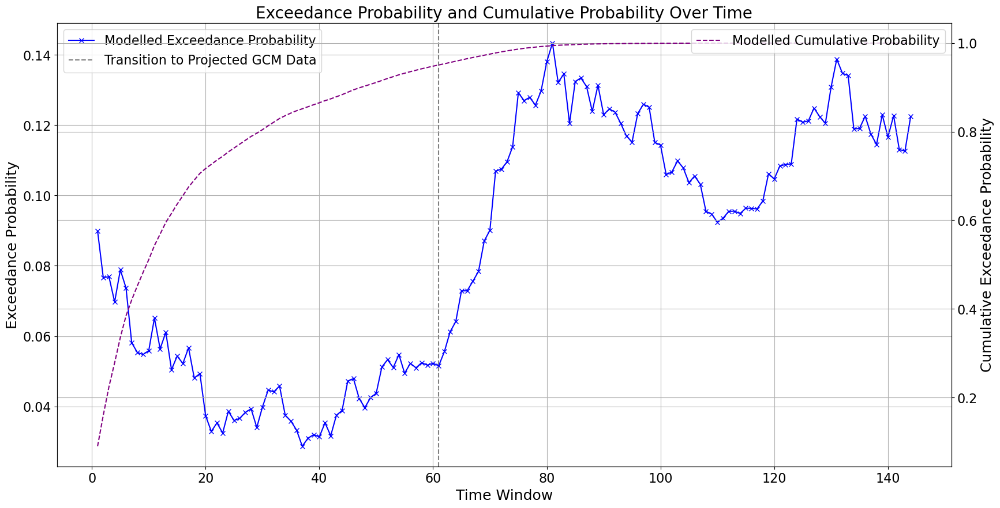

In [69]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import genextreme as gev

# Function to load the parameters
def load_parameters(working_dir, file_name):
    file_path = f"{working_dir}/{file_name}"
    return pd.read_csv(file_path)

# Set the working directory
desired_dir = r"C:\Users\Local Admin\OneDrive - Lower Kootenay Band\Documents\workspace_python"

# Load parameters for GEV distributions
params_gev = load_parameters(desired_dir, 'GEV_parameters.csv')

# Initialize arrays to store simulation results
num_windows = len(params_gev)
num_simulations = 1000

simulation_data = np.zeros((num_windows, num_simulations))

# Simulate flows using GEV for all windows
for j in range(num_windows):
    location, scale, shape = params_gev.loc[j, ['location', 'scale', 'shape']] 
    
    for i in range(num_simulations):
        random_data = gev.rvs(c=c, loc=location, scale=scale, size=num_data_points)
        random_data = np.maximum(0, random_data)  # Ensure non-negative values

        if low_flow == "On":
            exceedance_counts = np.sum(random_data < threshold)
        else:
            exceedance_counts = np.sum(random_data > threshold)
        
        simulation_data[j, i] = exceedance_counts / num_data_points

# Calculate exceedance probability
exceedance_probabilities = np.mean(simulation_data, axis=1)

# Calculate cumulative exceedance probability
cumulative_probabilities = []
cumulative = 1.0
for p in exceedance_probabilities:
    cumulative *= (1 - p)
    cumulative_probabilities.append(1 - cumulative)
cumulative_probabilities = np.array(cumulative_probabilities)


# Plotting the exceedance and cumulative probabilities
fig, ax1 = plt.subplots(figsize=(20, 10))

# Plot exceedance probabilities on the primary y-axis
ax1.plot(range(1, num_windows + 1), exceedance_probabilities, label='Modelled Exceedance Probability', marker='x', color='blue')
ax1.axvline(x=transition_window, color='gray', linestyle='--', label='Transition to Projected GCM Data')
ax1.set_xlabel('Time Window', fontsize=18)
ax1.set_ylabel('Exceedance Probability', fontsize=18)
ax1.legend(loc='upper left')
ax1.grid(True)

# Create a secondary y-axis for cumulative probabilities
ax2 = ax1.twinx()
ax2.plot(range(1, num_windows + 1), cumulative_probabilities, label='Modelled Cumulative Probability', linestyle='--', color='purple')
ax2.set_ylabel('Cumulative Exceedance Probability', fontsize=18)
ax2.legend(loc='upper right')

plt.title('Exceedance Probability and Cumulative Probability Over Time', fontsize=20)
plt.grid(True)

# Save the plot as an image
plt.savefig(f"{desired_dir}/probabilities.png", bbox_inches='tight')
plt.show()